# **0. 패키지 로딩**

In [ ]:
### 기본
import numpy as np
import pandas as pd
import os
import gc
import warnings

### 시각화
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px # 동적 시각화

## 옵션 설정
pd.set_option('display.max_columns', None)
pd.options.display.float_format = '{:.2f}'.format
warnings.filterwarnings('ignore')

### 시계열 분석 패키지(ACF, PACF)
import statsmodels.api as sm

# **1. 데이터 불러오기**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
train = pd.read_csv('/content/drive/MyDrive/ESAA 8기/OB/winter_proj/방학프로젝트/data/train_preprocessed.csv')
test = pd.read_csv('/content/drive/MyDrive/ESAA 8기/OB/winter_proj/방학프로젝트/data/test_preprocessed.csv')

In [ ]:
train.head()

,id,date,store_nbr,family,sales,onpromotion,city,state,type,cluster,dcoilwtico,transactions,holiday
0,0,2013-01-01,1,AUTOMOTIVE,0.00,0.00,Quito,Pichincha,D,13,93.14,0.00,National
1,1,2013-01-01,41,SEAFOOD,0.00,0.00,Machala,El Oro,D,4,93.14,0.00,National
2,2,2013-01-01,41,SCHOOL AND OFFICE SUPPLIES,0.00,0.00,Machala,El Oro,D,4,93.14,0.00,National
3,3,2013-01-01,41,PRODUCE,0.00,0.00,Machala,El Oro,D,4,93.14,0.00,National
4,4,2013-01-01,41,PREPARED FOODS,0.00,0.00,Machala,El Oro,D,4,93.14,0.00,National


In [ ]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2705087 entries, 0 to 2705086
Data columns (total 13 columns):
 #   Column        Dtype  
---  ------        -----  
 0   id            int64  
 1   date          object 
 2   store_nbr     int64  
 3   family        object 
 4   sales         float64
 5   onpromotion   float64
 6   city          object 
 7   state         object 
 8   type          object 
 9   cluster       int64  
 10  dcoilwtico    float64
 11  transactions  float64
 12  holiday       object 
dtypes: float64(4), int64(3), object(6)
memory usage: 268.3+ MB


In [ ]:
test.head()

,id,date,store_nbr,family,onpromotion,city,state,type,cluster,dcoilwtico,holiday
0,3000888,2017-08-16,1,AUTOMOTIVE,0,Quito,Pichincha,D,13,46.80,Weekday
1,3000889,2017-08-16,1,BABY CARE,0,Quito,Pichincha,D,13,46.80,Weekday
2,3000890,2017-08-16,1,BEAUTY,2,Quito,Pichincha,D,13,46.80,Weekday
3,3000891,2017-08-16,1,BEVERAGES,20,Quito,Pichincha,D,13,46.80,Weekday
4,3000892,2017-08-16,1,BOOKS,0,Quito,Pichincha,D,13,46.80,Weekday


In [ ]:
# date를 datetime 형으로 변경

train['date'] = pd.to_datetime(train['date'])
test['date'] = pd.to_datetime(test['date'])

In [ ]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2705087 entries, 0 to 2705086
Data columns (total 13 columns):
 #   Column        Dtype         
---  ------        -----         
 0   id            int64         
 1   date          datetime64[ns]
 2   store_nbr     int64         
 3   family        object        
 4   sales         float64       
 5   onpromotion   float64       
 6   city          object        
 7   state         object        
 8   type          object        
 9   cluster       int64         
 10  dcoilwtico    float64       
 11  transactions  float64       
 12  holiday       object        
dtypes: datetime64[ns](1), float64(4), int64(3), object(5)
memory usage: 268.3+ MB


In [ ]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28512 entries, 0 to 28511
Data columns (total 11 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   id           28512 non-null  int64         
 1   date         28512 non-null  datetime64[ns]
 2   store_nbr    28512 non-null  int64         
 3   family       28512 non-null  object        
 4   onpromotion  28512 non-null  int64         
 5   city         28512 non-null  object        
 6   state        28512 non-null  object        
 7   type         28512 non-null  object        
 8   cluster      28512 non-null  int64         
 9   dcoilwtico   28512 non-null  float64       
 10  holiday      28512 non-null  object        
dtypes: datetime64[ns](1), float64(1), int64(4), object(5)
memory usage: 2.4+ MB


- 제대로 변경되었다.

## **📌 Data Description**
| Index | Column        | Description                     |
|-------|---------------|---------------------------------|
| 1     | id            | 각 데이터를 구분하기 위한 식별자|
| 2     | date          |판매일자                         |
| 3     | store_nbr     |매장 고유 식별번호               |
| 4     | family        |판매되는 제품군 유형             |
| 5     | sales         |매출액, **target 변수**        |
| 6     | onpromotion   |프로모션 대상 제품 수            |
| 7     | city          |도시                             |
| 8     | state         |주                               |
| 9     | type          |매장 유형                        |
| 10    | cluster       |유사한 매장들의 군집             |
| 11    | dcoilwtico    |유가(기름값)                     |
| 12    | transactions  |거래량                           |
| 13    | holiday       |공휴일 종류                      |



# **2. 시계열 분석**
- target 변수에 대한 시계열 분석을 진행해 보자.

In [ ]:
### 시계열 분석 시에는 일별 평균값을 활용할 예정

# sales가 없는(0인) 데이터는 제외
train2 = train[train['sales'] != 0]

# 일별 평균 계산
daily_average = train2.groupby(['date'])['sales'].mean()

## **2-1. 시도표**

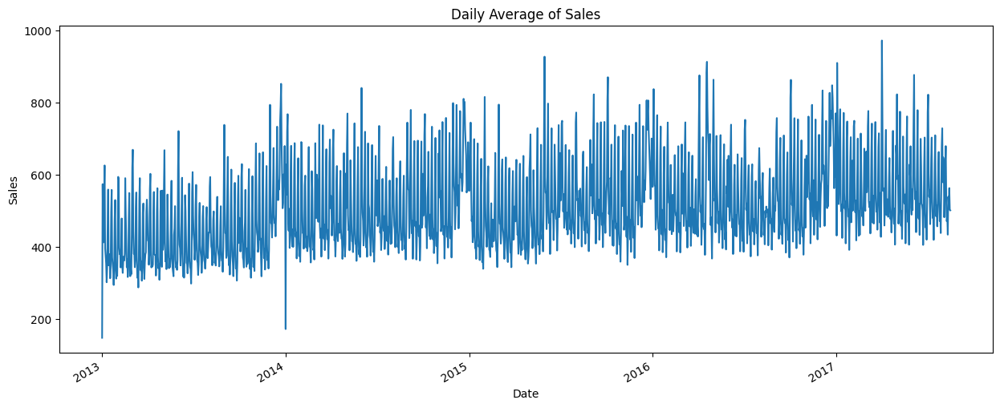

In [ ]:
daily_average.plot(figsize = (15, 6))
plt.title('Daily Average of Sales')
plt.xlabel('Date')
plt.ylabel('Sales')
plt.show()

- 중간중간 휴업으로 인한 불규칙성을 보임
- 특히 2013, 2014년 초에 급격한 매출 저하를 보이는 구간들이 존재

## **2-2. 시계열 분해(time series decomposition)**

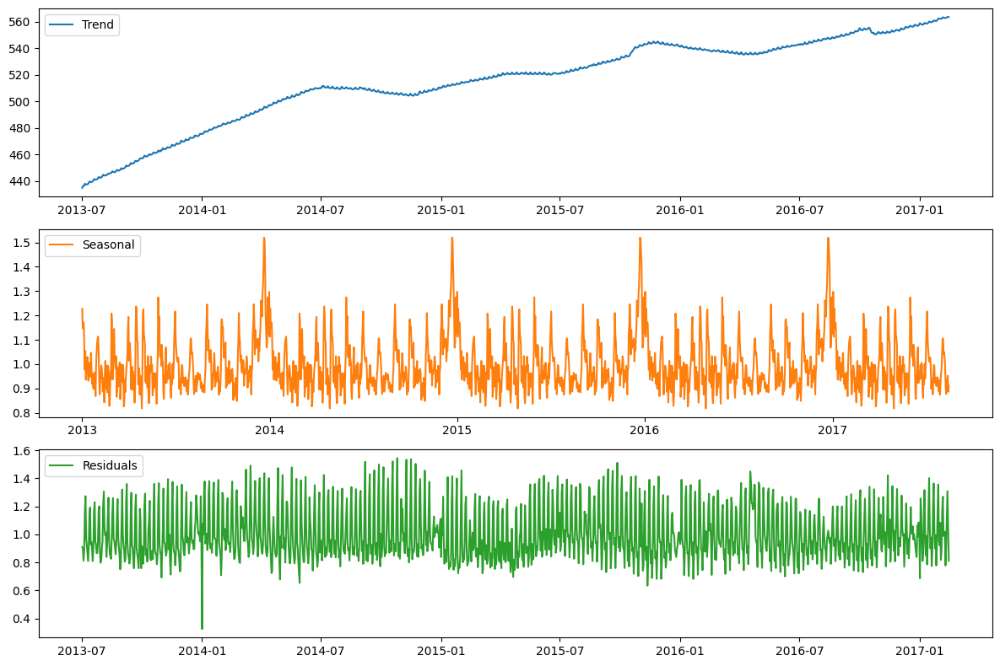

In [ ]:
## 시계열 데이터 분해(연 단위로 분해)
result = sm.tsa.seasonal_decompose(daily_average, model='multiplicative', period=365)

# 색상 설정
colors = plt.cm.tab10.colors

# 시각화
plt.figure(figsize=(12, 8))

# 추세(Trend)
plt.subplot(3, 1, 1)
plt.plot(result.trend, label='Trend', color=colors[0])
plt.legend(loc='upper left')

# 계절성(Seasonality)
plt.subplot(3, 1, 2)
plt.plot(result.seasonal, label='Seasonal', color=colors[1])
plt.legend(loc='upper left')

# 잔차(Residuals) 분석
plt.subplot(3, 1, 3)
plt.plot(result.resid, label='Residuals', color=colors[2])
plt.legend(loc='upper left')

# 레이아웃 조정
plt.tight_layout()

# 시각화 표시
plt.show()

- 추세(Trend)
  - 우상향 추세를 보인다.
  > 향후에도 매출액이 증가할 것이라고 예측할 수 있다.

- 계절성(Seasonality)
  - 주로 연말(11~12월)에 매출이 증가하고 이후 감소한다.
  > 계절적 주기성이 존재한다.
  
- 잔차 분석
  - 잔차에 어떠한 패턴을 보이고 있지 않다.


## **2-3. 정상성(Stationarity)**

### **1️⃣ ACF, PACF**

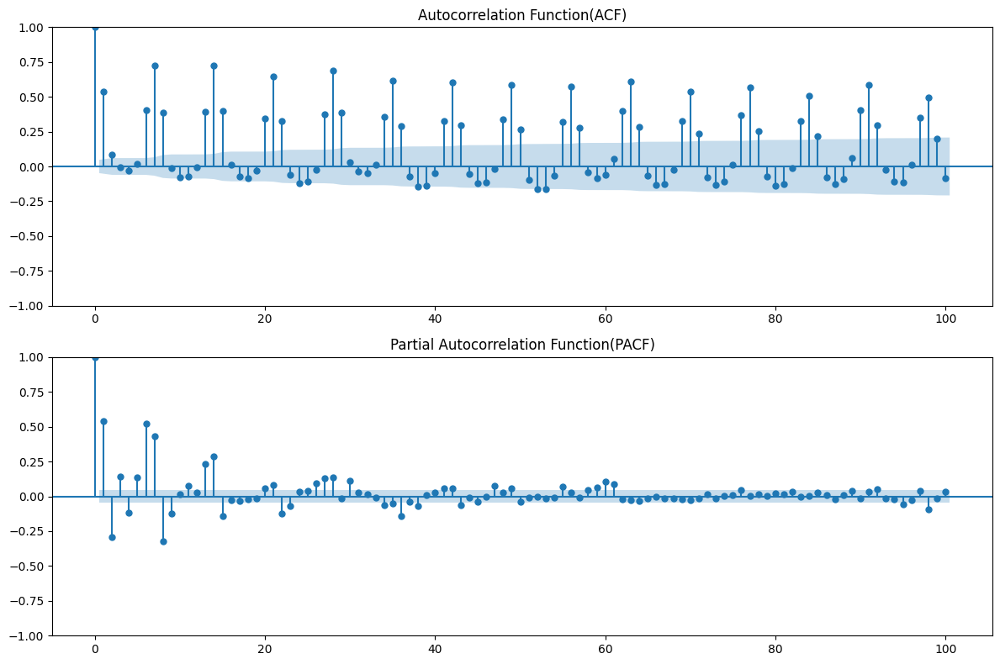

In [ ]:
# ACF 및 PACF 계산 및 시각화
fig, axes = plt.subplots(2, 1, figsize=(12, 8))

# ACF 시각화
sm.graphics.tsa.plot_acf(daily_average, lags=100, ax=axes[0])
axes[0].set_title('Autocorrelation Function(ACF)')

# PACF 시각화
sm.graphics.tsa.plot_pacf(daily_average, lags=100, ax=axes[1])
axes[1].set_title('Partial Autocorrelation Function(PACF)')

# 레이아웃 조정
plt.tight_layout()

# 시각화 표시
plt.show()

- ACF 그래프 시각화 결과 특정 패턴이 존재한다
  - 곡선의 형태를 가지며 점점 감소하는 형태

> 비정상 시계열이라고 짐작할 수 있다.

- PACF 그래프를 통해서는 별다른 특징을 파악하긴 어렵다.



### **2️⃣ ADF 검정(Augmented Dickey-Fuller Test)**
- 시계열 데이터의 안정성을 평가하는 통계적인 방법
  - 다음 가설을 검증하며, 귀무가설이 기각되면 해당 시계열은 안정적이라고 간주
    - 귀무가설(H0): 시계열 데이터는 단위근(Non-stationary)을 가진다.  
      (즉, 안정적이지 않다)
    - 대립가설(H1): 시계열 데이터는 안정적이다.

In [ ]:
from statsmodels.tsa.stattools import adfuller

# ADF 검정 수행
result = adfuller(daily_average)

# 결과 출력
print('ADF Statistic:', result[0])
print('p-value:', result[1])

ADF Statistic: -4.077050002235016
p-value: 0.001056669423237086


시계열 데이터는 안정적이다.

> 상충된 결과가 도출됨
> 시각적으로 너무나도 비정상 시계열의 특징을 띄고 있다.

**❓ 비정상성은 어떻게 해결하나?**
- 시계열 분석에서 정상성은 중요한 가정 중 하나
  - 통계적 추정의 안정성, 예측 성능 향상
- 주로 차분 등을 활용하여 정상성을 확보하고자 함

---
현재 우리는 2가지 문제점이 존재

1) 매장마다 개업 일자가 다름  
2) 중간에 휴업을 한 경우들도 존재  

> 차분의 어려움  
> 다른 파생 변수들을 통해 보완할 예정  


In [ ]:
### 더 이상 일자가 연속될 필요가 없으므로 'sales'가 0인 데이터 삭제

train = train[train['sales'] != 0]

### **3️⃣ 시간 관련 변수**
- 시간적인 정보를 제공하기 위한 파생 변수들을 생성하자.

In [ ]:
train['year'] = train['date'].dt.year # 연도
train['quarter'] = train['date'].dt.quarter # 분기별
train['month'] = train['date'].dt.month # 월
train['day_of_week'] = train['date'].dt.dayofweek # 요일

In [ ]:
train.head()

,id,date,store_nbr,family,sales,onpromotion,city,state,type,cluster,dcoilwtico,transactions,holiday,year,quarter,month,day_of_week
1427,1427,2013-01-01,25,GROCERY II,15.00,0.00,Salinas,Santa Elena,D,1,93.14,770.00,National,2013,1,1,1
1428,1428,2013-01-01,25,GROCERY I,700.00,0.00,Salinas,Santa Elena,D,1,93.14,770.00,National,2013,1,1,1
1429,1429,2013-01-01,25,FROZEN FOODS,29.65,0.00,Salinas,Santa Elena,D,1,93.14,770.00,National,2013,1,1,1
1430,1430,2013-01-01,25,DELI,71.09,0.00,Salinas,Santa Elena,D,1,93.14,770.00,National,2013,1,1,1
1431,1431,2013-01-01,25,DAIRY,143.00,0.00,Salinas,Santa Elena,D,1,93.14,770.00,National,2013,1,1,1


In [ ]:
test['year'] = test['date'].dt.year # 연도
test['quarter'] = test['date'].dt.quarter # 분기별
test['month'] = test['date'].dt.month # 월
test['day_of_week'] = test['date'].dt.dayofweek # 요일

In [ ]:
test.head()

,id,date,store_nbr,family,onpromotion,city,state,type,cluster,dcoilwtico,holiday,year,quarter,month,day_of_week
0,3000888,2017-08-16,1,AUTOMOTIVE,0,Quito,Pichincha,D,13,46.80,Weekday,2017,3,8,2
1,3000889,2017-08-16,1,BABY CARE,0,Quito,Pichincha,D,13,46.80,Weekday,2017,3,8,2
2,3000890,2017-08-16,1,BEAUTY,2,Quito,Pichincha,D,13,46.80,Weekday,2017,3,8,2
3,3000891,2017-08-16,1,BEVERAGES,20,Quito,Pichincha,D,13,46.80,Weekday,2017,3,8,2
4,3000892,2017-08-16,1,BOOKS,0,Quito,Pichincha,D,13,46.80,Weekday,2017,3,8,2


# **3. EDA**

## **3-1. type**
- type에 따라 store은 어떻게 구분될 것일까?

In [ ]:
### type에 따른 매장 수

for i in ["A", 'B', 'C', 'D', 'E']:
  print("type {}: {}".format(i, train.loc[(train['type'] == i),'store_nbr'].nunique()))

type A: 9
type B: 8
type C: 15
type D: 18
type E: 4


In [ ]:
### type 별 제품군

for i in ["A", 'B', 'C', 'D', 'E']:
  print("type {}: {}".format(i, train.loc[(train['type'] == i),'family'].nunique()))

type A: 32
type B: 32
type C: 32
type D: 33
type E: 32


In [ ]:
### 타입별 주

for i in ["A", 'B', 'C', 'D', 'E']:
  print("type {}: {}".format(i, train.loc[(train['type'] == i),'state'].unique()))

type A: ['Pichincha' 'Guayas' 'Tungurahua' 'Manabi']
type B: ['Guayas' 'Azuay' 'Pichincha' 'Los Rios' 'Santo Domingo de los Tsachilas']
type C: ['El Oro' 'Guayas' 'Manabi' 'Pichincha' 'Santo Domingo de los Tsachilas'
 'Imbabura' 'Bolivar' 'Cotopaxi' 'Los Rios' 'Chimborazo' 'Pastaza']
type D: ['Santa Elena' 'El Oro' 'Pichincha' 'Azuay' 'Loja'
 'Santo Domingo de los Tsachilas' 'Tungurahua' 'Guayas' 'Manabi']
type E: ['Esmeraldas' 'Guayas']


In [ ]:
### 타입별 도시

for i in ["A", 'B', 'C', 'D', 'E']:
  print("type {}: {}".format(i, train.loc[(train['type'] == i),'city'].unique()))

type A: ['Quito' 'Guayaquil' 'Ambato' 'Manta']
type B: ['Guayaquil' 'Cuenca' 'Quito' 'Cayambe' 'Babahoyo' 'Santo Domingo']
type C: ['Machala' 'Playas' 'El Carmen' 'Quito' 'Santo Domingo' 'Ibarra'
 'Guaranda' 'Latacunga' 'Quevedo' 'Riobamba' 'Guayaquil' 'Puyo']
type D: ['Salinas' 'Machala' 'Quito' 'Cuenca' 'Loja' 'Santo Domingo' 'Ambato'
 'Guayaquil' 'Daule' 'Manta']
type E: ['Esmeraldas' 'Guayaquil' 'Libertad']


In [ ]:
### 타입별 cluster

for i in ["A", 'B', 'C', 'D', 'E']:
  print("type {}: {}".format(i, train.loc[(train['type'] == i),'cluster'].unique()))

type A: [ 5 11 14 17]
type B: [ 6 16 10]
type C: [ 3 12 15  7]
type D: [ 1  4  9  2 13  8 10]
type E: [10]


## **3-2. cluster**

In [ ]:
for i in  range(1,18):
  print("cluster {}: {}".format(i, train.loc[(train['cluster'] == i),'store_nbr'].nunique()))

cluster 1: 3
cluster 2: 2
cluster 3: 7
cluster 4: 3
cluster 5: 1
cluster 6: 6
cluster 7: 2
cluster 8: 3
cluster 9: 2
cluster 10: 6
cluster 11: 3
cluster 12: 1
cluster 13: 4
cluster 14: 4
cluster 15: 5
cluster 16: 1
cluster 17: 1


In [ ]:
for i in  range(1,18):
  print("cluster {}: {}".format(i, train.loc[(train['cluster'] == i),'family'].nunique()))

cluster 1: 33
cluster 2: 33
cluster 3: 32
cluster 4: 33
cluster 5: 32
cluster 6: 32
cluster 7: 32
cluster 8: 33
cluster 9: 33
cluster 10: 33
cluster 11: 32
cluster 12: 32
cluster 13: 33
cluster 14: 32
cluster 15: 32
cluster 16: 32
cluster 17: 32


In [ ]:
for i in  range(1,18):
  print("cluster {}: {}".format(i, train.loc[(train['cluster'] == i),'state'].unique()))

cluster 1: ['Santa Elena' 'Guayas']
cluster 2: ['Azuay']
cluster 3: ['El Oro' 'Guayas' 'Manabi' 'Santo Domingo de los Tsachilas' 'Los Rios']
cluster 4: ['El Oro' 'Loja' 'Santo Domingo de los Tsachilas']
cluster 5: ['Pichincha']
cluster 6: ['Guayas' 'Azuay' 'Pichincha' 'Santo Domingo de los Tsachilas']
cluster 7: ['Chimborazo' 'Pastaza']
cluster 8: ['Pichincha']
cluster 9: ['Pichincha' 'Tungurahua']
cluster 10: ['Esmeraldas' 'Guayas' 'Los Rios']
cluster 11: ['Pichincha' 'Manabi']
cluster 12: ['Pichincha']
cluster 13: ['Pichincha' 'Manabi']
cluster 14: ['Pichincha' 'Tungurahua']
cluster 15: ['Imbabura' 'Bolivar' 'Pichincha' 'Cotopaxi']
cluster 16: ['Pichincha']
cluster 17: ['Guayas']


In [ ]:
for i in  range(1,18):
  print("cluster {}: {}".format(i, train.loc[(train['cluster'] == i),'city'].unique()))

cluster 1: ['Salinas' 'Guayaquil' 'Daule']
cluster 2: ['Cuenca']
cluster 3: ['Machala' 'Playas' 'El Carmen' 'Santo Domingo' 'Quevedo' 'Guayaquil']
cluster 4: ['Machala' 'Loja' 'Santo Domingo']
cluster 5: ['Quito']
cluster 6: ['Guayaquil' 'Cuenca' 'Quito' 'Cayambe' 'Santo Domingo']
cluster 7: ['Riobamba' 'Puyo']
cluster 8: ['Quito']
cluster 9: ['Quito' 'Ambato']
cluster 10: ['Esmeraldas' 'Guayaquil' 'Babahoyo' 'Libertad']
cluster 11: ['Quito' 'Manta']
cluster 12: ['Quito']
cluster 13: ['Quito' 'Manta']
cluster 14: ['Quito' 'Ambato']
cluster 15: ['Ibarra' 'Guaranda' 'Quito' 'Latacunga']
cluster 16: ['Quito']
cluster 17: ['Guayaquil']


In [ ]:
for i in  range(1,18):
  print("cluster {}: {}".format(i, train.loc[(train['cluster'] == i),'type'].unique()))

cluster 1: ['D']
cluster 2: ['D']
cluster 3: ['C']
cluster 4: ['D']
cluster 5: ['A']
cluster 6: ['B']
cluster 7: ['C']
cluster 8: ['D']
cluster 9: ['D']
cluster 10: ['E' 'B' 'D']
cluster 11: ['A']
cluster 12: ['C']
cluster 13: ['D']
cluster 14: ['A']
cluster 15: ['C']
cluster 16: ['B']
cluster 17: ['A']


- `type`과 `cluster` 변수는 서로를 구분하는 데 중요한 역할을 하는 것으로 확인된다.

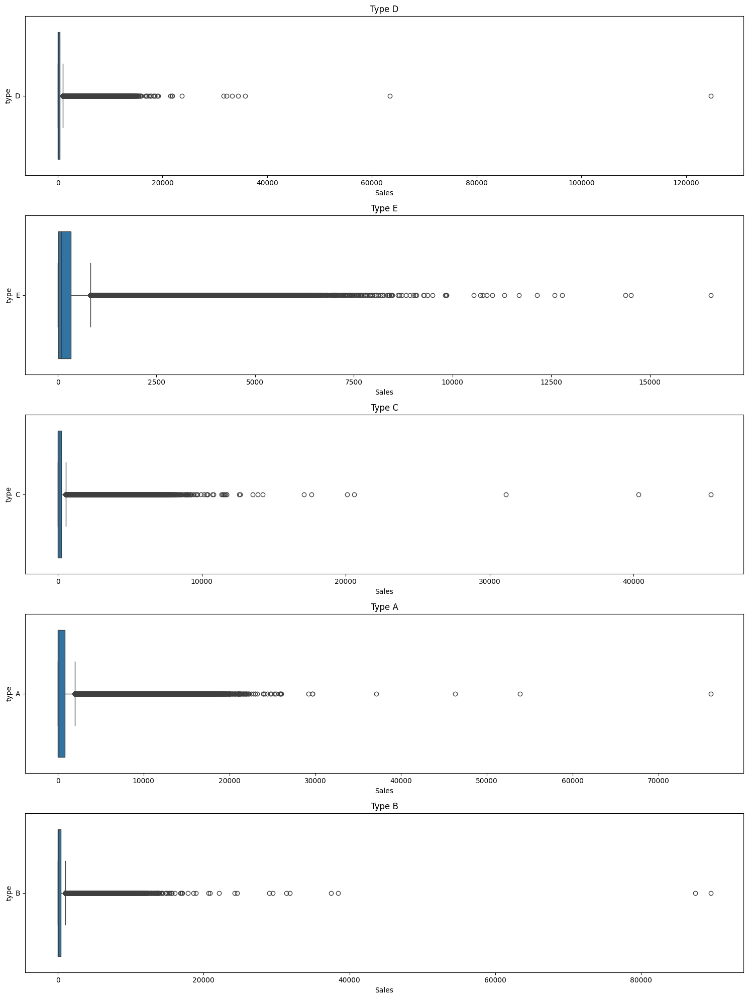

In [ ]:
fig, axes = plt.subplots(nrows=5, ncols=1, figsize=(15, 20))

# 각 type에 대한 상자 수염 그림을 해당 서브플롯에 그림
types = train['type'].unique()
for i, ax in enumerate(axes.flatten()):
    if i < len(types):
        sns.boxplot(x='sales', y='type', data=train[train['type'] == types[i]], ax=ax)
        ax.set_title(f'Type {types[i]}')
        ax.set(xlabel='Sales')

# 서브플롯 간의 간격 조정
plt.tight_layout()

# 그래프 표시
plt.show()

- 매장 type별로 매출액에 큰 차이가 있음을 확인할 수 있다.
  - `type`에 따라 각각 다른 모델을 구축하기로 함

In [ ]:
### 데이터를 type 별로 분리

typeA = train.loc[train['type'] == 'A', :]
typeB = train.loc[train['type'] == 'B', :]
typeC = train.loc[train['type'] == 'C', :]
typeD = train.loc[train['type'] == 'D', :]
typeE = train.loc[train['type'] == 'E', :]

In [ ]:
### 데이터를 type 별로 분리

typeA_te = test.loc[test['type'] == 'A', :]
typeB_te = test.loc[test['type'] == 'B', :]
typeC_te = test.loc[test['type'] == 'C', :]
typeD_te = test.loc[test['type'] == 'D', :]
typeE_te = test.loc[test['type'] == 'E', :]

# **4. EDA(2)**
- type별로 분리하여 모델링을 진행해 보자.

## **4-1. Type A**

In [ ]:
typeA = typeA.drop('type', axis = 1) # 더 이상 type 변수는 필요 없으므로 삭제
typeA_te = typeA_te.drop('type', axis = 1) # 더 이상 type 변수는 필요 없으므로 삭제

In [ ]:
typeA.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 360904 entries, 1547 to 2704215
Data columns (total 16 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   id            360904 non-null  int64         
 1   date          360904 non-null  datetime64[ns]
 2   store_nbr     360904 non-null  int64         
 3   family        360904 non-null  object        
 4   sales         360904 non-null  float64       
 5   onpromotion   360904 non-null  float64       
 6   city          360904 non-null  object        
 7   state         360904 non-null  object        
 8   cluster       360904 non-null  int64         
 9   dcoilwtico    360904 non-null  float64       
 10  transactions  360431 non-null  float64       
 11  holiday       360904 non-null  object        
 12  year          360904 non-null  int64         
 13  quarter       360904 non-null  int64         
 14  month         360904 non-null  int64         
 15  day_of_week  

In [ ]:
# 수치형 변수들의 기초통계량 확인

typeA[['sales', 'onpromotion', 'dcoilwtico', 'transactions']].describe()

,sales,onpromotion,dcoilwtico,transactions
count,360904.00,360904.00,360904.00,360431.00
mean,978.22,4.17,64.72,3209.21
std,2167.50,16.18,24.90,1041.29
min,1.00,0.00,26.19,292.00
25%,17.00,0.00,45.93,2433.50
50%,139.00,0.00,51.81,3153.00
75%,806.91,1.00,93.81,3891.00
max,76090.00,252.00,110.62,8359.00


- target 변수인 `sales`는 굉장히 왜곡된 분포를 보이고 있다.
  - `np.log1p()`를 통한 로그 변환 수행 후 모델링하면 좋을 듯하다.
- `onpromotion` 변수의 경우 심하게 왜곡된 분포를 가지고 있음
  - 상관관계를 보고 전처리 유무를 결정하자.


### **🧡 store_nbr**

In [ ]:
# 고유한 매장 수

typeA['store_nbr'].unique()

array([44, 45, 46, 48, 49, 47, 51, 50, 52])

In [ ]:
### 각 매장별 매출 총액 시도표(일 단위)

a = typeA.set_index("date").groupby("store_nbr").resample("D").sales.sum().reset_index()
px.line(a, x = "date", y= "sales", color = "store_nbr", title = "Daily total sales of the stores_Type A")

- 각 매장마다 매출이 상이한 것을 확인할 수 있다.
  - 45번 매장의 경우 매출액이 다른 매장에 비해 큰 것을 확인할 수 있다.
  - 52번 매장의 경우 비교적 최근에 개장한 점을 확인할 수 있다.
  > 모델링 시 매장 번호를 one-hot encoding 후 반영하는 것이 좋을 것이라고 판단됨

- 가게별로 매출에 이상치가 존재하는 것을 확인할 수 있다.
  - Kaggle 설명에 따르면 지진의 영향이라고 함
  - 그러나 test 예측 시점에는 지진에 대한 정보를 전혀 알 수 x
  > 이상치 제거 진행

#### **📌 이상치 제거**

In [ ]:
typeA.shape

(360904, 16)

원래는 360904건의 데이터

In [ ]:
typeA.groupby('store_nbr')['sales'].describe()

,count,mean,std,min,25%,50%,75%,max
store_nbr,,,,,,,,
44,45598.00,1361.63,2907.79,1.00,24.00,281.75,997.61,46271.00
45,44814.00,1216.09,2600.66,1.00,20.00,229.45,1017.00,76090.00
46,44835.00,934.45,2062.58,1.00,16.00,113.83,914.09,25238.00
47,45039.00,1131.20,2418.92,1.00,19.00,192.00,934.94,23024.00
48,43723.00,821.84,1842.36,1.00,15.00,96.00,801.00,22255.00
49,44820.00,968.77,2069.87,1.00,17.00,187.00,701.55,21190.00
50,44095.00,649.80,1407.29,1.00,14.00,100.00,550.00,14431.00
51,44390.00,741.42,1475.96,1.00,11.00,146.99,626.52,14179.00
52,3590.00,751.02,1611.02,1.00,12.00,96.84,499.31,10462.00


값 자체도 왜곡된 분포를 보임을 확인할 수 있음

In [ ]:
### 이상치 탐지 함수

def get_outlier_indices(df_col, weight=1.5):
  q1, q3 = np.percentile(df_col, [25, 75])

  iqr = q3 - q1
  iqr_weight = iqr * weight # iqr의 1.5배 범위를 벗어나는 것을 이상치로 처리

  lowest_val, highest_val = q1 - iqr_weight, q3 + iqr_weight # 상한, 하한

  outlier_indices = df_col[(df_col < lowest_val) | (df_col > highest_val)].index # 이상치에 해당하는 데이터 idx

  return outlier_indices

In [ ]:
cols = ['store_nbr', 'family']

# 제거할 행(row)의 인덱스를 저장
rows_to_drop = []

for col in cols:
    # 'store_nbr', 'family'을 기준으로 데이터를 그룹화
    grouped = typeA.groupby(cols)
    # 각 그룹에 대해 이상치를 찾아내고 인덱스를 추가
    for (_, group_data) in grouped:
        outlier_indices = get_outlier_indices(group_data['sales'], weight=3)
        rows_to_drop.extend(outlier_indices)

# 이상치 제거
typeA = typeA.drop(rows_to_drop)

In [ ]:
typeA.shape

(357838, 16)

329692건으로 데이터가 감소

In [ ]:
typeA.groupby(['store_nbr', 'family'])['sales'].describe()

count    mean     std     min     25%  \
store_nbr family                                                               
44        AUTOMOTIVE                 1676.00   18.82    9.37    1.00   12.00   
          BEAUTY                     1665.00   11.58    7.41    1.00    6.00   
          BEVERAGES                  1678.00 7981.20 3844.07 1804.00 4659.50   
          BOOKS                       164.00    2.80    2.30    1.00    1.00   
          BREAD/BAKERY               1679.00 1389.55  476.69  361.97 1035.99   
...                                      ...     ...     ...     ...     ...   
52        POULTRY                     118.00  494.60  124.87  234.27  389.73   
          PREPARED FOODS              118.00  135.18   30.27   73.99  112.15   
          PRODUCE                     118.00 4925.07 1314.25 3085.14 3915.15   
          SCHOOL AND OFFICE SUPPLIES   97.00    6.72    5.95    1.00    3.00   
          SEAFOOD                     117.00   10.04    5.44    2.00    6.00   

                                         50%     75%      max  
store_nbr family                                               
44        AUTOMOTIVE                   17.00   25.00    64.00  
          BEAUTY                       10.00   15.00    42.00  
          BEVERAGES                  7588.00 9610.25 22770.00  
          BOOKS                         2.00    4.00    13.00  
          BREAD/BAKERY               1298.31 1648.81  3361.50  
...                                      ...     ...      ...  
52        POULTRY                     493.94  583.71   775.52  
          PREPARED FOODS              134.59  150.72   231.00  
          PRODUCE                    4639.78 5615.25  8154.47  
          SCHOOL AND OFFICE SUPPLIES    5.00    8.00    32.00  
          SEAFOOD                       8.50   12.00    25.78  

[287 rows x 8 columns]

In [ ]:
a = typeA.set_index("date").groupby("store_nbr").resample("D").sales.sum().reset_index()
px.line(a, x = "date", y= "sales", color = "store_nbr", title = "Daily total sales of the stores_Type A")

이상치가 어느정도는 제거된 것 같다.

### **💛 family**

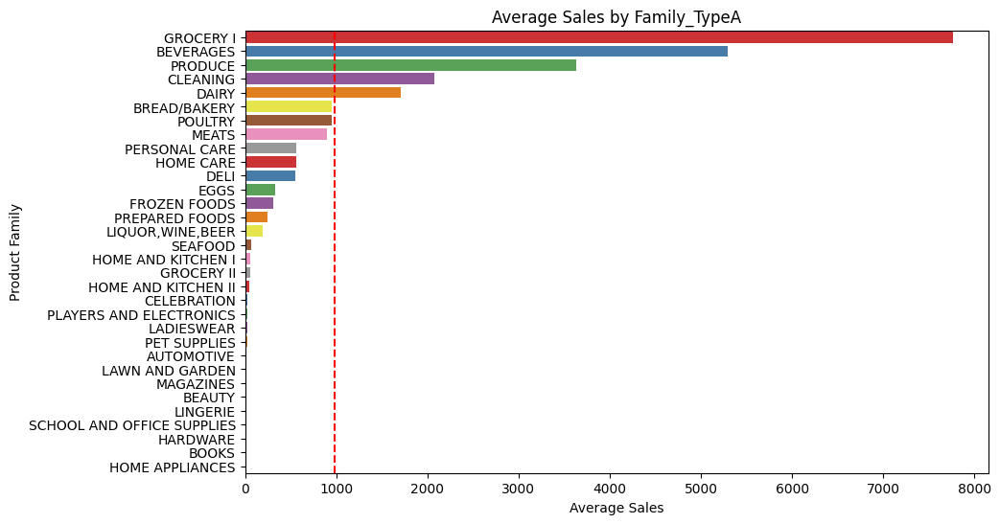

In [ ]:
### 각 품목별로 매출에 미치는 영향

# 각 family 별로 'sales'의 평균을 계산하고, 내림차순으로 정렬
average_sales_by_family = typeA.groupby('family')['sales'].mean().sort_values(ascending=False)

# 시각화
plt.figure(figsize=(10, 6))
# palette 매개변수를 사용하여 각 막대에 다른 색상 적용
sns.barplot(x='sales', y='family', data=typeA, order=average_sales_by_family.index, ci=None, palette='Set1')
plt.axvline(x=typeA['sales'].mean(), color='red', linestyle='--') # 매출 전체 평균

# 그래프 제목 및 레이블 설정
plt.title('Average Sales by Family_TypeA')
plt.xlabel('Average Sales')
plt.ylabel('Product Family')
plt.show()

- `groceryI`과 `beverage`가 매출의 대부분을 차지한다.
> 모델링 시 제품군을 one-hot encoding 후 반영하는 것이 좋을 것이라고 판단됨

### **💚 onpromotion**

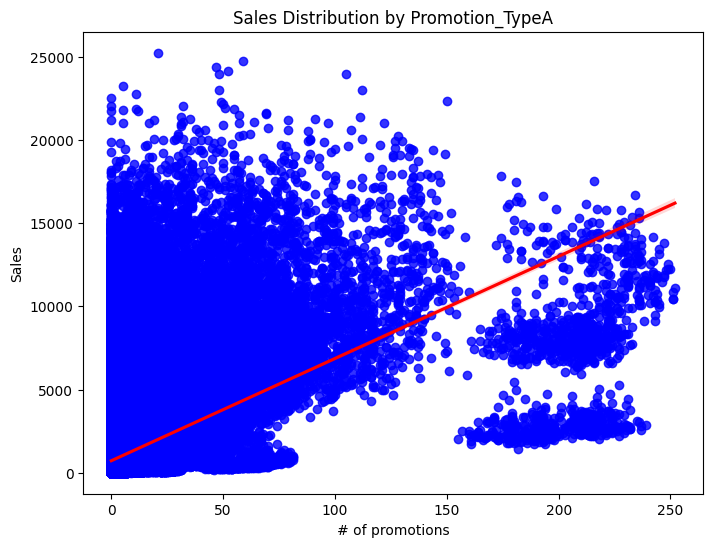

In [ ]:
plt.figure(figsize=(8, 6))

sns.regplot(x='onpromotion', y='sales', data=typeA, scatter_kws={'color': 'blue'}, line_kws={'color': 'red'})

# 그래프 제목 및 레이블 설정
plt.title('Sales Distribution by Promotion_TypeA')
plt.xlabel('# of promotions')
plt.ylabel('Sales')
plt.show()

- 꽤나 강한 양의 상관관계를 보인다.
  - 일부 이상치가 있어서 그런 것 같기도 하다..
- promotion되는 제품 수와 상관 없이 매출액이 큰 경우들이 존재함을 확인할 수 있다.

### **💙 state**

In [ ]:
# 고유한 주(state) 수

typeA['state'].unique()

array(['Pichincha', 'Guayas', 'Tungurahua', 'Manabi'], dtype=object)

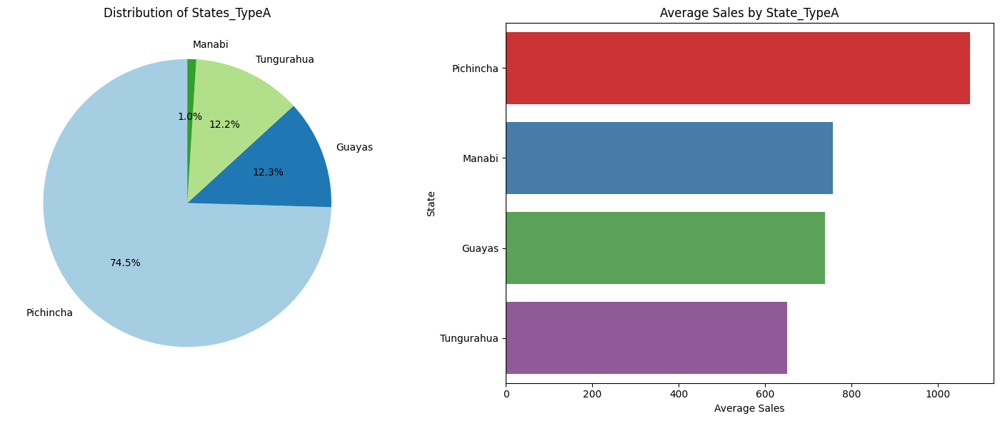

In [ ]:
plt.figure(figsize=(15, 6))

# 첫 번째 subplot: 파이 차트
plt.subplot(1, 2, 1)
state_counts = typeA['state'].value_counts()
plt.pie(state_counts, labels=state_counts.index, autopct='%1.1f%%', startangle=90, colors=plt.cm.Paired.colors)
plt.title('Distribution of States_TypeA')

# 두 번째 subplot: 막대 그래프
plt.subplot(1, 2, 2)
average_sales_by_state = typeA.groupby('state')['sales'].mean().sort_values(ascending=False)
sns.barplot(x='sales', y='state', data=typeA, order=average_sales_by_state.index, ci=None, palette='Set1')

plt.title('Average Sales by State_TypeA')
plt.xlabel('Average Sales')
plt.ylabel('State')
plt.tight_layout()
plt.show()

- 주마다 매출액에 차이가 있음을 확인할 수 있다.
- **Manabi** 주의 경우 굉장히 적은 데이터 건수임에도 불구하고 매출에 큰 영향을 미침을 확인할 수 있다.

### **💜 city**

In [ ]:
# 고유한 도시(city) 수

print(typeA.groupby('state')['store_nbr'].unique())
print()
print(typeA.groupby('state')['city'].unique())

state
Guayas                            [51]
Manabi                            [52]
Pichincha     [44, 45, 46, 48, 49, 47]
Tungurahua                        [50]
Name: store_nbr, dtype: object

state
Guayas        [Guayaquil]
Manabi            [Manta]
Pichincha         [Quito]
Tungurahua       [Ambato]
Name: city, dtype: object


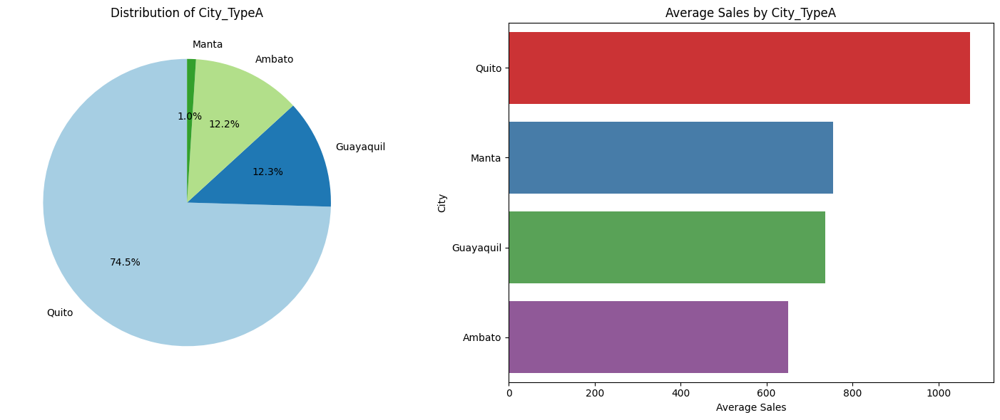

In [ ]:
plt.figure(figsize=(15, 6))

# 첫 번째 subplot: 파이 차트
plt.subplot(1, 2, 1)
city_counts = typeA['city'].value_counts()
plt.pie(city_counts, labels=city_counts.index, autopct='%1.1f%%', startangle=90, colors=plt.cm.Paired.colors)
plt.title('Distribution of City_TypeA')

# 두 번째 subplot: 막대 그래프
plt.subplot(1, 2, 2)
average_sales_by_city = typeA.groupby('city')['sales'].mean().sort_values(ascending=False)
sns.barplot(x='sales', y='city', data=typeA, order=average_sales_by_city.index, ci=None, palette='Set1')

plt.title('Average Sales by City_TypeA')
plt.xlabel('Average Sales')
plt.ylabel('City')
plt.tight_layout()
plt.show()

- `state`를 통해 `city`가 다 구분되는 상황
  - `sales`의 양상이 `state`와 유사
  - `state` 변수 하나만 남기기로 결정

### **🤎dcoilwtico**

In [ ]:
import plotly.express as px

daily_oil_price = typeA.groupby("date")["dcoilwtico"].mean().reset_index()

# 그래프 그리기
fig = px.line(daily_oil_price, x="date", y="dcoilwtico", title="Daily DcoilWTICO Prices")
fig.show()

- 유가 변동 경향과 sales의 변동이 별 상관은 없어 보인다.(추세가 다름)
- 2014년을 기점으로 급격하게 감소하는 추세를 보인다.
  - 그에 비해 매출은 그렇게 오르지 않았다.

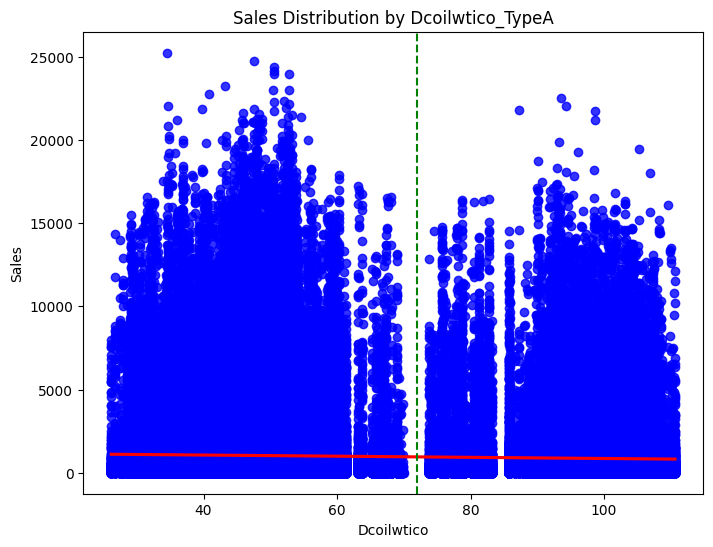

In [ ]:
plt.figure(figsize=(8, 6))

sns.regplot(x='dcoilwtico', y='sales', data=typeA, scatter_kws={'color': 'blue'}, line_kws={'color': 'red'})
plt.axvline(x=72, color='green', linestyle='--') # 72 구분선

# 그래프 제목 및 레이블 설정
plt.title('Sales Distribution by Dcoilwtico_TypeA')
plt.xlabel('Dcoilwtico')
plt.ylabel('Sales')
plt.show()

- 매우 약한 양의 상관관계를 보인다.
- 다만 유가가 **72** 전후에서 두 개의 그룹으로 확연히 분리되는 것을 확인할 수 있다.

In [ ]:
under72 = typeA.loc[typeA['dcoilwtico'] <= 72,:]
over72 = typeA.loc[typeA['dcoilwtico'] > 72,:]

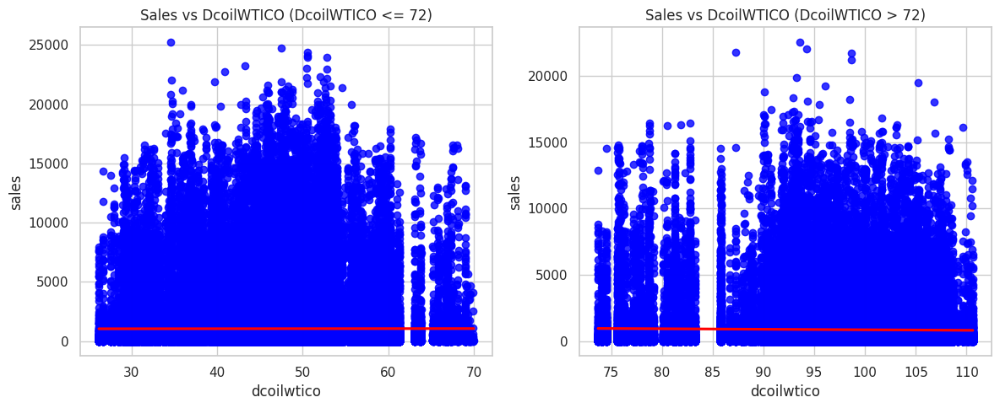

In [ ]:
sns.set(style="whitegrid")

fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Plot regplot for 'dcoilwtico' <= 72
sns.regplot(x='dcoilwtico', y='sales', data=under72, ax=axes[0], scatter_kws={'color': 'blue'}, line_kws={'color': 'red'})
axes[0].set_title('Sales vs DcoilWTICO (DcoilWTICO <= 72)')

# Plot regplot for 'dcoilwtico' > 72
sns.regplot(x='dcoilwtico', y='sales', data=over72, ax=axes[1], scatter_kws={'color': 'blue'}, line_kws={'color': 'red'})
axes[1].set_title('Sales vs DcoilWTICO (DcoilWTICO > 72)')

# Adjust layout
plt.tight_layout()
plt.show()

- 차이가 나타나진 않는다..

### **💗 transactions**

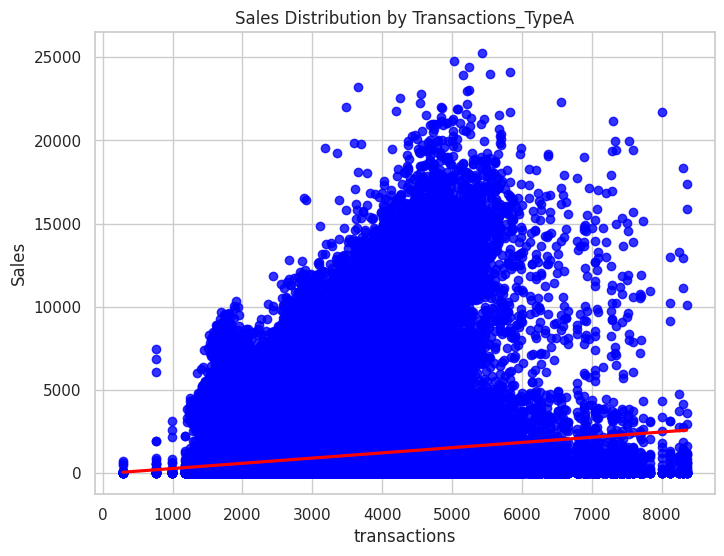

In [ ]:
plt.figure(figsize=(8, 6))

sns.regplot(x='transactions', y='sales', data=typeA, scatter_kws={'color': 'blue'}, line_kws={'color': 'red'})

# 그래프 제목 및 레이블 설정
plt.title('Sales Distribution by Transactions_TypeA')
plt.xlabel('transactions')
plt.ylabel('Sales')
plt.show()

- 약한 양의 상관관계를 보인다.
  - 그러나 모델링 시 활용하기 어려움..

### **🤍 holiday**

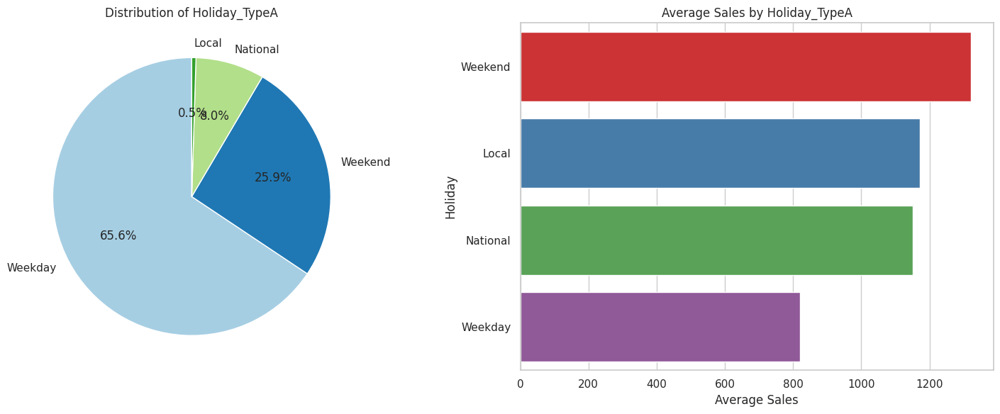

In [ ]:
plt.figure(figsize=(15, 6))

# 첫 번째 subplot: 파이 차트
plt.subplot(1, 2, 1)
holiday_counts = typeA['holiday'].value_counts()
plt.pie(holiday_counts, labels=holiday_counts.index, autopct='%1.1f%%', startangle=90, colors=plt.cm.Paired.colors)
plt.title('Distribution of Holiday_TypeA')

# 두 번째 subplot: 막대 그래프
plt.subplot(1, 2, 2)
average_sales_by_holiday = typeA.groupby('holiday')['sales'].mean().sort_values(ascending=False)
sns.barplot(x='sales', y='holiday', data=typeA, order=average_sales_by_holiday.index, ci=None, palette='Set1')

plt.title('Average Sales by Holiday_TypeA')
plt.xlabel('Average Sales')
plt.ylabel('Holiday')
plt.tight_layout()
plt.show()

- 그냥 주말(공휴일은 제외됨)에 매출이 가장 좋다.

### **⭐Target 변수(Sales)**
- 여러 요인에 따라 매출이 어떻게 달라지는지 살펴보자.

#### **a) 시간 관련 변수**

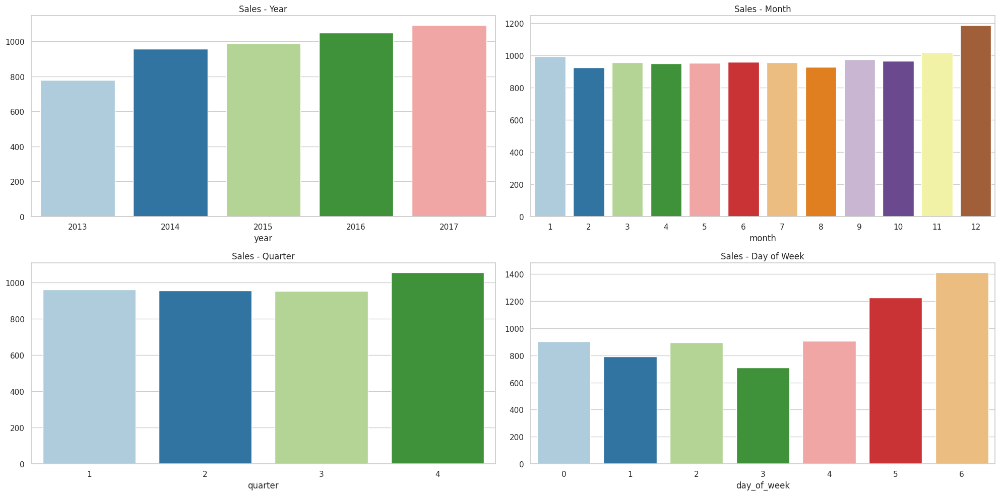

In [ ]:
### 평균 매출액으로 시각화
data_grouped_year = typeA.groupby(['year']).mean()['sales']
data_grouped_month = typeA.groupby(['month']).mean()['sales']
data_grouped_quarter = typeA.groupby(['quarter']).mean()['sales']
data_grouped_day = typeA.groupby(['day_of_week']).mean()['sales']

palette = sns.color_palette("Paired")

fig, axes = plt.subplots(2, 2, figsize=(20, 10))
# 연도별 매출
axes[0, 0].set_title('Sales - Year')
sns.barplot(x=data_grouped_year.index, y=data_grouped_year.values, ax=axes[0, 0], palette=palette)
# 월별 매출
axes[0, 1].set_title('Sales - Month')
sns.barplot(x=data_grouped_month.index, y=data_grouped_month.values, ax=axes[0, 1], palette=palette)
# 분기별 매출
axes[1, 0].set_title('Sales - Quarter')
sns.barplot(x=data_grouped_quarter.index, y=data_grouped_quarter.values, ax=axes[1, 0], palette=palette)
# 요일별 매출
axes[1, 1].set_title('Sales - Day of Week')
sns.barplot(x=data_grouped_day.index, y=data_grouped_day.values, ax=axes[1, 1], palette=palette)

plt.tight_layout()
plt.show()

In [ ]:
typeA.groupby('year')['sales'].describe()

,count,mean,std,min,25%,50%,75%,max
year,,,,,,,,
2013,59772.00,778.98,1588.06,1.00,15.71,237.00,754.00,22534.00
2014,75270.00,956.09,2035.00,1.00,14.00,151.14,842.00,21785.00
2015,77989.00,989.39,2147.21,1.00,16.00,132.77,848.96,25238.00
2016,86620.00,1048.01,2357.09,1.00,17.00,100.00,794.51,22770.00
2017,58187.00,1090.88,2492.40,1.00,18.00,97.36,786.00,24744.00


**연도별 매출**
- 뒤로 갈수록 매출액 평균은 점점 증가하고 있다.

**월별 & 분기별 매출**  
- 대체로 비슷한 경향을 보이나, 12월에 매출이 증가
- 분기별 매출 평균은 비슷하나 3분기가 약간 낮음, 4분기에 높은 매출

**요일별 매출**  
- 평일에 비해 금요일, 주말의 매출액이 더 높다.

#### **b) 변수들 간의 상관관계**
- 상관계수는 수치형 변수들끼리만 비교 가능

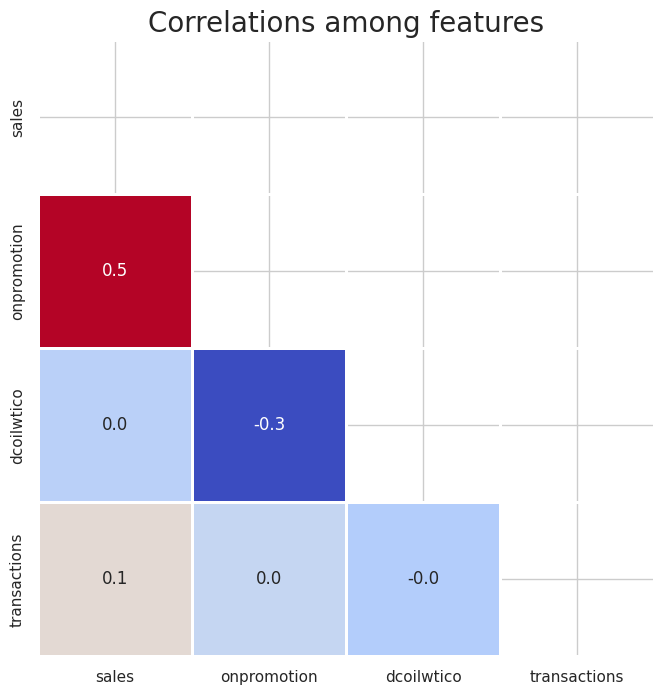

In [ ]:
num_ftrs = typeA[['sales', 'onpromotion','dcoilwtico','transactions']]

mask = np.triu(num_ftrs.corr(method = 'spearman'))

# heatmap을 이용한 시각화
plt.figure(figsize=(8, 8))
sns.heatmap(num_ftrs.corr(method = 'spearman'),
            annot=True,
            fmt='.1f',
            cmap='coolwarm',
            square=True,
            mask=mask,
            linewidths=1,
            cbar=False)
plt.title("Correlations among features", fontsize=20)
plt.show()

### **💡 후처리**

#### **최종 변수 선택**

In [ ]:
typeA.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 357838 entries, 1547 to 2704215
Data columns (total 16 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   id            357838 non-null  int64         
 1   date          357838 non-null  datetime64[ns]
 2   store_nbr     357838 non-null  int64         
 3   family        357838 non-null  object        
 4   sales         357838 non-null  float64       
 5   onpromotion   357838 non-null  float64       
 6   city          357838 non-null  object        
 7   state         357838 non-null  object        
 8   cluster       357838 non-null  int64         
 9   dcoilwtico    357838 non-null  float64       
 10  transactions  357367 non-null  float64       
 11  holiday       357838 non-null  object        
 12  year          357838 non-null  int64         
 13  quarter       357838 non-null  int64         
 14  month         357838 non-null  int64         
 15  day_of_week  

In [ ]:
typeA = typeA[['store_nbr', 'family', 'sales', 'onpromotion', 'state', 'cluster', 'dcoilwtico', 'holiday', 'year', 'quarter', 'month', 'day_of_week']]

# test의 경우에는 이후 submission 파일 작성을 위해 일단 id를 남겨두기로 결정
typeA_te = typeA_te[['id', 'store_nbr', 'family', 'onpromotion', 'state', 'cluster', 'dcoilwtico', 'holiday', 'year', 'quarter', 'month', 'day_of_week']]

In [ ]:
typeA.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 357838 entries, 1547 to 2704215
Data columns (total 12 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   store_nbr    357838 non-null  int64  
 1   family       357838 non-null  object 
 2   sales        357838 non-null  float64
 3   onpromotion  357838 non-null  float64
 4   state        357838 non-null  object 
 5   cluster      357838 non-null  int64  
 6   dcoilwtico   357838 non-null  float64
 7   holiday      357838 non-null  object 
 8   year         357838 non-null  int64  
 9   quarter      357838 non-null  int64  
 10  month        357838 non-null  int64  
 11  day_of_week  357838 non-null  int64  
dtypes: float64(3), int64(6), object(3)
memory usage: 35.5+ MB


#### **Train/Validation Split**

In [ ]:
from sklearn.model_selection import train_test_split

train, val = train_test_split(typeA, test_size=0.3, random_state=42, stratify=typeA[['store_nbr', 'family']]) # 가게별, 제품군별 비율 유지

In [ ]:
train.shape

(250486, 12)

In [ ]:
val.shape

(107352, 12)

#### **변수 왜곡 정도 확인**

In [ ]:
# 수치형 변수들에 대해서만 왜도 확인

train[['sales', 'onpromotion','dcoilwtico']].skew()

sales         3.77
onpromotion   7.99
dcoilwtico    0.53
dtype: float64

In [ ]:
train['sales'] = np.log1p(train['sales'])
train['onpromotion'] = np.log1p(train['onpromotion'])

In [ ]:
train[['sales', 'onpromotion','dcoilwtico']].skew()

sales         0.01
onpromotion   2.05
dcoilwtico    0.53
dtype: float64

- 왜곡 정도가 많이 개선되었다.

In [ ]:
val['onpromotion'] = np.log1p(val['onpromotion'])
typeA_te['onpromotion'] = np.log1p(typeA_te['onpromotion'])

#### **스케일링**
- 수치형 변수들에 대한 스케일링 진행

In [ ]:
from sklearn.preprocessing import StandardScaler

# Initialize StandardScaler
scaler = StandardScaler()

# Fit and transform the selected variables
train[['onpromotion', 'dcoilwtico']] = scaler.fit_transform(train[['onpromotion', 'dcoilwtico']])
val[['onpromotion', 'dcoilwtico']] = scaler.transform(val[['onpromotion', 'dcoilwtico']])
typeA_te[['onpromotion', 'dcoilwtico']] = scaler.transform(typeA_te[['onpromotion', 'dcoilwtico']])

In [ ]:
train.head()

,store_nbr,family,sales,onpromotion,state,cluster,dcoilwtico,holiday,year,quarter,month,day_of_week
1628410,45,GROCERY I,9.10,3.36,Pichincha,11,-1.03,Weekday,2015,4,11,0
576149,50,PERSONAL CARE,5.72,-0.54,Tungurahua,14,1.19,Weekday,2014,1,1,1
392392,51,DAIRY,7.00,-0.54,Guayas,17,1.59,Weekend,2013,3,9,5
2612463,47,POULTRY,7.29,3.00,Pichincha,14,-0.88,Weekday,2017,2,6,4
803172,44,GROCERY I,8.63,-0.54,Pichincha,5,1.73,National,2014,2,6,4


In [ ]:
val.head()

,store_nbr,family,sales,onpromotion,state,cluster,dcoilwtico,holiday,year,quarter,month,day_of_week
2361956,45,AUTOMOTIVE,27.00,0.11,Pichincha,11,-0.47,Weekend,2017,1,1,5
2044459,45,PERSONAL CARE,617.00,1.41,Pichincha,11,-0.90,Weekday,2016,3,7,0
2481507,50,FROZEN FOODS,255.08,0.76,Tungurahua,14,-0.50,Weekend,2017,2,4,5
2098843,44,EGGS,597.00,2.71,Pichincha,5,-0.69,Weekday,2016,3,8,4
2026657,49,"LIQUOR,WINE,BEER",201.00,-0.54,Pichincha,11,-0.77,Weekday,2016,3,7,3


In [ ]:
typeA_te.head()

,id,store_nbr,family,onpromotion,state,cluster,dcoilwtico,holiday,year,quarter,month,day_of_week
1254,3002142,44,AUTOMOTIVE,-0.54,Pichincha,5,-0.72,Weekday,2017,3,8,2
1255,3002143,44,BABY CARE,-0.54,Pichincha,5,-0.72,Weekday,2017,3,8,2
1256,3002144,44,BEAUTY,0.49,Pichincha,5,-0.72,Weekday,2017,3,8,2
1257,3002145,44,BEVERAGES,2.44,Pichincha,5,-0.72,Weekday,2017,3,8,2
1258,3002146,44,BOOKS,-0.54,Pichincha,5,-0.72,Weekday,2017,3,8,2


#### **범주형 변수 처리**

In [ ]:
train = pd.get_dummies(train, columns=['store_nbr','family', 'state', 'cluster', 'holiday', 'year', 'quarter', 'month', 'day_of_week'])
train.head()

,sales,onpromotion,dcoilwtico,store_nbr_44,store_nbr_45,store_nbr_46,store_nbr_47,store_nbr_48,store_nbr_49,store_nbr_50,store_nbr_51,store_nbr_52,family_AUTOMOTIVE,family_BEAUTY,family_BEVERAGES,family_BOOKS,family_BREAD/BAKERY,family_CELEBRATION,family_CLEANING,family_DAIRY,family_DELI,family_EGGS,family_FROZEN FOODS,family_GROCERY I,family_GROCERY II,family_HARDWARE,family_HOME AND KITCHEN I,family_HOME AND KITCHEN II,family_HOME APPLIANCES,family_HOME CARE,family_LADIESWEAR,family_LAWN AND GARDEN,family_LINGERIE,"family_LIQUOR,WINE,BEER",family_MAGAZINES,family_MEATS,family_PERSONAL CARE,family_PET SUPPLIES,family_PLAYERS AND ELECTRONICS,family_POULTRY,family_PREPARED FOODS,family_PRODUCE,family_SCHOOL AND OFFICE SUPPLIES,family_SEAFOOD,state_Guayas,state_Manabi,state_Pichincha,state_Tungurahua,cluster_5,cluster_11,cluster_14,cluster_17,holiday_Local,holiday_National,holiday_Weekday,holiday_Weekend,year_2013,year_2014,year_2015,year_2016,year_2017,quarter_1,quarter_2,quarter_3,quarter_4,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12,day_of_week_0,day_of_week_1,day_of_week_2,day_of_week_3,day_of_week_4,day_of_week_5,day_of_week_6
1628410,9.10,3.36,-1.03,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0
576149,5.72,-0.54,1.19,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
392392,7.00,-0.54,1.59,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
2612463,7.29,3.00,-0.88,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0
803172,8.63,-0.54,1.73,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0


In [ ]:
train.shape

(250486, 84)

In [ ]:
val = pd.get_dummies(val, columns=['store_nbr','family', 'state', 'cluster', 'holiday', 'year', 'quarter', 'month', 'day_of_week'])
val.head()

,sales,onpromotion,dcoilwtico,store_nbr_44,store_nbr_45,store_nbr_46,store_nbr_47,store_nbr_48,store_nbr_49,store_nbr_50,store_nbr_51,store_nbr_52,family_AUTOMOTIVE,family_BEAUTY,family_BEVERAGES,family_BOOKS,family_BREAD/BAKERY,family_CELEBRATION,family_CLEANING,family_DAIRY,family_DELI,family_EGGS,family_FROZEN FOODS,family_GROCERY I,family_GROCERY II,family_HARDWARE,family_HOME AND KITCHEN I,family_HOME AND KITCHEN II,family_HOME APPLIANCES,family_HOME CARE,family_LADIESWEAR,family_LAWN AND GARDEN,family_LINGERIE,"family_LIQUOR,WINE,BEER",family_MAGAZINES,family_MEATS,family_PERSONAL CARE,family_PET SUPPLIES,family_PLAYERS AND ELECTRONICS,family_POULTRY,family_PREPARED FOODS,family_PRODUCE,family_SCHOOL AND OFFICE SUPPLIES,family_SEAFOOD,state_Guayas,state_Manabi,state_Pichincha,state_Tungurahua,cluster_5,cluster_11,cluster_14,cluster_17,holiday_Local,holiday_National,holiday_Weekday,holiday_Weekend,year_2013,year_2014,year_2015,year_2016,year_2017,quarter_1,quarter_2,quarter_3,quarter_4,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12,day_of_week_0,day_of_week_1,day_of_week_2,day_of_week_3,day_of_week_4,day_of_week_5,day_of_week_6
2361956,27.00,0.11,-0.47,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
2044459,617.00,1.41,-0.90,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0
2481507,255.08,0.76,-0.50,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
2098843,597.00,2.71,-0.69,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0
2026657,201.00,-0.54,-0.77,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0


In [ ]:
val.shape

(107352, 84)

- 83개의 feature 변수, 1개의 target 변수

In [ ]:
typeA_te = pd.get_dummies(typeA_te, columns=['store_nbr','family', 'state', 'cluster', 'holiday', 'year', 'quarter', 'month', 'day_of_week'])
typeA_te.head()

,id,onpromotion,dcoilwtico,store_nbr_44,store_nbr_45,store_nbr_46,store_nbr_47,store_nbr_48,store_nbr_49,store_nbr_50,store_nbr_51,store_nbr_52,family_AUTOMOTIVE,family_BABY CARE,family_BEAUTY,family_BEVERAGES,family_BOOKS,family_BREAD/BAKERY,family_CELEBRATION,family_CLEANING,family_DAIRY,family_DELI,family_EGGS,family_FROZEN FOODS,family_GROCERY I,family_GROCERY II,family_HARDWARE,family_HOME AND KITCHEN I,family_HOME AND KITCHEN II,family_HOME APPLIANCES,family_HOME CARE,family_LADIESWEAR,family_LAWN AND GARDEN,family_LINGERIE,"family_LIQUOR,WINE,BEER",family_MAGAZINES,family_MEATS,family_PERSONAL CARE,family_PET SUPPLIES,family_PLAYERS AND ELECTRONICS,family_POULTRY,family_PREPARED FOODS,family_PRODUCE,family_SCHOOL AND OFFICE SUPPLIES,family_SEAFOOD,state_Guayas,state_Manabi,state_Pichincha,state_Tungurahua,cluster_5,cluster_11,cluster_14,cluster_17,holiday_Local,holiday_Weekday,holiday_Weekend,year_2017,quarter_3,month_8,day_of_week_0,day_of_week_1,day_of_week_2,day_of_week_3,day_of_week_4,day_of_week_5,day_of_week_6
1254,3002142,-0.54,-0.72,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,1,1,1,0,0,1,0,0,0,0
1255,3002143,-0.54,-0.72,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,1,1,1,0,0,1,0,0,0,0
1256,3002144,0.49,-0.72,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,1,1,1,0,0,1,0,0,0,0
1257,3002145,2.44,-0.72,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,1,1,1,0,0,1,0,0,0,0
1258,3002146,-0.54,-0.72,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,1,1,1,0,0,1,0,0,0,0


In [ ]:
typeA_te.shape

(4752, 66)

- 차이가 나는 부분
  - holiday
  - year
  - quarter
  - month

In [ ]:
## 변수 추가

typeA_te[['holiday_National', 'year_2013', 'year_2014', 'year_2015', 'year_2016', 'month_1', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6', 'month_7', 'month_9', 'month_10', 'month_11', 'month_12', 'quarter_1', 'quarter_2', 'quarter_4']] = 0

In [ ]:
typeA_te.shape

(4752, 85)

In [ ]:
train.columns.difference(typeA_te.columns)

Index(['sales'], dtype='object')

In [ ]:
typeA_te.columns.difference(train.columns)

Index(['family_BABY CARE', 'id'], dtype='object')

- typeA에 속하는 매장들은 `BABY CARE` 제품군을 판매하지 x
  - 모델링 시에는 삭제
- 이후 예측값을 다 0으로 표시


In [ ]:
# 최종 파일 저장

train.to_csv('/content/drive/MyDrive/Colab Notebooks/ESAA 학회_OB/esaa OB 3조/방학프로젝트/data/modeling/train/trainA.csv', index = False)
val.to_csv('/content/drive/MyDrive/Colab Notebooks/ESAA 학회_OB/esaa OB 3조/방학프로젝트/data/modeling/val/valA.csv', index = False)
typeA_te.to_csv('/content/drive/MyDrive/Colab Notebooks/ESAA 학회_OB/esaa OB 3조/방학프로젝트/data/modeling/test/testA.csv', index = False)

## **4-2. Type B**

In [ ]:
typeB = typeB.drop('type', axis = 1) # 더 이상 type 변수는 필요 없으므로 삭제
typeB_te = typeB_te.drop('type', axis = 1) # 더 이상 type 변수는 필요 없으므로 삭제

In [ ]:
typeB.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 296530 entries, 1654 to 2704949
Data columns (total 16 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   id            296530 non-null  int64         
 1   date          296530 non-null  datetime64[ns]
 2   store_nbr     296530 non-null  int64         
 3   family        296530 non-null  object        
 4   sales         296530 non-null  float64       
 5   onpromotion   296530 non-null  float64       
 6   city          296530 non-null  object        
 7   state         296530 non-null  object        
 8   cluster       296530 non-null  int64         
 9   dcoilwtico    296530 non-null  float64       
 10  transactions  296059 non-null  float64       
 11  holiday       296530 non-null  object        
 12  year          296530 non-null  int64         
 13  quarter       296530 non-null  int64         
 14  month         296530 non-null  int64         
 15  day_of_week  

In [ ]:
# 수치형 변수들의 기초통계량 확인

typeB[['sales', 'onpromotion', 'dcoilwtico', 'transactions']].describe()

,sales,onpromotion,dcoilwtico,transactions
count,296530.00,296530.00,296530.00,296059.00
mean,489.87,4.26,61.68,1747.71
std,1163.07,14.94,23.99,535.70
min,0.12,0.00,26.19,612.00
25%,7.00,0.00,45.33,1305.00
50%,60.00,0.00,50.11,1642.00
75%,422.00,1.00,92.05,2159.00
max,89576.36,183.00,110.62,5018.00


- target 변수인 `sales`는 typeA에서와 마찬가지로 굉장히 왜곡된 분포를 보이고 있다.
  - `np.log1p()`를 통한 로그 변환 수행 후 모델링하면 좋을 듯하다.
- `onpromotion` 변수의 경우 또한 심하게 왜곡된 분포를 가지고 있음
  - 상관관계를 보고 전처리 유무를 결정하자.


### **🧡 store_nbr**

In [ ]:
# 고유한 매장 수

typeB['store_nbr'].unique()

array([34, 39,  9, 18, 11, 31, 20, 21])

In [ ]:
### 각 매장별 매출 총액 시도표(일 단위)

b = typeB.set_index("date").groupby("store_nbr").resample("D").sales.sum().reset_index()
px.line(b, x = "date", y= "sales", color = "store_nbr", title = "Daily total sales of the stores_Type B")

- 각 매장마다 매출이 상이한 것을 확인할 수 있다.
- 20번 매장의 경우, 몇몇 이상치가 보이며, 전체적으로 값이 크다.
- 9번 매장의 경우, 다른 매장보다 매출이 큼을 알 수 있다.
- 39번 매장의 경우에도 이상치가 관찰되며, 몇몇 날에 정기적으로 휴업했음을 알 수 있다.
- 18번 매장의 경우, 2016년~2017년 사이 장기적인 휴업을 하였다.
> 모델링 시 매장 번호를 one-hot encoding 후 반영하는 것이 좋을 것이라고 판단됨

- 가게별로 매출에 이상치가 존재하는 것을 확인할 수 있다.

 - Kaggle 설명에 따르면 지진의 영향이라고 함
 - 그러나 test 예측 시점에는 지진에 대한 정보를 전혀 알 수 x
> 이상치 제거 진행

#### **📌 이상치 제거**

In [ ]:
typeB.shape

(296530, 16)

원래는 296530건의 데이터

In [ ]:
typeB.groupby(['store_nbr', 'family'])['sales'].describe()

count    mean     std    min     25%  \
store_nbr family                                                              
9         AUTOMOTIVE                 1671.00   13.98    8.13   1.00    8.00   
          BABY CARE                   222.00    1.51    0.78   1.00    1.00   
          BEAUTY                     1636.00    5.67    4.05   1.00    3.00   
          BEVERAGES                  1679.00 2750.09 1540.77 592.00 1427.00   
          BREAD/BAKERY               1679.00  569.29  151.23 246.00  463.00   
...                                      ...     ...     ...    ...     ...   
39        POULTRY                    1679.00  206.06   80.18  19.75  156.09   
          PREPARED FOODS             1679.00   76.32   26.05  21.00   57.65   
          PRODUCE                    1016.00 1761.50  558.70 721.91 1326.83   
          SCHOOL AND OFFICE SUPPLIES  770.00    4.06    5.39   1.00    1.00   
          SEAFOOD                    1666.00   11.44    7.49   0.12    6.22   

                                         50%     75%      max  
store_nbr family                                               
9         AUTOMOTIVE                   12.00   18.00    81.00  
          BABY CARE                     1.00    2.00     6.00  
          BEAUTY                        5.00    7.00    32.00  
          BEVERAGES                  2532.00 3587.00 12486.00  
          BREAD/BAKERY                536.00  639.00  1210.00  
...                                      ...     ...      ...  
39        POULTRY                     205.54  259.65   586.58  
          PREPARED FOODS               73.20   91.00   236.61  
          PRODUCE                    1608.29 2043.32  3956.63  
          SCHOOL AND OFFICE SUPPLIES    3.00    4.00    55.00  
          SEAFOOD                      10.28   15.18    69.57  

[256 rows x 8 columns]

값 자체도 왜곡된 분포를 보임을 확인할 수 있음

In [ ]:
### 이상치 탐지 함수

def get_outlier_indices(df_col, weight=3):
    q1, q3 = np.percentile(df_col, [25, 75])
    iqr = q3 - q1
    iqr_weight = iqr * weight

    lowest_val, highest_val = q1 - iqr_weight, q3 + iqr_weight
    outlier_indices = df_col[(df_col < lowest_val) | (df_col > highest_val)].index

    return outlier_indices

In [ ]:
cols = ['store_nbr', 'family']

# 제거할 행(row)의 인덱스를 저장
rows_to_drop = []

for col in cols:
    # 'store_nbr', 'family'을 기준으로 데이터를 그룹화
    grouped = typeB.groupby(cols)
    # 각 그룹에 대해 이상치를 찾아내고 인덱스를 추가
    for (_, group_data) in grouped:
        outlier_indices = get_outlier_indices(group_data['sales'], weight=3)
        rows_to_drop.extend(outlier_indices)

# 이상치 제거
typeB = typeB.drop(rows_to_drop)

In [ ]:
typeB.shape

(293993, 16)

293993건으로 데이터가 감소

In [ ]:
typeB.groupby(['store_nbr', 'family'])['sales'].describe()

count    mean     std    min     25%  \
store_nbr family                                                              
9         AUTOMOTIVE                 1665.00   13.82    7.65   1.00    8.00   
          BABY CARE                   221.00    1.49    0.72   1.00    1.00   
          BEAUTY                     1616.00    5.47    3.59   1.00    3.00   
          BEVERAGES                  1678.00 2744.28 1522.77 592.00 1427.00   
          BREAD/BAKERY               1677.00  568.53  149.70 246.00  463.00   
...                                      ...     ...     ...    ...     ...   
39        POULTRY                    1678.00  205.84   79.67  19.75  156.08   
          PREPARED FOODS             1677.00   76.14   25.54  21.00   57.64   
          PRODUCE                    1016.00 1761.50  558.70 721.91 1326.83   
          SCHOOL AND OFFICE SUPPLIES  736.00    3.17    2.45   1.00    1.00   
          SEAFOOD                    1659.00   11.27    7.03   0.12    6.21   

                                         50%     75%     max  
store_nbr family                                              
9         AUTOMOTIVE                   12.00   18.00   46.00  
          BABY CARE                     1.00    2.00    5.00  
          BEAUTY                        5.00    7.00   19.00  
          BEVERAGES                  2531.00 3583.50 9188.00  
          BREAD/BAKERY                536.00  638.00 1126.00  
...                                      ...     ...     ...  
39        POULTRY                     205.49  259.54  526.86  
          PREPARED FOODS               73.11   91.00  190.50  
          PRODUCE                    1608.29 2043.32 3956.63  
          SCHOOL AND OFFICE SUPPLIES    2.00    4.00   13.00  
          SEAFOOD                      10.27   15.10   40.54  

[256 rows x 8 columns]

In [ ]:
b = typeB.set_index("date").groupby("store_nbr").resample("D").sales.sum().reset_index()
px.line(b, x = "date", y= "sales", color = "store_nbr", title = "Daily total sales of the stores_Type B")

이상치가 어느정도는 제거된 것 같다.

### **💛 family**

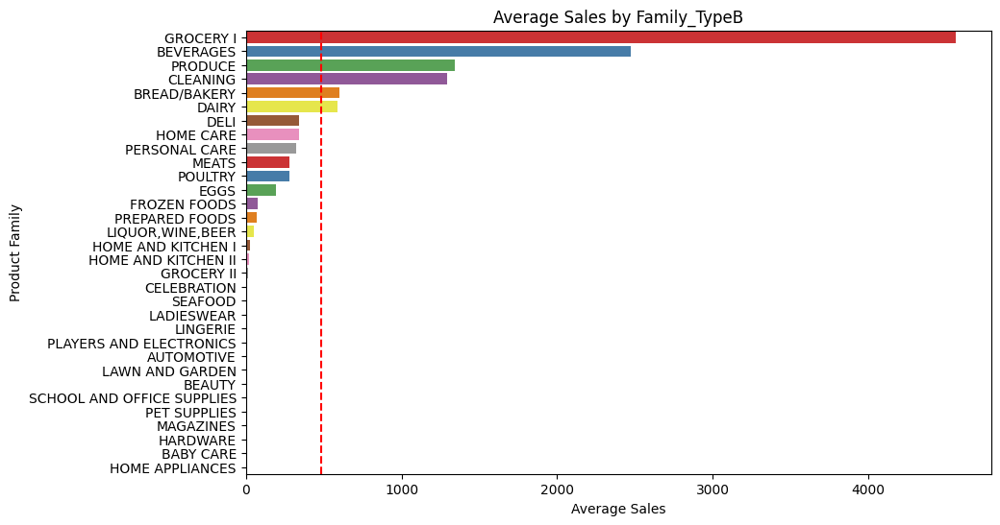

In [ ]:
### 각 품목별로 매출에 미치는 영향

# 각 family 별로 'sales'의 평균을 계산하고, 내림차순으로 정렬
average_sales_by_family = typeB.groupby('family')['sales'].mean().sort_values(ascending=False)

## 시각화
plt.figure(figsize=(10, 6))
sns.barplot(x='sales', y='family', data=typeB, order=average_sales_by_family.index, ci=None, palette = 'Set1')
plt.axvline(x=typeB['sales'].mean(), color='red', linestyle='--') # 매출 전체 평균

# 그래프 제목 및 레이블 설정
plt.title('Average Sales by Family_TypeB')
plt.xlabel('Average Sales')
plt.ylabel('Product Family')
plt.show()

- `groceryI`과 `beverages`가 매출의 대부분을 차지한다.(typeA와 비슷한 특징이다.)
  > 모델링 시 제품군을 one-hot encoding 후 반영하는 것이 좋을 것이라고 판단됨

### **💚 onpromotion**

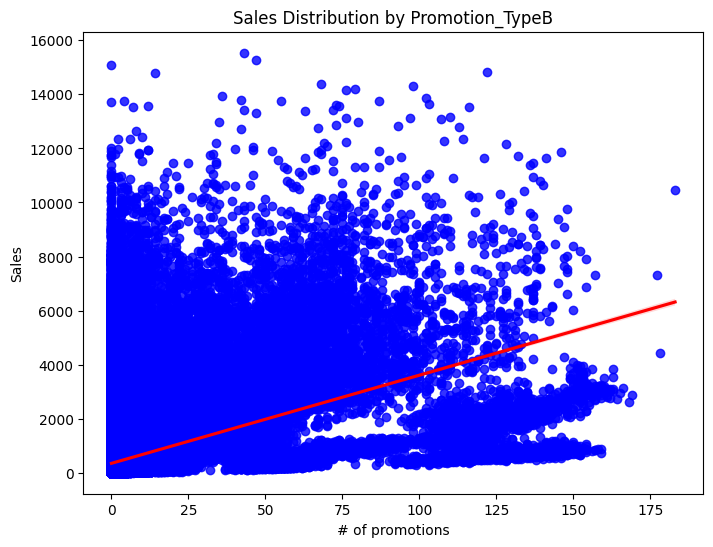

In [ ]:
plt.figure(figsize=(8, 6))

sns.regplot(x='onpromotion', y='sales', data=typeB, scatter_kws={'color': 'blue'}, line_kws={'color': 'red'})

# 그래프 제목 및 레이블 설정
plt.title('Sales Distribution by Promotion_TypeB')
plt.xlabel('# of promotions')
plt.ylabel('Sales')
plt.show()

- 강한 양의 상관관계를 보인다.
- promotion되는 제품 수와 상관 없이 매출액이 큰 경우들이 존재함을 확인할 수 있다.
> typeA와 동일한 특징

### **💙 state**

In [ ]:
# 고유한 주(state) 수

typeB['state'].unique()

array(['Guayas', 'Azuay', 'Pichincha', 'Los Rios',
       'Santo Domingo de los Tsachilas'], dtype=object)

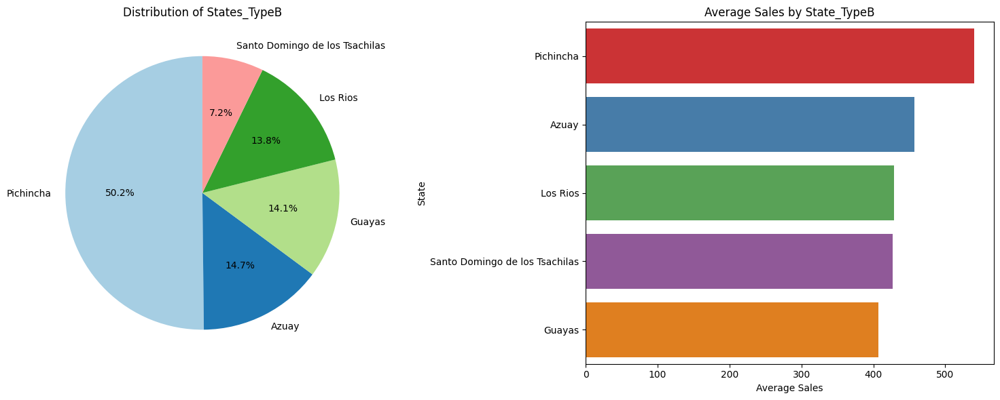

In [ ]:
plt.figure(figsize=(15, 6))

# 첫 번째 subplot: 파이 차트
plt.subplot(1, 2, 1)
state_counts = typeB['state'].value_counts()
plt.pie(state_counts, labels=state_counts.index, autopct='%1.1f%%', startangle=90, colors=plt.cm.Paired.colors)
plt.title('Distribution of States_TypeB')

# 두 번째 subplot: 막대 그래프
plt.subplot(1, 2, 2)
average_sales_by_state = typeB.groupby('state')['sales'].mean().sort_values(ascending=False)
sns.barplot(x='sales', y='state', data=typeB, order=average_sales_by_state.index, ci=None, palette = 'Set1')

plt.title('Average Sales by State_TypeB')
plt.xlabel('Average Sales')
plt.ylabel('State')
plt.tight_layout()
plt.show()

- 주마다 매출액에 차이가 있음을 확인할 수 있다.
- Santo Domingo de los Tsachilas의 경우, 작은 수의 매장이 존재하지만, 큰 평균 매출을 가지고 있다.

### **💜 city**

In [ ]:
# 고유한 도시(city) 수

print(typeB.groupby('state')['store_nbr'].unique())
print()
print(typeB.groupby('state')['city'].unique())

state
Azuay                                        [39]
Guayas                                       [34]
Los Rios                                     [31]
Pichincha                         [9, 18, 11, 20]
Santo Domingo de los Tsachilas               [21]
Name: store_nbr, dtype: object

state
Azuay                                     [Cuenca]
Guayas                                 [Guayaquil]
Los Rios                                [Babahoyo]
Pichincha                         [Quito, Cayambe]
Santo Domingo de los Tsachilas     [Santo Domingo]
Name: city, dtype: object


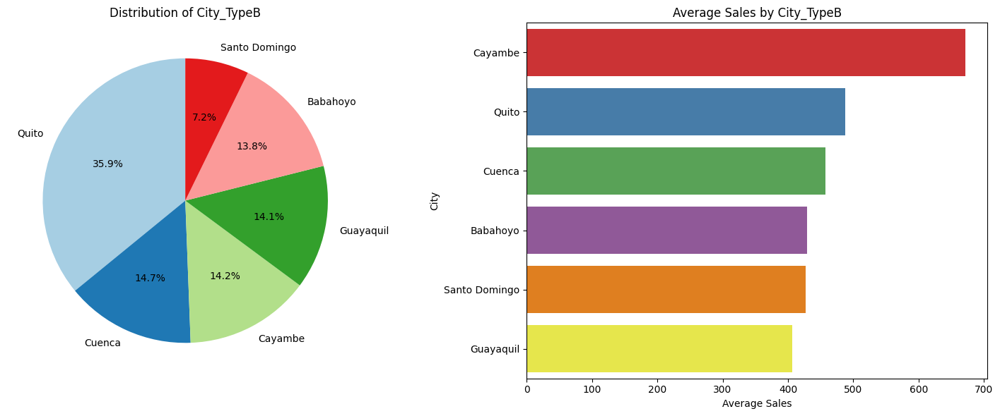

In [ ]:
plt.figure(figsize=(15, 6))

# 첫 번째 subplot: 파이 차트
plt.subplot(1, 2, 1)
city_counts = typeB['city'].value_counts()
plt.pie(city_counts, labels=city_counts.index, autopct='%1.1f%%', startangle=90, colors=plt.cm.Paired.colors)
plt.title('Distribution of City_TypeB')

# 두 번째 subplot: 막대 그래프
plt.subplot(1, 2, 2)
average_sales_by_city = typeB.groupby('city')['sales'].mean().sort_values(ascending=False)
sns.barplot(x='sales', y='city', data=typeB, order=average_sales_by_city.index, ci=None, palette = 'Set1')

plt.title('Average Sales by City_TypeB')
plt.xlabel('Average Sales')
plt.ylabel('City')
plt.tight_layout()
plt.show()

- `state`를 통해 `city`가 다 구분되는 상황
- Pichincha에는 Quito, Guayaquil 두 개의 도시가 포함되어 있으며, 나머지는 주=도시인 상황이다,
  - `sales`의 양상이 `state`와 유사
  - Quito, Guayaquil 두 도시의 특징이 다르므로, 'city'를 남기는 것이 낫지 않을까...

### **🤎dcoilwtico**

In [ ]:
import plotly.express as px
import plotly.graph_objects as go

daily_oil_price = typeB.groupby("date")["dcoilwtico"].mean().reset_index()
daily_sales = typeB.groupby("date")["sales"].mean().reset_index()


# 그래프 그리기
fig = go.Figure()
fig.add_trace(go.Scatter(x = daily_oil_price["date"], y=daily_oil_price["dcoilwtico"], name="Daily DcoilWTICO Prices"))
fig.add_trace(go.Scatter(x=daily_sales["date"], y=daily_sales["sales"], name="Daily Sales"))
fig.show()

- 유가 변동 경향과 sales의 변동이 별 상관은 없어 보인다.(추세가 다름)
- 2014년을 기점으로 급격하게 감소하는 추세를 보인다.
  - 그에 비해 매출은 그렇게 오르지 않았다.

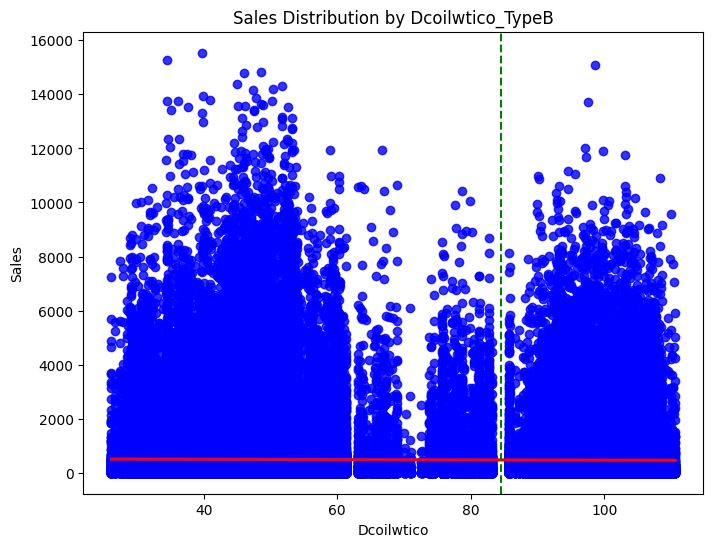

In [ ]:
plt.figure(figsize=(8, 6))

sns.regplot(x='dcoilwtico', y='sales', data=typeB, scatter_kws={'color': 'blue'}, line_kws={'color': 'red'})
plt.axvline(x=84.5, color='green', linestyle='--') # 84.5 구분선

# 그래프 제목 및 레이블 설정
plt.title('Sales Distribution by Dcoilwtico_TypeB')
plt.xlabel('Dcoilwtico')
plt.ylabel('Sales')
plt.show()

- 정말 별 상관은 없어 보인다.
- 다만 유가가 **84.5** 전후에서 두 개의 그룹으로 확연히 분리되는 것을 확인할 수 있다.

In [ ]:
under8 = typeB.loc[typeB['dcoilwtico'] <= 84.5,:]
over8 = typeB.loc[typeB['dcoilwtico'] > 84.5,:]

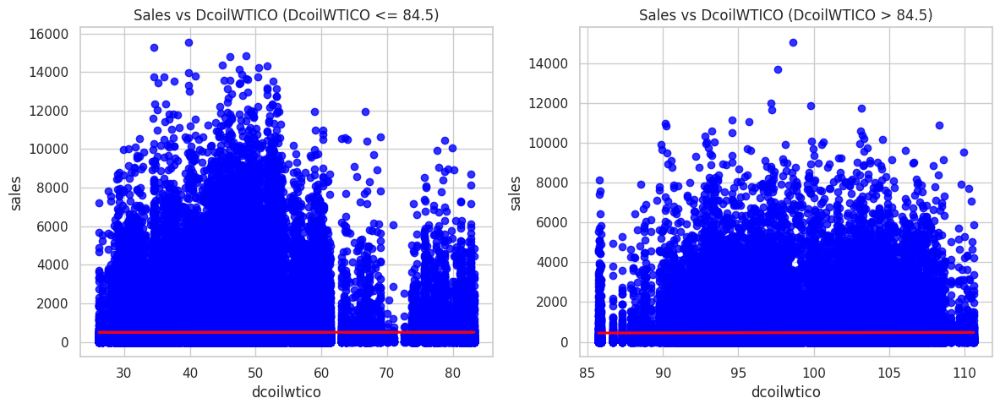

In [ ]:
sns.set(style="whitegrid")

fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Plot regplot for 'dcoilwtico' <= 84.5
sns.regplot(x='dcoilwtico', y='sales', data=under8, ax=axes[0], scatter_kws={'color': 'blue'}, line_kws={'color': 'red'})
axes[0].set_title('Sales vs DcoilWTICO (DcoilWTICO <= 84.5)')

# Plot regplot for 'dcoilwtico' > 84.5
sns.regplot(x='dcoilwtico', y='sales', data=over8, ax=axes[1], scatter_kws={'color': 'blue'}, line_kws={'color': 'red'})
axes[1].set_title('Sales vs DcoilWTICO (DcoilWTICO > 84.5)')

# Adjust layout
plt.tight_layout()
plt.show()

- 이상치 제거 후에는 다른 점이 크게 보이지 않는다.

### **💗 transactions**

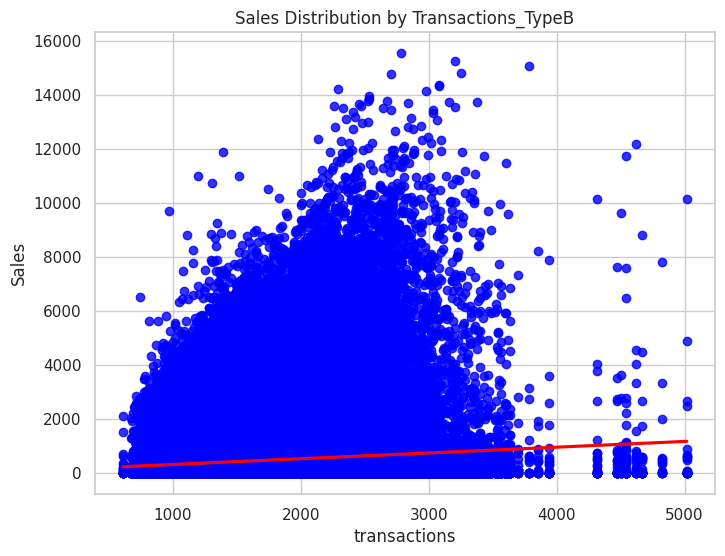

In [ ]:
plt.figure(figsize=(8, 6))

sns.regplot(x='transactions', y='sales', data=typeB, scatter_kws={'color': 'blue'}, line_kws={'color': 'red'})

# 그래프 제목 및 레이블 설정
plt.title('Sales Distribution by Transactions_TypeB')
plt.xlabel('transactions')
plt.ylabel('Sales')
plt.show()

- 약한 양의 상관관계를 보인다.
- 그닥 상관은 없어 보인다.  
(어짜피 모델링 시 활용하기 어려움..)

### **🤍 holiday**

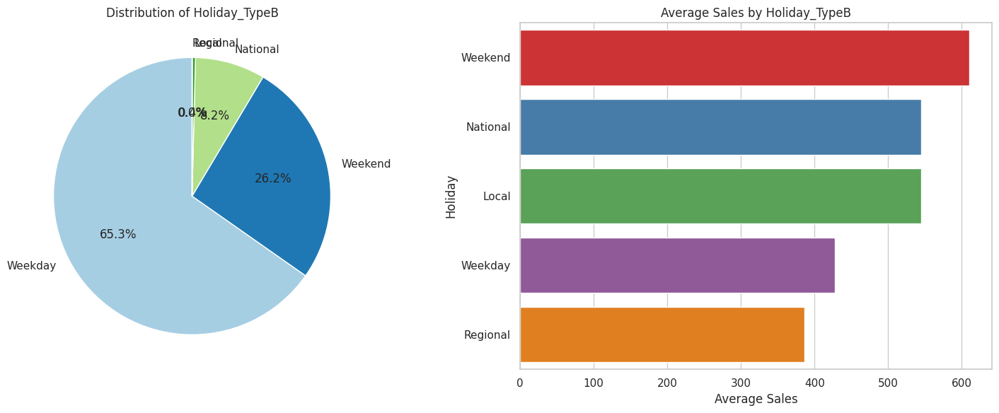

In [ ]:
plt.figure(figsize=(15, 6))

# 첫 번째 subplot: 파이 차트
plt.subplot(1, 2, 1)
holiday_counts = typeB['holiday'].value_counts()
plt.pie(holiday_counts, labels=holiday_counts.index, autopct='%1.1f%%', startangle=90, colors=plt.cm.Paired.colors)
plt.title('Distribution of Holiday_TypeB')

# 두 번째 subplot: 막대 그래프
plt.subplot(1, 2, 2)
average_sales_by_holiday = typeB.groupby('holiday')['sales'].mean().sort_values(ascending=False)
sns.barplot(x='sales', y='holiday', data=typeB, order=average_sales_by_holiday.index, ci=None, palette = 'Set1')

plt.title('Average Sales by Holiday_TypeB')
plt.xlabel('Average Sales')
plt.ylabel('Holiday')
plt.tight_layout()
plt.show()

- Regional의 매출이 가장 좋다.

### **⭐Target 변수(Sales)**
- 여러 요인에 따라 매출이 어떻게 달라지는지 살펴보자.

#### **a) 시간 관련 변수**

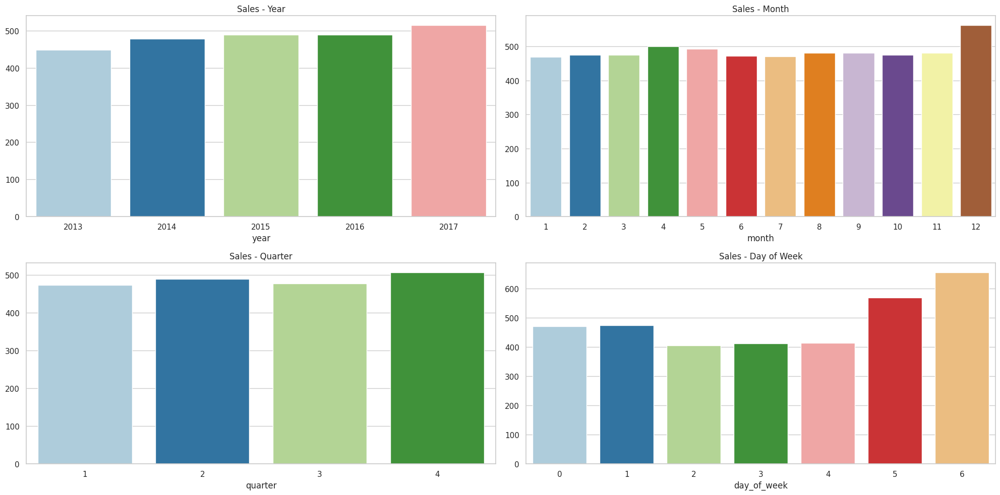

In [ ]:
### 평균 매출액으로 시각화
data_grouped_year = typeB.groupby(['year']).mean()['sales']
data_grouped_month = typeB.groupby(['month']).mean()['sales']
data_grouped_quarter = typeB.groupby(['quarter']).mean()['sales']
data_grouped_day = typeB.groupby(['day_of_week']).mean()['sales']

palette = sns.color_palette("Paired")

fig, axes = plt.subplots(2, 2, figsize=(20, 10))
# 연도별 매출
axes[0, 0].set_title('Sales - Year')
sns.barplot(x=data_grouped_year.index, y=data_grouped_year.values, ax=axes[0, 0], palette=palette)
# 월별 매출
axes[0, 1].set_title('Sales - Month')
sns.barplot(x=data_grouped_month.index, y=data_grouped_month.values, ax=axes[0, 1], palette=palette)
# 분기별 매출
axes[1, 0].set_title('Sales - Quarter')
sns.barplot(x=data_grouped_quarter.index, y=data_grouped_quarter.values, ax=axes[1, 0], palette=palette)
# 요일별 매출
axes[1, 1].set_title('Sales - Day of Week')
sns.barplot(x=data_grouped_day.index, y=data_grouped_day.values, ax=axes[1, 1], palette=palette)

plt.tight_layout()
plt.show()

**연도별 매출**
- 뒤로 갈수록 매출액이 점점 증가하고 있다.

**월별 & 분기별 매출**  
- 대체로 비슷한 경향을 보이나, 12월에 매출이 증가
- 4분기에 매출 증가

**요일별 매출**  
- 평일에 비해 주말의 매출액이 더 높다.
- 그 중 6인 일요일의 매출이 가장 높다.

#### **b) 변수들 간의 상관관계**
- 상관계수는 수치형 변수들끼리만 비교 가능

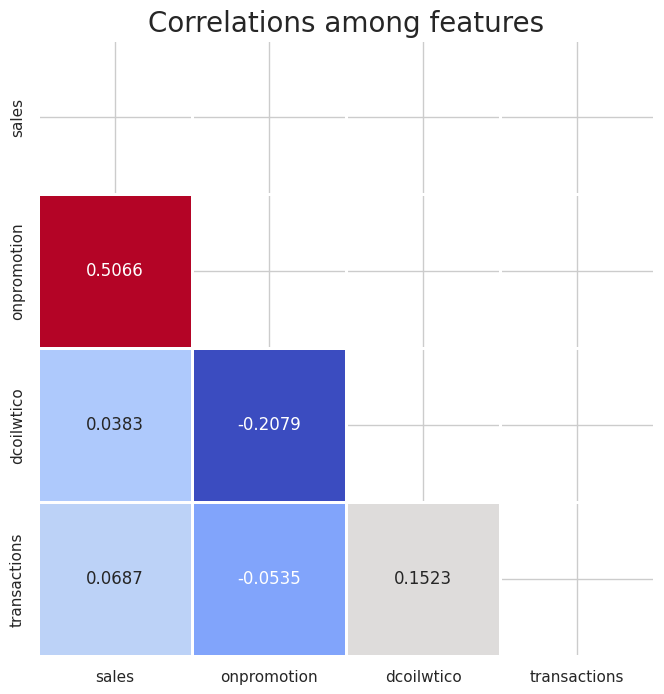

In [ ]:
num_ftrs = typeB[['sales', 'onpromotion','dcoilwtico','transactions']]

mask = np.triu(num_ftrs.corr(method = 'spearman'))

# heatmap을 이용한 시각화
plt.figure(figsize=(8, 8))
sns.heatmap(num_ftrs.corr(method = 'spearman'),
            annot=True,
            fmt='.4f',
            cmap='coolwarm',
            square=True,
            mask=mask,
            linewidths=1,
            cbar=False)
plt.title("Correlations among features", fontsize=20)
plt.show()

### **💡 후처리**

#### **최종 변수 선택**

In [ ]:
typeB.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 293993 entries, 1654 to 2704949
Data columns (total 16 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   id            293993 non-null  int64         
 1   date          293993 non-null  datetime64[ns]
 2   store_nbr     293993 non-null  int64         
 3   family        293993 non-null  object        
 4   sales         293993 non-null  float64       
 5   onpromotion   293993 non-null  float64       
 6   city          293993 non-null  object        
 7   state         293993 non-null  object        
 8   cluster       293993 non-null  int64         
 9   dcoilwtico    293993 non-null  float64       
 10  transactions  293528 non-null  float64       
 11  holiday       293993 non-null  object        
 12  year          293993 non-null  int64         
 13  quarter       293993 non-null  int64         
 14  month         293993 non-null  int64         
 15  day_of_week  

In [ ]:
typeB = typeB[['store_nbr', 'family', 'sales', 'onpromotion', 'city', 'cluster', 'dcoilwtico', 'holiday', 'year', 'quarter', 'month', 'day_of_week']]
# typeA와 달리 city를 남겨두기로 결정함

# test의 경우에는 이후 submission 파일 작성을 위해 일단 id를 남겨두기로 결정
typeB_te = typeB_te[['id', 'store_nbr', 'family', 'onpromotion', 'city', 'cluster', 'dcoilwtico', 'holiday', 'year', 'quarter', 'month', 'day_of_week']]

In [ ]:
typeB.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 293993 entries, 1654 to 2704949
Data columns (total 12 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   store_nbr    293993 non-null  int64  
 1   family       293993 non-null  object 
 2   sales        293993 non-null  float64
 3   onpromotion  293993 non-null  float64
 4   city         293993 non-null  object 
 5   cluster      293993 non-null  int64  
 6   dcoilwtico   293993 non-null  float64
 7   holiday      293993 non-null  object 
 8   year         293993 non-null  int64  
 9   quarter      293993 non-null  int64  
 10  month        293993 non-null  int64  
 11  day_of_week  293993 non-null  int64  
dtypes: float64(3), int64(6), object(3)
memory usage: 29.2+ MB


#### **Train/Validation Split**

In [ ]:
from sklearn.model_selection import train_test_split

train, val = train_test_split(typeB, test_size=0.3, random_state=42, stratify=typeB[['store_nbr', 'family']]) # 가게별, 제품군별 비율 유지

In [ ]:
train.shape

(205795, 12)

In [ ]:
val.shape

(88198, 12)

#### **변수 왜곡 정도 확인**

In [ ]:
# 수치형 변수들에 대해서만 왜도 확인

train[['sales', 'onpromotion','dcoilwtico']].skew()

sales         4.21
onpromotion   5.77
dcoilwtico    0.77
dtype: float64

In [ ]:
train['sales'] = np.log1p(train['sales'])
train['onpromotion'] = np.log1p(train['onpromotion'])

In [ ]:
train[['sales', 'onpromotion','dcoilwtico']].skew()

sales         0.16
onpromotion   2.03
dcoilwtico    0.77
dtype: float64

- 왜곡 정도가 많이 개선되었다.

In [ ]:
val['onpromotion'] = np.log1p(val['onpromotion'])
typeB_te['onpromotion'] = np.log1p(typeB_te['onpromotion'])

#### **스케일링**
- 수치형 변수들에 대한 스케일링 진행

In [ ]:
from sklearn.preprocessing import StandardScaler

# Initialize StandardScaler
scaler = StandardScaler()

# Fit and transform the selected variables
train[['onpromotion', 'dcoilwtico']] = scaler.fit_transform(train[['onpromotion', 'dcoilwtico']])
val[['onpromotion', 'dcoilwtico']] = scaler.transform(val[['onpromotion', 'dcoilwtico']])
typeB_te[['onpromotion', 'dcoilwtico']] = scaler.transform(typeB_te[['onpromotion', 'dcoilwtico']])

In [ ]:
train.head()

,store_nbr,family,sales,onpromotion,city,cluster,dcoilwtico,holiday,year,quarter,month,day_of_week
1360971,9,BEVERAGES,8.66,-0.52,Quito,6,-0.08,Weekend,2015,2,6,6
883009,39,EGGS,5.23,0.11,Cuenca,6,1.51,Weekday,2014,3,8,0
768824,18,DELI,5.14,3.02,Quito,16,1.77,Weekday,2014,2,5,3
2054721,31,PLAYERS AND ELECTRONICS,2.48,-0.52,Babahoyo,10,-0.88,Weekend,2016,3,7,6
722468,9,SEAFOOD,2.28,-0.52,Quito,6,1.64,Weekday,2014,2,4,0


In [ ]:
val.head()

,store_nbr,family,sales,onpromotion,city,cluster,dcoilwtico,holiday,year,quarter,month,day_of_week
1632544,18,BEAUTY,4.00,-0.52,Quito,16,-0.85,Weekday,2015,4,11,2
2546913,18,DELI,305.29,1.59,Quito,16,-0.54,Weekday,2017,2,5,1
118121,39,BREAD/BAKERY,517.00,-0.52,Cuenca,6,1.32,Weekday,2013,1,3,4
1745770,34,SEAFOOD,1.00,-0.52,Guayaquil,6,-1.22,Weekend,2016,1,1,6
1635636,9,PET SUPPLIES,4.00,-0.52,Quito,6,-0.88,National,2015,4,11,4


In [ ]:
typeB_te.head()

,id,store_nbr,family,onpromotion,city,cluster,dcoilwtico,holiday,year,quarter,month,day_of_week
66,3000954,11,AUTOMOTIVE,-0.52,Cayambe,6,-0.62,Weekday,2017,3,8,2
67,3000955,11,BABY CARE,-0.52,Cayambe,6,-0.62,Weekday,2017,3,8,2
68,3000956,11,BEAUTY,0.48,Cayambe,6,-0.62,Weekday,2017,3,8,2
69,3000957,11,BEVERAGES,3.12,Cayambe,6,-0.62,Weekday,2017,3,8,2
70,3000958,11,BOOKS,-0.52,Cayambe,6,-0.62,Weekday,2017,3,8,2


#### **범주형 변수 처리**

In [ ]:
train = pd.get_dummies(train, columns=['store_nbr','family', 'city', 'cluster', 'holiday', 'year', 'quarter', 'month', 'day_of_week'])
train.head()

,sales,onpromotion,dcoilwtico,store_nbr_9,store_nbr_11,store_nbr_18,store_nbr_20,store_nbr_21,store_nbr_31,store_nbr_34,store_nbr_39,family_AUTOMOTIVE,family_BABY CARE,family_BEAUTY,family_BEVERAGES,family_BREAD/BAKERY,family_CELEBRATION,family_CLEANING,family_DAIRY,family_DELI,family_EGGS,family_FROZEN FOODS,family_GROCERY I,family_GROCERY II,family_HARDWARE,family_HOME AND KITCHEN I,family_HOME AND KITCHEN II,family_HOME APPLIANCES,family_HOME CARE,family_LADIESWEAR,family_LAWN AND GARDEN,family_LINGERIE,"family_LIQUOR,WINE,BEER",family_MAGAZINES,family_MEATS,family_PERSONAL CARE,family_PET SUPPLIES,family_PLAYERS AND ELECTRONICS,family_POULTRY,family_PREPARED FOODS,family_PRODUCE,family_SCHOOL AND OFFICE SUPPLIES,family_SEAFOOD,city_Babahoyo,city_Cayambe,city_Cuenca,city_Guayaquil,city_Quito,city_Santo Domingo,cluster_6,cluster_10,cluster_16,holiday_Local,holiday_National,holiday_Regional,holiday_Weekday,holiday_Weekend,year_2013,year_2014,year_2015,year_2016,year_2017,quarter_1,quarter_2,quarter_3,quarter_4,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12,day_of_week_0,day_of_week_1,day_of_week_2,day_of_week_3,day_of_week_4,day_of_week_5,day_of_week_6
1360971,8.66,-0.52,-0.08,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1
883009,5.23,0.11,1.51,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0
768824,5.14,3.02,1.77,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0
2054721,2.48,-0.52,-0.88,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1
722468,2.28,-0.52,1.64,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0


In [ ]:
train.shape

(205795, 85)

In [ ]:
val = pd.get_dummies(val, columns=['store_nbr','family', 'city', 'cluster', 'holiday', 'year', 'quarter', 'month', 'day_of_week'])
val.head()

,sales,onpromotion,dcoilwtico,store_nbr_9,store_nbr_11,store_nbr_18,store_nbr_20,store_nbr_21,store_nbr_31,store_nbr_34,store_nbr_39,family_AUTOMOTIVE,family_BABY CARE,family_BEAUTY,family_BEVERAGES,family_BREAD/BAKERY,family_CELEBRATION,family_CLEANING,family_DAIRY,family_DELI,family_EGGS,family_FROZEN FOODS,family_GROCERY I,family_GROCERY II,family_HARDWARE,family_HOME AND KITCHEN I,family_HOME AND KITCHEN II,family_HOME APPLIANCES,family_HOME CARE,family_LADIESWEAR,family_LAWN AND GARDEN,family_LINGERIE,"family_LIQUOR,WINE,BEER",family_MAGAZINES,family_MEATS,family_PERSONAL CARE,family_PET SUPPLIES,family_PLAYERS AND ELECTRONICS,family_POULTRY,family_PREPARED FOODS,family_PRODUCE,family_SCHOOL AND OFFICE SUPPLIES,family_SEAFOOD,city_Babahoyo,city_Cayambe,city_Cuenca,city_Guayaquil,city_Quito,city_Santo Domingo,cluster_6,cluster_10,cluster_16,holiday_Local,holiday_National,holiday_Regional,holiday_Weekday,holiday_Weekend,year_2013,year_2014,year_2015,year_2016,year_2017,quarter_1,quarter_2,quarter_3,quarter_4,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12,day_of_week_0,day_of_week_1,day_of_week_2,day_of_week_3,day_of_week_4,day_of_week_5,day_of_week_6
1632544,4.00,-0.52,-0.85,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0
2546913,305.29,1.59,-0.54,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0
118121,517.00,-0.52,1.32,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
1745770,1.00,-0.52,-1.22,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
1635636,4.00,-0.52,-0.88,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0


In [ ]:
val.shape

(88198, 85)

- 84개의 feature 변수, 1개의 target 변수

In [ ]:
typeB_te = pd.get_dummies(typeB_te, columns=['store_nbr','family', 'city', 'cluster', 'holiday', 'year', 'quarter', 'month', 'day_of_week'])
typeB_te.head()

,id,onpromotion,dcoilwtico,store_nbr_9,store_nbr_11,store_nbr_18,store_nbr_20,store_nbr_21,store_nbr_31,store_nbr_34,store_nbr_39,family_AUTOMOTIVE,family_BABY CARE,family_BEAUTY,family_BEVERAGES,family_BOOKS,family_BREAD/BAKERY,family_CELEBRATION,family_CLEANING,family_DAIRY,family_DELI,family_EGGS,family_FROZEN FOODS,family_GROCERY I,family_GROCERY II,family_HARDWARE,family_HOME AND KITCHEN I,family_HOME AND KITCHEN II,family_HOME APPLIANCES,family_HOME CARE,family_LADIESWEAR,family_LAWN AND GARDEN,family_LINGERIE,"family_LIQUOR,WINE,BEER",family_MAGAZINES,family_MEATS,family_PERSONAL CARE,family_PET SUPPLIES,family_PLAYERS AND ELECTRONICS,family_POULTRY,family_PREPARED FOODS,family_PRODUCE,family_SCHOOL AND OFFICE SUPPLIES,family_SEAFOOD,city_Babahoyo,city_Cayambe,city_Cuenca,city_Guayaquil,city_Quito,city_Santo Domingo,cluster_6,cluster_10,cluster_16,holiday_Weekday,holiday_Weekend,year_2017,quarter_3,month_8,day_of_week_0,day_of_week_1,day_of_week_2,day_of_week_3,day_of_week_4,day_of_week_5,day_of_week_6
66,3000954,-0.52,-0.62,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,1,1,1,0,0,1,0,0,0,0
67,3000955,-0.52,-0.62,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,1,1,1,0,0,1,0,0,0,0
68,3000956,0.48,-0.62,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,1,1,1,0,0,1,0,0,0,0
69,3000957,3.12,-0.62,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,1,1,1,0,0,1,0,0,0,0
70,3000958,-0.52,-0.62,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,1,1,1,0,0,1,0,0,0,0


In [ ]:
typeB_te.shape

(4224, 65)

- 차이가 나는 부분
  - holiday(local, regional, national > 3개)
  - year(2013, 2014, 2015, 2016 > 4개)
  - quarter(1,2,4 > 3개)
  - month(1,2,3,4,5,6,7,9,10,11,12 > 11개)
  - id(-1개)

In [ ]:
## 변수 추가

typeB_te[['holiday_Local','holiday_Regional','holiday_National', 'year_2013', 'year_2014', 'year_2015', 'year_2016', 'month_1', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6', 'month_7', 'month_9', 'month_10', 'month_11', 'month_12', 'quarter_1', 'quarter_2', 'quarter_4']] = 0

In [ ]:
typeB_te.shape

(4224, 86)

In [ ]:
train.columns.difference(typeB_te.columns)

Index(['sales'], dtype='object')

In [ ]:
typeB_te.columns.difference(train.columns)

Index(['family_BOOKS', 'id'], dtype='object')

In [ ]:
typeB_te.columns.difference(val.columns)

Index(['family_BOOKS', 'id'], dtype='object')

- typeB에 속하는 매장들은 `BOOKS` 제품군을 판매하지 x
  - 모델링 시에는 삭제
- 이후 예측값을 다 0으로 표시


In [ ]:
# 최종 파일 저장

train.to_csv('/content/drive/MyDrive/ESAA 8기/OB/winter_proj/방학프로젝트/data/modeling/train/trainB.csv', index = False)
val.to_csv('/content/drive/MyDrive/ESAA 8기/OB/winter_proj/방학프로젝트/data/modeling/val/valB.csv', index = False)
typeB_te.to_csv('/content/drive/MyDrive/ESAA 8기/OB/winter_proj/방학프로젝트/data/modeling/test/testB.csv', index = False)

## **4-3. Type C**

In [ ]:
typeC = typeC.drop('type', axis = 1) # 더 이상 type 변수는 필요 없으므로 삭제
typeC_te = typeC_te.drop('type', axis = 1) # 더 이상 type 변수는 필요 없으므로 삭제

In [ ]:
typeC.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 533821 entries, 1493 to 2704976
Data columns (total 16 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   id            533821 non-null  int64         
 1   date          533821 non-null  datetime64[ns]
 2   store_nbr     533821 non-null  int64         
 3   family        533821 non-null  object        
 4   sales         533821 non-null  float64       
 5   onpromotion   533821 non-null  float64       
 6   city          533821 non-null  object        
 7   state         533821 non-null  object        
 8   cluster       533821 non-null  int64         
 9   dcoilwtico    533821 non-null  float64       
 10  transactions  532882 non-null  float64       
 11  holiday       533821 non-null  object        
 12  year          533821 non-null  int64         
 13  quarter       533821 non-null  int64         
 14  month         533821 non-null  int64         
 15  day_of_week  

In [ ]:
# 수치형 변수들의 기초통계량 확인

typeC[['sales', 'onpromotion', 'dcoilwtico', 'transactions']].describe()

,sales,onpromotion,dcoilwtico,transactions
count,533821.00,533821.00,533821.00,532882.00
mean,308.03,3.26,64.16,1039.94
std,702.54,11.81,24.80,315.46
min,0.78,0.00,26.19,97.00
25%,6.00,0.00,45.84,771.00
50%,58.96,0.00,51.41,1026.00
75%,233.00,1.00,93.60,1262.00
max,45361.00,591.00,110.62,3176.00


- target 변수인 `sales`는 왜곡된 분포를 보이고 있다.
  - `np.log1p()`를 통한 로그 변환 수행 후 모델링하면 좋을 듯하다.

### **🧡 store_nbr**

In [ ]:
# 고유한 매장 수

typeC['store_nbr'].unique()

array([40, 35, 54, 17, 16, 15, 19, 10, 12, 33, 14, 13, 30, 32, 22])

In [ ]:
### 각 매장별 매출 총액 시도표(일 단위)

a = typeC.set_index("date").groupby("store_nbr").resample("D").sales.sum().reset_index()
px.line(a, x = "date", y= "sales", color = "store_nbr", title = "Daily total sales of the stores_Type C")

- 각 매장마다 매출이 상이한 것을 확인할 수 있다.
- 17번 매장의 경우 매출액이 다른 매장에 비해 큰 것을 확인할 수 있다.
- 32번 매장의 경우 매출액이 다른 매장에 비해 작은 것을 확인할 수 있다.
> 모델링 시 매장 번호를 one-hot encoding 후 반영하는 것이 좋을 것이라고 판단됨

- 가게별로 매출에 이상치가 존재하는 것을 확인할 수 있다.
  - Kaggle 설명에 따르면 지진의 영향이라고 함
  - 그러나 test 예측 시점에는 지진에 대한 정보를 전혀 알 수 x
  > 이상치 제거 진행

#### **📌 이상치 제거**

In [ ]:
typeC.shape

(533821, 16)

원래는 533821건의 데이터

In [ ]:
typeC.groupby(['store_nbr', 'family'])['sales'].describe()

count   mean    std    min    25%  \
store_nbr family                                                           
10        AUTOMOTIVE                 1485.00   3.50   2.56   1.00   2.00   
          BABY CARE                   165.00   2.79   2.54   1.00   1.00   
          BEAUTY                     1145.00   2.02   1.27   1.00   1.00   
          BEVERAGES                  1679.00 897.76 413.62 164.00 544.50   
          BREAD/BAKERY               1679.00 114.01  36.60  40.00  88.00   
...                                      ...    ...    ...    ...    ...   
54        POULTRY                    1678.00  52.97  26.39   2.80  36.16   
          PREPARED FOODS             1679.00  61.40  28.35   1.00  41.00   
          PRODUCE                    1016.00 586.79 176.05 118.86 464.63   
          SCHOOL AND OFFICE SUPPLIES  162.00   6.31   7.47   1.00   1.00   
          SEAFOOD                    1019.00   2.88   2.27   1.00   1.00   

                                        50%     75%     max  
store_nbr family                                             
10        AUTOMOTIVE                   3.00    5.00   29.00  
          BABY CARE                    2.00    4.00   21.00  
          BEAUTY                       2.00    3.00   11.00  
          BEVERAGES                  860.00 1166.00 2687.00  
          BREAD/BAKERY               109.00  135.00  389.00  
...                                     ...     ...     ...  
54        POULTRY                     49.31   64.84  353.71  
          PREPARED FOODS              60.00   80.00  179.00  
          PRODUCE                    558.64  697.27 1693.63  
          SCHOOL AND OFFICE SUPPLIES   3.00    9.00   51.00  
          SEAFOOD                      2.00    4.00   24.00  

[470 rows x 8 columns]

값 자체도 왜곡된 분포를 보임을 확인할 수 있음

In [ ]:
### 이상치 탐지 함수

def get_outlier_indices(df_col, weight=3):
  q1, q3 = np.percentile(df_col, [25, 75])

  iqr = q3 - q1
  iqr_weight = iqr * weight # iqr의 1.5배 범위를 벗어나는 것을 이상치로 처리

  lowest_val, highest_val = q1 - iqr_weight, q3 + iqr_weight # 상한, 하한

  outlier_indices = df_col[(df_col < lowest_val) | (df_col > highest_val)].index # 이상치에 해당하는 데이터 idx

  return outlier_indices

In [ ]:
cols = ['store_nbr', 'family']

# 제거할 행(row)의 인덱스를 저장
rows_to_drop = []

for col in cols:
    # 'store_nbr', 'family'을 기준으로 데이터를 그룹화
    grouped = typeC.groupby(cols)
    # 각 그룹에 대해 이상치를 찾아내고 인덱스를 추가
    for (_, group_data) in grouped:
        outlier_indices = get_outlier_indices(group_data['sales'], weight=3)
        rows_to_drop.extend(outlier_indices)

# 이상치 제거
typeC = typeC.drop(rows_to_drop)

In [ ]:
typeC.shape

(528567, 16)

528567건으로 데이터가 감소

In [ ]:
typeC.groupby(['store_nbr', 'family'])['sales'].describe()

count   mean    std    min    25%  \
store_nbr family                                                           
10        AUTOMOTIVE                 1477.00   3.41   2.26   1.00   2.00   
          BABY CARE                   164.00   2.68   2.11   1.00   1.00   
          BEAUTY                     1143.00   2.00   1.22   1.00   1.00   
          BEVERAGES                  1679.00 897.76 413.62 164.00 544.50   
          BREAD/BAKERY               1673.00 113.24  34.25  40.00  88.00   
...                                      ...    ...    ...    ...    ...   
54        POULTRY                    1664.00  51.68  21.91   2.80  36.05   
          PREPARED FOODS             1679.00  61.40  28.35   1.00  41.00   
          PRODUCE                    1014.00 584.86 170.68 118.86 463.63   
          SCHOOL AND OFFICE SUPPLIES  161.00   6.04   6.60   1.00   1.00   
          SEAFOOD                    1017.00   2.85   2.15   1.00   1.00   

                                        50%     75%     max  
store_nbr family                                             
10        AUTOMOTIVE                   3.00    5.00   14.00  
          BABY CARE                    2.00    4.00   12.00  
          BEAUTY                       2.00    3.00    9.00  
          BEVERAGES                  860.00 1166.00 2687.00  
          BREAD/BAKERY               109.00  134.00  271.00  
...                                     ...     ...     ...  
54        POULTRY                     49.11   64.21  146.36  
          PREPARED FOODS              60.00   80.00  179.00  
          PRODUCE                    558.16  696.42 1360.18  
          SCHOOL AND OFFICE SUPPLIES   3.00    9.00   33.00  
          SEAFOOD                      2.00    4.00   13.00  

[470 rows x 8 columns]

In [ ]:
a = typeC.set_index("date").groupby("store_nbr").resample("D").sales.sum().reset_index()
px.line(a, x = "date", y= "sales", color = "store_nbr", title = "Daily total sales of the stores_Type C")

이상치가 어느정도는 제거된 것 같다.

### **💛 family**

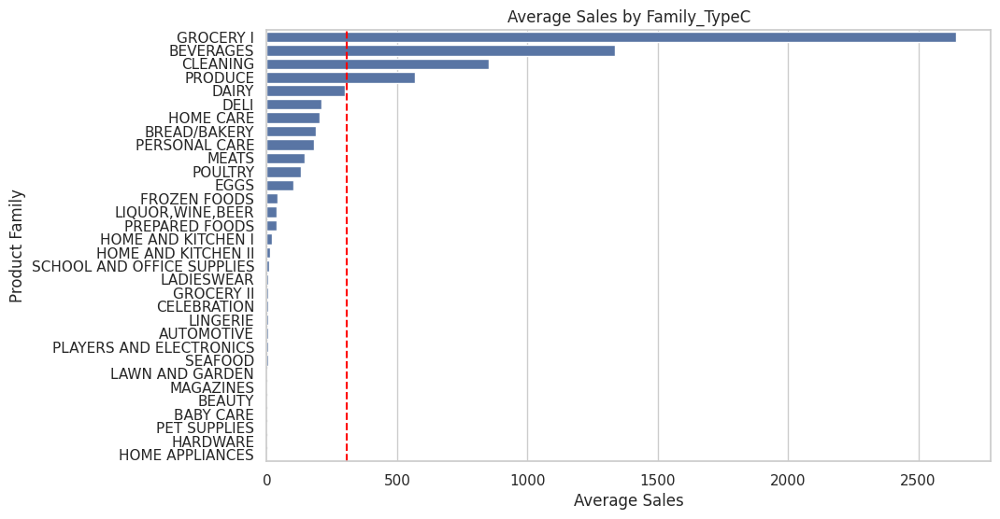

In [ ]:
### 각 품목별로 매출에 미치는 영향

# 각 family 별로 'sales'의 평균을 계산하고, 내림차순으로 정렬
average_sales_by_family = typeC.groupby('family')['sales'].mean().sort_values(ascending=False)

## 시각화
plt.figure(figsize=(10, 6))
sns.barplot(x='sales', y='family', data=typeC, order=average_sales_by_family.index, ci=None)
plt.axvline(x=typeC['sales'].mean(), color='red', linestyle='--') # 매출 전체 평균

# 그래프 제목 및 레이블 설정
plt.title('Average Sales by Family_TypeC')
plt.xlabel('Average Sales')
plt.ylabel('Product Family')
plt.show()

- groceryI과 beverage, CLEANING가 매출의 대부분을 차지한다.
> 모델링 시 제품군을 one-hot encoding 후 반영하는 것이 좋을 것이라고 판단됨

### **💚 onpromotion**

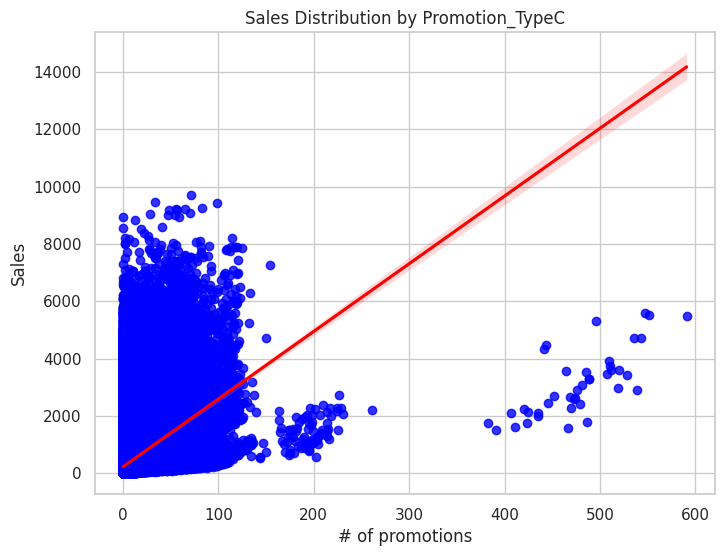

In [ ]:
plt.figure(figsize=(8, 6))

sns.regplot(x='onpromotion', y='sales', data=typeC, scatter_kws={'color': 'blue'}, line_kws={'color': 'red'})

# 그래프 제목 및 레이블 설정
plt.title('Sales Distribution by Promotion_TypeC')
plt.xlabel('# of promotions')
plt.ylabel('Sales')
plt.show()

- 약한 양의 상관관계를 보인다.
- promotion되는 제품 수와 상관 없이 매출액이 큰 경우들이 존재함을 확인할 수 있다.

### **💙 state**

In [ ]:
# 고유한 주(state) 수

typeC['state'].unique()

array(['El Oro', 'Guayas', 'Manabi', 'Pichincha',
       'Santo Domingo de los Tsachilas', 'Imbabura', 'Bolivar',
       'Cotopaxi', 'Chimborazo', 'Los Rios', 'Pastaza'], dtype=object)

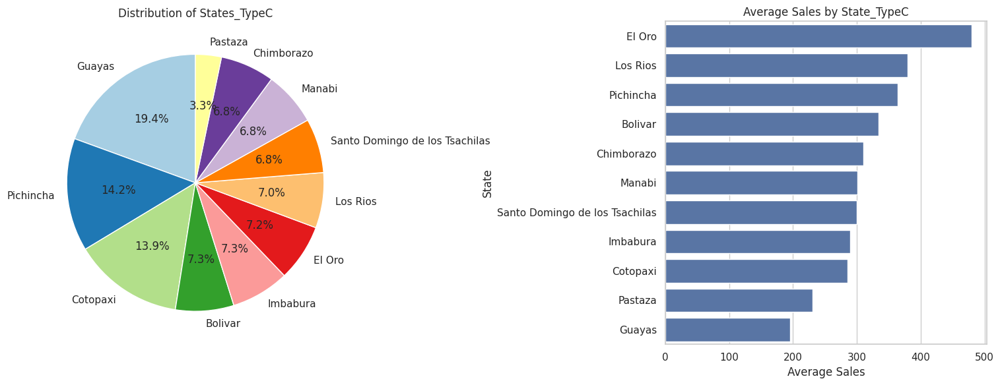

In [ ]:
plt.figure(figsize=(15, 6))

# 첫 번째 subplot: 파이 차트
plt.subplot(1, 2, 1)
state_counts = typeC['state'].value_counts()
plt.pie(state_counts, labels=state_counts.index, autopct='%1.1f%%', startangle=90, colors=plt.cm.Paired.colors)
plt.title('Distribution of States_TypeC')

# 두 번째 subplot: 막대 그래프
plt.subplot(1, 2, 2)
average_sales_by_state = typeC.groupby('state')['sales'].mean().sort_values(ascending=False)
sns.barplot(x='sales', y='state', data=typeC, order=average_sales_by_state.index, ci=None)

plt.title('Average Sales by State_TypeC')
plt.xlabel('Average Sales')
plt.ylabel('State')
plt.tight_layout()
plt.show()

- 주마다 매출액에 차이가 있음을 확인할 수 있다.
- Manabi 주의 경우 데이터 건수가 7.0%로 적은 편임에도 불구하고 매출에 큰 영향을 미침을 확인할 수 있다.
* Guayas 주의 경우 데이터 건수가 19.5%를 차지하며 가장 큼에도 불구하고 평균 매출은 가장 작음을 확인할 수 있다.

### **💜 city**

In [ ]:
# 고유한 도시(city) 수

print(typeC.groupby('state')['store_nbr'].unique())
print()
print(typeC.groupby('state')['city'].unique())

state
Bolivar                                   [19]
Chimborazo                                [14]
Cotopaxi                              [12, 13]
El Oro                                    [40]
Guayas                            [35, 30, 32]
Imbabura                                  [15]
Los Rios                                  [33]
Manabi                                    [54]
Pastaza                                   [22]
Pichincha                             [17, 10]
Santo Domingo de los Tsachilas            [16]
Name: store_nbr, dtype: object

state
Bolivar                                    [Guaranda]
Chimborazo                                 [Riobamba]
Cotopaxi                                  [Latacunga]
El Oro                                      [Machala]
Guayas                            [Playas, Guayaquil]
Imbabura                                     [Ibarra]
Los Rios                                    [Quevedo]
Manabi                                    [El Carmen]
Pastaza

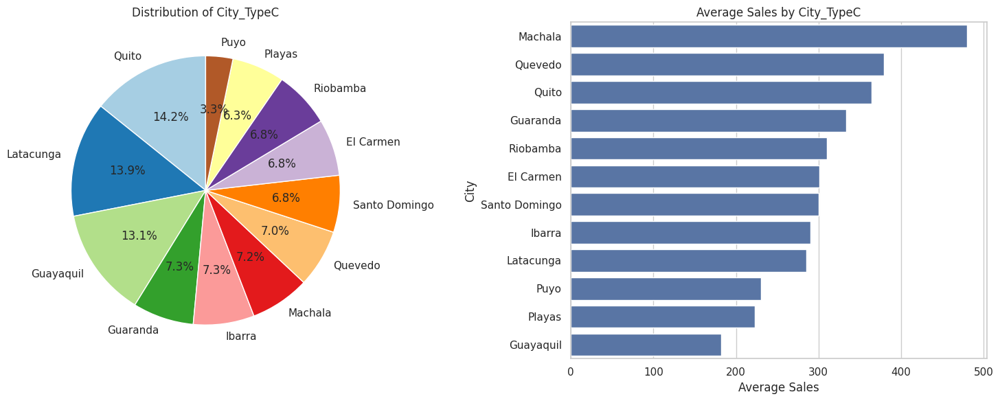

In [ ]:
plt.figure(figsize=(15, 6))

# 첫 번째 subplot: 파이 차트
plt.subplot(1, 2, 1)
city_counts = typeC['city'].value_counts()
plt.pie(city_counts, labels=city_counts.index, autopct='%1.1f%%', startangle=90, colors=plt.cm.Paired.colors)
plt.title('Distribution of City_TypeC')

# 두 번째 subplot: 막대 그래프
plt.subplot(1, 2, 2)
average_sales_by_city = typeC.groupby('city')['sales'].mean().sort_values(ascending=False)
sns.barplot(x='sales', y='city', data=typeC, order=average_sales_by_city.index, ci=None)

plt.title('Average Sales by City_TypeC')
plt.xlabel('Average Sales')
plt.ylabel('City')
plt.tight_layout()
plt.show()

- `state`를 통해 `city`가 다 구분되는 상황
  - `sales`의 양상이 `state`와 유사
- typeC에서 유일하게 city 2개를 포함하고 있는 state인 Guayas  를 살펴보았을 때, 그 안의 city인 Playas, Guayaquil는 평균 매출액이 가장 낮은편으로 비슷한 경향을 가진다.
    * `state` 변수 하나만 남기기로 결정

### **🤎dcoilwtico**

In [ ]:
import plotly.express as px

daily_oil_price = typeC.groupby("date")["dcoilwtico"].mean().reset_index()

# 그래프 그리기
fig = px.line(daily_oil_price, x="date", y="dcoilwtico", title="Daily DcoilWTICO Prices")
fig.show()

- 유가 변동 경향과 sales의 변동이 별 상관은 없어 보인다.(추세가 다름)
- 2014년을 기점으로 급격하게 감소하는 추세를 보인다.
  - 그에 비해 매출은 그렇게 오르지 않았다.

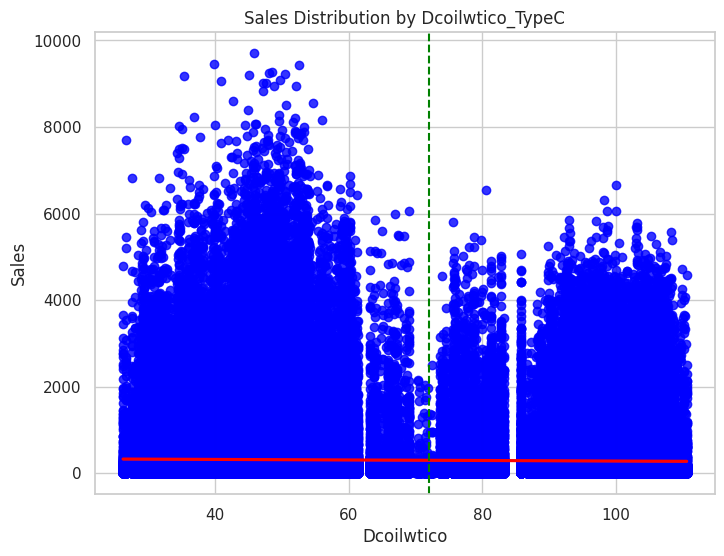

In [ ]:
plt.figure(figsize=(8, 6))

sns.regplot(x='dcoilwtico', y='sales', data=typeC, scatter_kws={'color': 'blue'}, line_kws={'color': 'red'})
plt.axvline(x=72, color='green', linestyle='--') # 72 구분선

# 그래프 제목 및 레이블 설정
plt.title('Sales Distribution by Dcoilwtico_TypeC')
plt.xlabel('Dcoilwtico')
plt.ylabel('Sales')
plt.show()

- 정말 별 상관은 없어 보인다.
- 다만 유가가 **72** 전후에서 두 개의 그룹으로 확연히 분리되는 것을 확인할 수 있다.

In [ ]:
under72 = typeC.loc[typeC['dcoilwtico'] <= 72,:]
over72 = typeC.loc[typeC['dcoilwtico'] > 72,:]

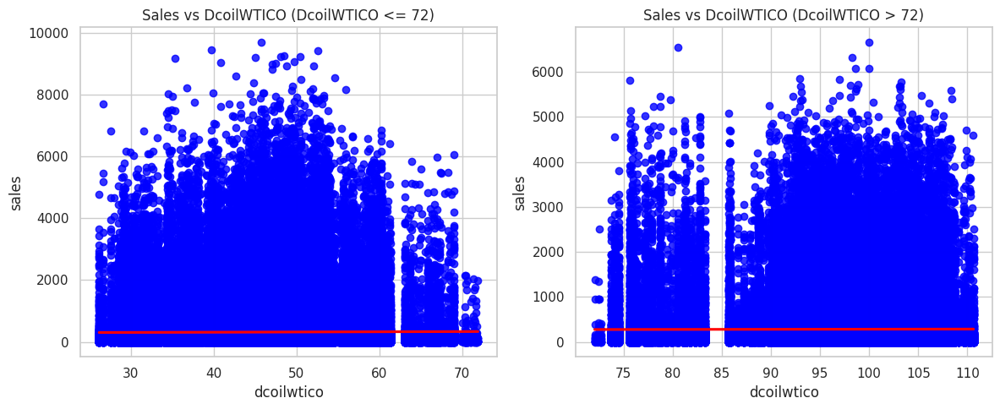

In [ ]:
sns.set(style="whitegrid")

fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Plot regplot for 'dcoilwtico' <= 72
sns.regplot(x='dcoilwtico', y='sales', data=under72, ax=axes[0], scatter_kws={'color': 'blue'}, line_kws={'color': 'red'})
axes[0].set_title('Sales vs DcoilWTICO (DcoilWTICO <= 72)')

# Plot regplot for 'dcoilwtico' > 72
sns.regplot(x='dcoilwtico', y='sales', data=over72, ax=axes[1], scatter_kws={'color': 'blue'}, line_kws={'color': 'red'})
axes[1].set_title('Sales vs DcoilWTICO (DcoilWTICO > 72)')

# Adjust layout
plt.tight_layout()
plt.show()

- 차이가 나타나진 않는다..

### **💗 transactions**

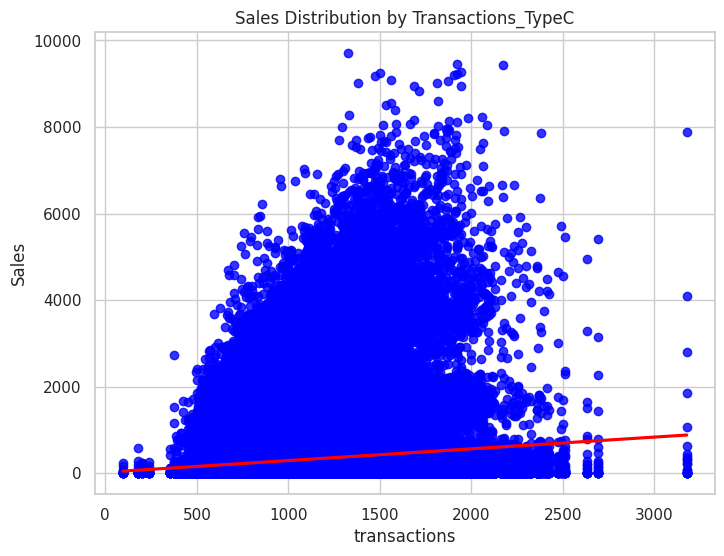

In [ ]:
plt.figure(figsize=(8, 6))

sns.regplot(x='transactions', y='sales', data=typeC, scatter_kws={'color': 'blue'}, line_kws={'color': 'red'})

# 그래프 제목 및 레이블 설정
plt.title('Sales Distribution by Transactions_TypeC')
plt.xlabel('transactions')
plt.ylabel('Sales')
plt.show()

- 약한 양의 상관관계를 보인다.
- 그닥 상관은 없어 보인다.  
(어짜피 모델링 시 활용하기 어려움..)

### **🤍 holiday**

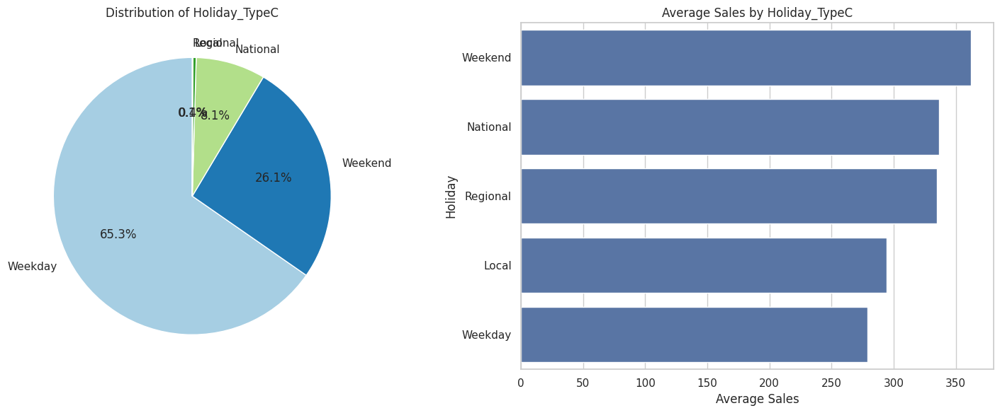

In [ ]:
plt.figure(figsize=(15, 6))

# 첫 번째 subplot: 파이 차트
plt.subplot(1, 2, 1)
holiday_counts = typeC['holiday'].value_counts()
plt.pie(holiday_counts, labels=holiday_counts.index, autopct='%1.1f%%', startangle=90, colors=plt.cm.Paired.colors)
plt.title('Distribution of Holiday_TypeC')

# 두 번째 subplot: 막대 그래프
plt.subplot(1, 2, 2)
average_sales_by_holiday = typeC.groupby('holiday')['sales'].mean().sort_values(ascending=False)
sns.barplot(x='sales', y='holiday', data=typeC, order=average_sales_by_holiday.index, ci=None)

plt.title('Average Sales by Holiday_TypeC')
plt.xlabel('Average Sales')
plt.ylabel('Holiday')
plt.tight_layout()
plt.show()

- 그냥 주말(공휴일은 제외됨)에 매출이 가장 좋다.

### **⭐Target 변수(Sales)**
- 여러 요인에 따라 매출이 어떻게 달라지는지 살펴보자.

#### **a) 시간 관련 변수**

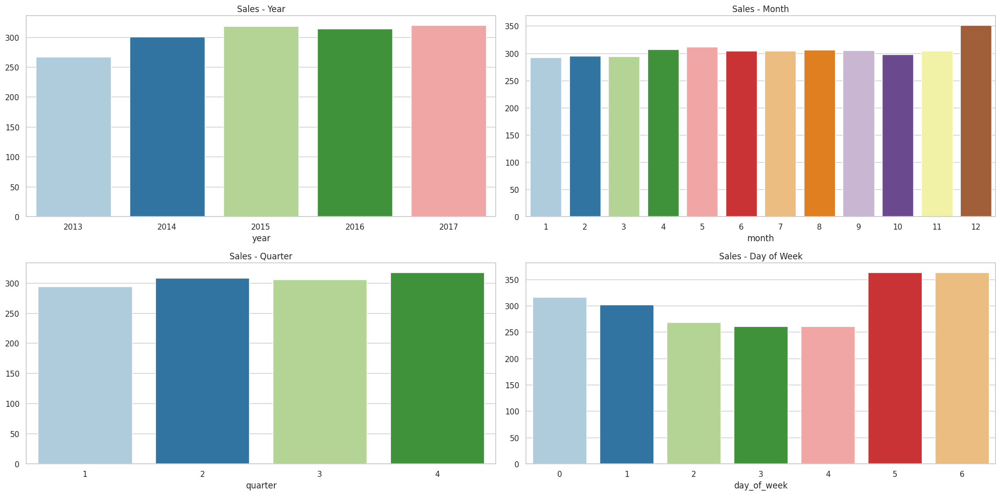

In [ ]:
### 평균 매출액으로 시각화
data_grouped_year = typeC.groupby(['year']).mean()['sales']
data_grouped_month = typeC.groupby(['month']).mean()['sales']
data_grouped_quarter = typeC.groupby(['quarter']).mean()['sales']
data_grouped_day = typeC.groupby(['day_of_week']).mean()['sales']

palette = sns.color_palette("Paired")

fig, axes = plt.subplots(2, 2, figsize=(20, 10))
# 연도별 매출
axes[0, 0].set_title('Sales - Year')
sns.barplot(x=data_grouped_year.index, y=data_grouped_year.values, ax=axes[0, 0], palette=palette)
# 월별 매출
axes[0, 1].set_title('Sales - Month')
sns.barplot(x=data_grouped_month.index, y=data_grouped_month.values, ax=axes[0, 1], palette=palette)
# 분기별 매출
axes[1, 0].set_title('Sales - Quarter')
sns.barplot(x=data_grouped_quarter.index, y=data_grouped_quarter.values, ax=axes[1, 0], palette=palette)
# 요일별 매출
axes[1, 1].set_title('Sales - Day of Week')
sns.barplot(x=data_grouped_day.index, y=data_grouped_day.values, ax=axes[1, 1], palette=palette)

plt.tight_layout()
plt.show()

**연도별 매출**
- 뒤로 갈수록 매출액이 점점 증가하고 있다.

**월별 & 분기별 매출**  
- 대체로 비슷한 경향을 보이나, 12월에 매출이 증가
- 4분기에 매출이 약간 증가

**요일별 매출**  
- 평일에 비해 주말의 매출액이 더 높다.
- 평일 중에서는 수, 목, 금의 매출이 가장 낮다.

#### **b) 변수들 간의 상관관계**
- 상관계수는 수치형 변수들끼리만 비교 가능

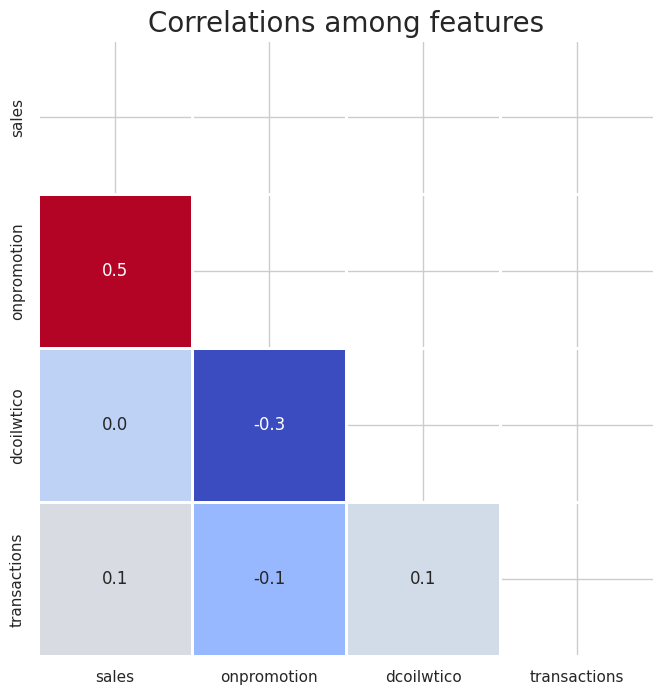

In [ ]:
num_ftrs = typeC[['sales', 'onpromotion','dcoilwtico','transactions']]

mask = np.triu(num_ftrs.corr(method = 'spearman'))

# heatmap을 이용한 시각화
plt.figure(figsize=(8, 8))
sns.heatmap(num_ftrs.corr(method = 'spearman'),
            annot=True,
            fmt='.1f',
            cmap='coolwarm',
            square=True,
            mask=mask,
            linewidths=1,
            cbar=False)
plt.title("Correlations among features", fontsize=20)
plt.show()

### **💡 후처리**

#### **최종 변수 선택**

In [ ]:
typeC.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 528567 entries, 1493 to 2704976
Data columns (total 16 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   id            528567 non-null  int64         
 1   date          528567 non-null  datetime64[ns]
 2   store_nbr     528567 non-null  int64         
 3   family        528567 non-null  object        
 4   sales         528567 non-null  float64       
 5   onpromotion   528567 non-null  float64       
 6   city          528567 non-null  object        
 7   state         528567 non-null  object        
 8   cluster       528567 non-null  int64         
 9   dcoilwtico    528567 non-null  float64       
 10  transactions  527642 non-null  float64       
 11  holiday       528567 non-null  object        
 12  year          528567 non-null  int64         
 13  quarter       528567 non-null  int64         
 14  month         528567 non-null  int64         
 15  day_of_week  

In [ ]:
typeC = typeC[['store_nbr', 'family', 'sales', 'onpromotion', 'state', 'cluster', 'dcoilwtico', 'holiday', 'year', 'quarter', 'month', 'day_of_week']]

# test의 경우에는 이후 submission 파일 작성을 위해 일단 id를 남겨두기로 결정
typeC_te = typeC_te[['id', 'store_nbr', 'family', 'onpromotion', 'state', 'cluster', 'dcoilwtico', 'holiday', 'year', 'quarter', 'month', 'day_of_week']]

In [ ]:
typeC.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 528567 entries, 1493 to 2704976
Data columns (total 12 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   store_nbr    528567 non-null  int64  
 1   family       528567 non-null  object 
 2   sales        528567 non-null  float64
 3   onpromotion  528567 non-null  float64
 4   state        528567 non-null  object 
 5   cluster      528567 non-null  int64  
 6   dcoilwtico   528567 non-null  float64
 7   holiday      528567 non-null  object 
 8   year         528567 non-null  int64  
 9   quarter      528567 non-null  int64  
 10  month        528567 non-null  int64  
 11  day_of_week  528567 non-null  int64  
dtypes: float64(3), int64(6), object(3)
memory usage: 52.4+ MB


#### **Train/Validation Split**

In [ ]:
from sklearn.model_selection import train_test_split

train, val = train_test_split(typeC, test_size=0.3, random_state=42, stratify=typeC[['store_nbr', 'family']]) # 가게별 비율 유지

In [ ]:
train.shape

(369996, 12)

In [ ]:
val.shape

(158571, 12)

#### **변수 왜곡 정도 확인**

In [ ]:
# 수치형 변수들에 대해서만 왜도 확인

num_ftrs = train[['sales', 'onpromotion','dcoilwtico']]
num_ftrs.skew()

sales         4.01
onpromotion   9.86
dcoilwtico    0.57
dtype: float64

In [ ]:
train['sales'] = np.log1p(train['sales'])
train['onpromotion'] = np.log1p(train['onpromotion'])

In [ ]:
train[['sales', 'onpromotion','dcoilwtico']].skew()

sales         0.10
onpromotion   2.11
dcoilwtico    0.57
dtype: float64

- 왜곡 정도가 많이 개선되었다.

In [ ]:
val['onpromotion'] = np.log1p(val['onpromotion'])
typeC_te['onpromotion'] = np.log1p(typeC_te['onpromotion'])

#### **스케일링**
- 수치형 변수들에 대한 스케일링 진행

In [ ]:
from sklearn.preprocessing import StandardScaler

# Initialize StandardScaler
scaler = StandardScaler()

# Fit and transform the selected variables
train[['onpromotion', 'dcoilwtico']] = scaler.fit_transform(train[['onpromotion', 'dcoilwtico']])
val[['onpromotion', 'dcoilwtico']] = scaler.transform(val[['onpromotion', 'dcoilwtico']])
typeC_te[['onpromotion', 'dcoilwtico']] = scaler.transform(typeC_te[['onpromotion', 'dcoilwtico']])

In [ ]:
train.head()

,store_nbr,family,sales,onpromotion,state,cluster,dcoilwtico,holiday,year,quarter,month,day_of_week
1898710,54,MEATS,4.24,2.04,Manabi,3,-0.74,National,2016,2,4,5
849931,54,POULTRY,4.09,-0.50,Manabi,3,1.66,Weekday,2014,3,7,0
550216,10,GROCERY I,8.12,-0.50,Pichincha,15,1.18,Weekend,2014,1,1,5
583500,17,DAIRY,6.51,-0.50,Pichincha,12,1.28,Weekend,2014,1,1,6
771487,14,HARDWARE,0.69,-0.50,Chimborazo,7,1.58,Weekend,2014,2,5,5


In [ ]:
val.head()

,store_nbr,family,sales,onpromotion,state,cluster,dcoilwtico,holiday,year,quarter,month,day_of_week
131484,54,BEVERAGES,497.00,-0.50,Manabi,3,1.33,Weekend,2013,1,3,6
2441321,32,PERSONAL CARE,101.00,1.67,Guayas,3,-0.64,Weekday,2017,1,3,2
2684028,32,MEATS,84.91,2.36,Guayas,3,-0.61,Weekday,2017,3,8,3
1823801,32,DELI,122.00,-0.50,Guayas,3,-0.97,Weekday,2016,1,3,3
2225602,30,AUTOMOTIVE,1.00,-0.50,Guayas,3,-0.78,Weekday,2016,4,11,1


In [ ]:
typeC_te.head()

,id,store_nbr,family,onpromotion,state,cluster,dcoilwtico,holiday,year,quarter,month,day_of_week
33,3000921,10,AUTOMOTIVE,-0.50,Pichincha,15,-0.70,Weekday,2017,3,8,2
34,3000922,10,BABY CARE,-0.50,Pichincha,15,-0.70,Weekday,2017,3,8,2
35,3000923,10,BEAUTY,0.59,Pichincha,15,-0.70,Weekday,2017,3,8,2
36,3000924,10,BEVERAGES,3.24,Pichincha,15,-0.70,Weekday,2017,3,8,2
37,3000925,10,BOOKS,-0.50,Pichincha,15,-0.70,Weekday,2017,3,8,2


#### **범주형 변수 처리**

In [ ]:
train  = pd.get_dummies(train , columns=['store_nbr','family', 'state', 'cluster', 'holiday', 'year', 'quarter', 'month', 'day_of_week'])
train .head()

,sales,onpromotion,dcoilwtico,store_nbr_10,store_nbr_12,store_nbr_13,store_nbr_14,store_nbr_15,store_nbr_16,store_nbr_17,store_nbr_19,store_nbr_22,store_nbr_30,store_nbr_32,store_nbr_33,store_nbr_35,store_nbr_40,store_nbr_54,family_AUTOMOTIVE,family_BABY CARE,family_BEAUTY,family_BEVERAGES,family_BREAD/BAKERY,family_CELEBRATION,family_CLEANING,family_DAIRY,family_DELI,family_EGGS,family_FROZEN FOODS,family_GROCERY I,family_GROCERY II,family_HARDWARE,family_HOME AND KITCHEN I,family_HOME AND KITCHEN II,family_HOME APPLIANCES,family_HOME CARE,family_LADIESWEAR,family_LAWN AND GARDEN,family_LINGERIE,"family_LIQUOR,WINE,BEER",family_MAGAZINES,family_MEATS,family_PERSONAL CARE,family_PET SUPPLIES,family_PLAYERS AND ELECTRONICS,family_POULTRY,family_PREPARED FOODS,family_PRODUCE,family_SCHOOL AND OFFICE SUPPLIES,family_SEAFOOD,state_Bolivar,state_Chimborazo,state_Cotopaxi,state_El Oro,state_Guayas,state_Imbabura,state_Los Rios,state_Manabi,state_Pastaza,state_Pichincha,state_Santo Domingo de los Tsachilas,cluster_3,cluster_7,cluster_12,cluster_15,holiday_Local,holiday_National,holiday_Regional,holiday_Weekday,holiday_Weekend,year_2013,year_2014,year_2015,year_2016,year_2017,quarter_1,quarter_2,quarter_3,quarter_4,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12,day_of_week_0,day_of_week_1,day_of_week_2,day_of_week_3,day_of_week_4,day_of_week_5,day_of_week_6
1898710,4.24,2.04,-0.74,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
849931,4.09,-0.50,1.66,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0
550216,8.12,-0.50,1.18,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
583500,6.51,-0.50,1.28,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
771487,0.69,-0.50,1.58,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0


In [ ]:
train.shape

(369996, 98)

In [ ]:
val  = pd.get_dummies(val , columns=['store_nbr','family', 'state', 'cluster', 'holiday', 'year', 'quarter', 'month', 'day_of_week'])
val.head()

,sales,onpromotion,dcoilwtico,store_nbr_10,store_nbr_12,store_nbr_13,store_nbr_14,store_nbr_15,store_nbr_16,store_nbr_17,store_nbr_19,store_nbr_22,store_nbr_30,store_nbr_32,store_nbr_33,store_nbr_35,store_nbr_40,store_nbr_54,family_AUTOMOTIVE,family_BABY CARE,family_BEAUTY,family_BEVERAGES,family_BREAD/BAKERY,family_CELEBRATION,family_CLEANING,family_DAIRY,family_DELI,family_EGGS,family_FROZEN FOODS,family_GROCERY I,family_GROCERY II,family_HARDWARE,family_HOME AND KITCHEN I,family_HOME AND KITCHEN II,family_HOME APPLIANCES,family_HOME CARE,family_LADIESWEAR,family_LAWN AND GARDEN,family_LINGERIE,"family_LIQUOR,WINE,BEER",family_MAGAZINES,family_MEATS,family_PERSONAL CARE,family_PET SUPPLIES,family_PLAYERS AND ELECTRONICS,family_POULTRY,family_PREPARED FOODS,family_PRODUCE,family_SCHOOL AND OFFICE SUPPLIES,family_SEAFOOD,state_Bolivar,state_Chimborazo,state_Cotopaxi,state_El Oro,state_Guayas,state_Imbabura,state_Los Rios,state_Manabi,state_Pastaza,state_Pichincha,state_Santo Domingo de los Tsachilas,cluster_3,cluster_7,cluster_12,cluster_15,holiday_Local,holiday_National,holiday_Regional,holiday_Weekday,holiday_Weekend,year_2013,year_2014,year_2015,year_2016,year_2017,quarter_1,quarter_2,quarter_3,quarter_4,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12,day_of_week_0,day_of_week_1,day_of_week_2,day_of_week_3,day_of_week_4,day_of_week_5,day_of_week_6
131484,497.00,-0.50,1.33,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
2441321,101.00,1.67,-0.64,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
2684028,84.91,2.36,-0.61,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0
1823801,122.00,-0.50,-0.97,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
2225602,1.00,-0.50,-0.78,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0


In [ ]:
val.shape

(158571, 98)

- 97개의 feature 변수, 1개의 target 변수

In [ ]:
typeC_te = pd.get_dummies(typeC_te, columns=['store_nbr','family', 'state', 'cluster', 'holiday', 'year', 'quarter', 'month', 'day_of_week'])
typeC_te.head()

,id,onpromotion,dcoilwtico,store_nbr_10,store_nbr_12,store_nbr_13,store_nbr_14,store_nbr_15,store_nbr_16,store_nbr_17,store_nbr_19,store_nbr_22,store_nbr_30,store_nbr_32,store_nbr_33,store_nbr_35,store_nbr_40,store_nbr_54,family_AUTOMOTIVE,family_BABY CARE,family_BEAUTY,family_BEVERAGES,family_BOOKS,family_BREAD/BAKERY,family_CELEBRATION,family_CLEANING,family_DAIRY,family_DELI,family_EGGS,family_FROZEN FOODS,family_GROCERY I,family_GROCERY II,family_HARDWARE,family_HOME AND KITCHEN I,family_HOME AND KITCHEN II,family_HOME APPLIANCES,family_HOME CARE,family_LADIESWEAR,family_LAWN AND GARDEN,family_LINGERIE,"family_LIQUOR,WINE,BEER",family_MAGAZINES,family_MEATS,family_PERSONAL CARE,family_PET SUPPLIES,family_PLAYERS AND ELECTRONICS,family_POULTRY,family_PREPARED FOODS,family_PRODUCE,family_SCHOOL AND OFFICE SUPPLIES,family_SEAFOOD,state_Bolivar,state_Chimborazo,state_Cotopaxi,state_El Oro,state_Guayas,state_Imbabura,state_Los Rios,state_Manabi,state_Pastaza,state_Pichincha,state_Santo Domingo de los Tsachilas,cluster_3,cluster_7,cluster_12,cluster_15,holiday_Weekday,holiday_Weekend,year_2017,quarter_3,month_8,day_of_week_0,day_of_week_1,day_of_week_2,day_of_week_3,day_of_week_4,day_of_week_5,day_of_week_6
33,3000921,-0.50,-0.70,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,1,0,1,1,1,0,0,1,0,0,0,0
34,3000922,-0.50,-0.70,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,1,0,1,1,1,0,0,1,0,0,0,0
35,3000923,0.59,-0.70,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,1,0,1,1,1,0,0,1,0,0,0,0
36,3000924,3.24,-0.70,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,1,0,1,1,1,0,0,1,0,0,0,0
37,3000925,-0.50,-0.70,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,1,0,1,1,1,0,0,1,0,0,0,0


In [ ]:
typeC_te.shape

(7920, 78)

- 차이가 나는 부분
  - holiday
  - year
  - quarter
  - month

In [ ]:
## typeC_te 변수 추가
typeC_te[['holiday_Local' ,'holiday_National', 'holiday_Regional', 'year_2013',	'year_2014'	,'year_2015','year_2016','quarter_1',
          'quarter_2', 'quarter_4', 'month_1',	'month_2',	'month_3',	'month_4',	'month_5',	'month_6',	'month_7',	'month_9',
          'month_10', 'month_11', 'month_12']] = 0

In [ ]:
train.shape

(369996, 98)

In [ ]:
typeC_te.shape

(7920, 99)

In [ ]:
train.columns.difference(typeC_te.columns)

Index(['sales'], dtype='object')

In [ ]:
typeC_te.columns.difference(train.columns)

Index(['family_BOOKS', 'id'], dtype='object')

* typeC에 속하는 매장들은 해당 제품군을 판매하지 x
    * 모델링 시에는 삭제
* 이후 예측값을 다 0으로 표시

In [ ]:
# 최종 파일 저장

train.to_csv('/content/drive/MyDrive/ESAA/OB/방학프로젝트/data/modeling/train/trainC.csv', index = False)
val.to_csv('/content/drive/MyDrive/ESAA/OB/방학프로젝트/data/modeling/val/valC.csv', index = False)
typeC_te.to_csv('/content/drive/MyDrive/ESAA/OB/방학프로젝트/data/modeling/test/testC.csv', index = False)

## **4-4. Type D**

In [ ]:
typeD = typeD.drop('type', axis = 1) # 더 이상 type 변수는 필요 없으므로 삭제
typeD_te = typeD_te.drop('type', axis = 1) # 더 이상 type 변수는 필요 없으므로 삭제

In [ ]:
typeD.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 733451 entries, 1427 to 2705085
Data columns (total 16 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   id            733451 non-null  int64         
 1   date          733451 non-null  datetime64[ns]
 2   store_nbr     733451 non-null  int64         
 3   family        733451 non-null  object        
 4   sales         733451 non-null  float64       
 5   onpromotion   733451 non-null  float64       
 6   city          733451 non-null  object        
 7   state         733451 non-null  object        
 8   cluster       733451 non-null  int64         
 9   dcoilwtico    733451 non-null  float64       
 10  transactions  732323 non-null  float64       
 11  holiday       733451 non-null  object        
 12  year          733451 non-null  int64         
 13  quarter       733451 non-null  int64         
 14  month         733451 non-null  int64         
 15  day_of_week  

In [ ]:
# 수치형 변수들의 기초통계량 확인

typeD[['sales', 'onpromotion', 'dcoilwtico', 'transactions']].describe()

,sales,onpromotion,dcoilwtico,transactions
count,733451.00,733451.00,733451.00,732323.00
mean,478.67,3.68,63.74,1637.79
std,1100.37,15.36,24.62,708.06
min,0.15,0.00,26.19,6.00
25%,10.00,0.00,45.82,1132.00
50%,86.00,0.00,51.14,1545.00
75%,372.00,1.00,93.36,1943.00
max,124717.00,741.00,110.62,6085.00


- target 변수인 `sales`는 굉장히 왜곡된 분포를 보이고 있다.
  - `np.log1p()`를 통한 로그 변환 수행 후 모델링하면 좋을 듯하다.
- `onpromotion` 변수의 경우 심하게 왜곡된 분포를 가지고 있음
  - 상관관계를 보고 전처리 유무를 결정하자.


### **🧡 store_nbr**

In [ ]:
# 고유한 매장 수

typeD['store_nbr'].unique()

array([25, 41,  4, 37, 38,  6,  8,  7,  5,  2,  1,  3, 23, 24, 27, 26, 53,
       42])

* 18개 매장

In [ ]:
### 각 매장별 매출 총액 시도표(일 단위)

a = typeD.set_index("date").groupby("store_nbr").resample("D").sales.sum().reset_index()
px.line(a, x = "date", y= "sales", color = "store_nbr", title = "Daily total sales of the stores_Type D")

- 각 매장마다 매출이 상이한 것을 확인할 수 있다.
- 3번 매장의 경우 매출액이 다른 매장에 비해 큰 것을 확인할 수 있다.
- 2번 매장의 경우 특정 시점에 매출이 굉장히 높다.
    
    -> 이상치일 확률이 높음

- 24, 25번 매장의 경우 특정 기간 동안 sales가 0이다.

    -> 임시 휴업으로 인한 영향일 수 있음

    -> sales가 0인 데이터를 지웠는데 어떻게 남아있는지 모르겠음...

    > 모델링 시 매장 번호를 one-hot encoding 후 반영하는 것이 좋을 것이라고 판단됨

- 가게별로 매출에 이상치가 존재하는 것을 확인할 수 있다.

 - Kaggle 설명에 따르면 지진의 영향이라고 함
 - 그러나 test 예측 시점에는 지진에 대한 정보를 전혀 알 수 x
> 이상치 제거 진행

#### **📌 이상치 제거**

In [ ]:
typeD.shape

(733451, 16)

>> 원래는 733451건의 데이터

In [ ]:
typeD.groupby(['store_nbr', 'family'])['sales'].describe()

count    mean     std    min     25%  \
store_nbr family                                                              
1         AUTOMOTIVE                 1463.00    3.74    2.63   1.00    2.00   
          BEAUTY                     1430.00    2.84    1.74   1.00    1.25   
          BEVERAGES                  1678.00 1593.43  721.93 172.00  971.00   
          BOOKS                       127.00    1.66    1.13   1.00    1.00   
          BREAD/BAKERY               1678.00  339.69  109.62  71.36  283.06   
...                                      ...     ...     ...    ...     ...   
53        POULTRY                    1169.00  197.54  106.26   3.83  137.85   
          PREPARED FOODS             1167.00   72.16   32.98  10.00   48.84   
          PRODUCE                    1141.00 1637.19 1028.12   1.00 1047.57   
          SCHOOL AND OFFICE SUPPLIES  448.00    2.83    8.30   1.00    1.00   
          SEAFOOD                    1103.00    5.94    4.10   0.23    3.00   

                                         50%     75%     max  
store_nbr family                                              
1         AUTOMOTIVE                    3.00    5.00   19.00  
          BEAUTY                        2.00    4.00   12.00  
          BEVERAGES                  1687.00 2206.00 5051.00  
          BOOKS                         1.00    2.00    8.00  
          BREAD/BAKERY                359.29  420.87  745.51  
...                                      ...     ...     ...  
53        POULTRY                     179.01  235.45 1802.04  
          PREPARED FOODS               64.73   87.46  228.56  
          PRODUCE                    1645.94 2250.57 4876.91  
          SCHOOL AND OFFICE SUPPLIES    1.00    2.00  100.00  
          SEAFOOD                       5.00    8.00   30.46  

[591 rows x 8 columns]

In [ ]:
### 이상치 탐지 함수

def get_outlier_indices(df_col, weight=3):
    q1, q3 = np.percentile(df_col, [25, 75])
    iqr = q3 - q1
    iqr_weight = iqr * weight

    lowest_val, highest_val = q1 - iqr_weight, q3 + iqr_weight
    outlier_indices = df_col[(df_col < lowest_val) | (df_col > highest_val)].index

    return outlier_indices

In [ ]:
cols = ['store_nbr', 'family']

# 제거할 행(row)의 인덱스를 저장
rows_to_drop = []

for col in cols:
    # 'store_nbr', 'family'을 기준으로 데이터를 그룹화
    grouped = typeD.groupby(cols)
    # 각 그룹에 대해 이상치를 찾아내고 인덱스를 추가
    for (_, group_data) in grouped:
        outlier_indices = get_outlier_indices(group_data['sales'], weight=3)
        rows_to_drop.extend(outlier_indices)

# 이상치 제거
typeD = typeD.drop(rows_to_drop)

In [ ]:
typeD.shape

(727225, 16)

>> 727225건으로 데이터 감소

In [ ]:
typeD.groupby(['store_nbr', 'family'])['sales'].describe()

count    mean     std    min     25%  \
store_nbr family                                                              
1         AUTOMOTIVE                 1457.00    3.69    2.49   1.00    2.00   
          BEAUTY                     1430.00    2.84    1.74   1.00    1.25   
          BEVERAGES                  1678.00 1593.43  721.93 172.00  971.00   
          BOOKS                       124.00    1.54    0.81   1.00    1.00   
          BREAD/BAKERY               1678.00  339.69  109.62  71.36  283.06   
...                                      ...     ...     ...    ...     ...   
53        POULTRY                    1161.00  192.44   75.40   3.83  137.81   
          PREPARED FOODS             1161.00   71.42   31.38  10.00   48.76   
          PRODUCE                    1141.00 1637.19 1028.12   1.00 1047.57   
          SCHOOL AND OFFICE SUPPLIES  428.00    1.73    0.98   1.00    1.00   
          SEAFOOD                    1099.00    5.86    3.90   0.23    3.00   

                                         50%     75%     max  
store_nbr family                                              
1         AUTOMOTIVE                    3.00    5.00   14.00  
          BEAUTY                        2.00    4.00   12.00  
          BEVERAGES                  1687.00 2206.00 5051.00  
          BOOKS                         1.00    2.00    5.00  
          BREAD/BAKERY                359.29  420.87  745.51  
...                                      ...     ...     ...  
53        POULTRY                     178.14  233.16  502.08  
          PREPARED FOODS               64.51   86.64  198.06  
          PRODUCE                    1645.94 2250.57 4876.91  
          SCHOOL AND OFFICE SUPPLIES    1.00    2.00    5.00  
          SEAFOOD                       5.00    8.00   23.00  

[591 rows x 8 columns]

In [ ]:
b = typeD.set_index("date").groupby("store_nbr").resample("D").sales.sum().reset_index()
px.line(b, x = "date", y= "sales", color = "store_nbr", title = "Daily total sales of the stores_Type D")

>> 이상치가 어느정도는 제거됨

### **💛 family**

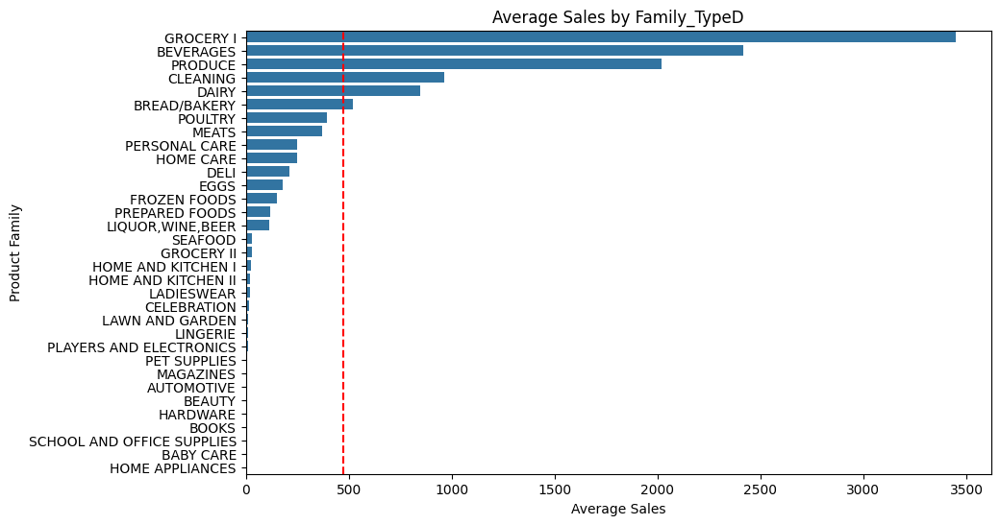

In [ ]:
### 각 품목별로 매출에 미치는 영향

# 각 family 별로 'sales'의 평균을 계산하고, 내림차순으로 정렬
average_sales_by_family = typeD.groupby('family')['sales'].mean().sort_values(ascending=False)

## 시각화
plt.figure(figsize=(10, 6))
sns.barplot(x='sales', y='family', data=typeD, order=average_sales_by_family.index, ci=None)
plt.axvline(x=typeD['sales'].mean(), color='red', linestyle='--') # 매출 전체 평균

# 그래프 제목 및 레이블 설정
plt.title('Average Sales by Family_TypeD')
plt.xlabel('Average Sales')
plt.ylabel('Product Family')
plt.show()

- groceryI과 beverage가 매출의 대부분을 차지한다.
> 모델링 시 제품군을 one-hot encoding 후 반영하는 것이 좋을 것이라고 판단됨

### **💚 onpromotion**

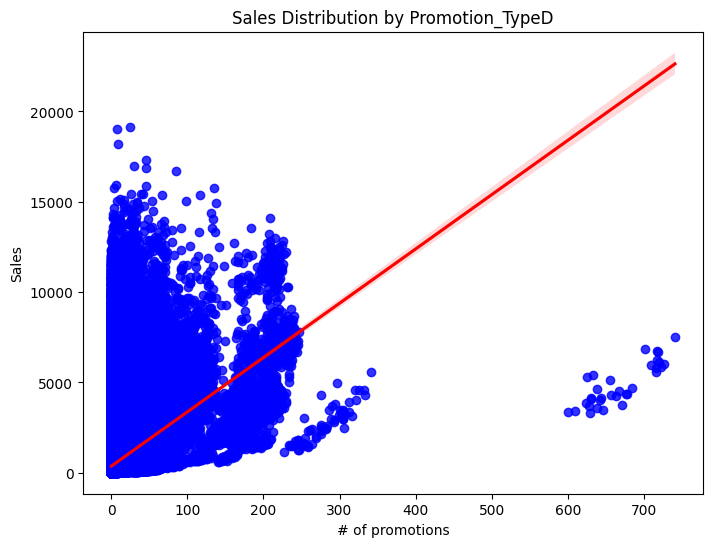

In [ ]:
plt.figure(figsize=(8, 6))

sns.regplot(x='onpromotion', y='sales', data=typeD, scatter_kws={'color': 'blue'}, line_kws={'color': 'red'})

# 그래프 제목 및 레이블 설정
plt.title('Sales Distribution by Promotion_TypeD')
plt.xlabel('# of promotions')
plt.ylabel('Sales')
plt.show()

- 약한 양의 상관관계를 보인다.
- promotion되는 제품 수와 상관 없이 매출액이 큰 경우들이 존재함을 확인할 수 있다.
- promotion 제품의 수가 적은데 sales가 높거나, promotion 제품의 수가 많은데 sales가 적은 경우들이 존재함.

### **💙 state**

In [ ]:
# 고유한 주(state) 수

typeD['state'].unique()

array(['Santa Elena', 'El Oro', 'Pichincha', 'Azuay', 'Loja',
       'Santo Domingo de los Tsachilas', 'Tungurahua', 'Guayas', 'Manabi'],
      dtype=object)

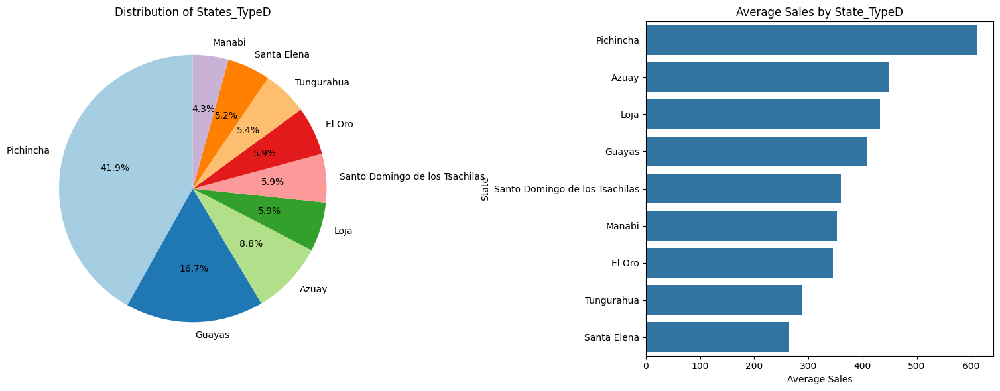

In [ ]:
plt.figure(figsize=(15, 6))

# 첫 번째 subplot: 파이 차트
plt.subplot(1, 2, 1)
state_counts = typeD['state'].value_counts()
plt.pie(state_counts, labels=state_counts.index, autopct='%1.1f%%', startangle=90, colors=plt.cm.Paired.colors)
plt.title('Distribution of States_TypeD')

# 두 번째 subplot: 막대 그래프
plt.subplot(1, 2, 2)
average_sales_by_state = typeD.groupby('state')['sales'].mean().sort_values(ascending=False)
sns.barplot(x='sales', y='state', data=typeD, order=average_sales_by_state.index, ci=None)

plt.title('Average Sales by State_TypeD')
plt.xlabel('Average Sales')
plt.ylabel('State')
plt.tight_layout()
plt.show()

- 주마다 매출액에 차이가 있음을 확인할 수 있다.
- Pichincha 주는 가장 많은 비율을 차지하면서 평균 매출도 가장 높다.
- (Azuay, Loja, Guayas), (Santo Domingo de los Tsachilas, Manabi, El Oro), ( Santa Elena, Tungurahua) 각 그룹 별로 매출이 비슷하다.

### **💜 city**

In [ ]:
# 고유한 도시(city) 수

print(typeD.groupby('state')['store_nbr'].unique())
print()
print(typeD.groupby('state')['city'].unique())

state
Azuay                                          [37, 42]
El Oro                                             [41]
Guayas                                     [24, 27, 26]
Loja                                               [38]
Manabi                                             [53]
Pichincha                         [4, 6, 8, 7, 2, 1, 3]
Santa Elena                                        [25]
Santo Domingo de los Tsachilas                      [5]
Tungurahua                                         [23]
Name: store_nbr, dtype: object

state
Azuay                                       [Cuenca]
El Oro                                     [Machala]
Guayas                            [Guayaquil, Daule]
Loja                                          [Loja]
Manabi                                       [Manta]
Pichincha                                    [Quito]
Santa Elena                                [Salinas]
Santo Domingo de los Tsachilas       [Santo Domingo]
Tungurahua                  

- 대부분의 state에는 city가 하나씩만 존재한다.
- 'Guayas'주에만 도시가 'Guayaquil', 'Daule' 두 가지가 있다.


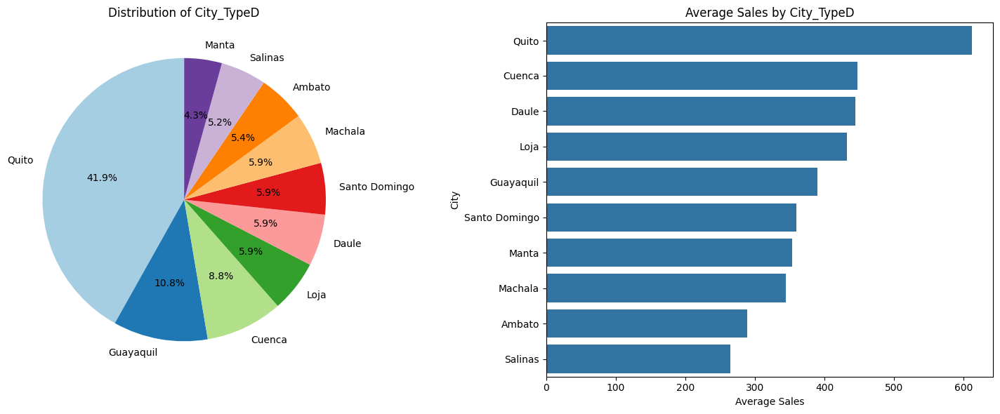

In [ ]:
plt.figure(figsize=(15, 6))

# 첫 번째 subplot: 파이 차트
plt.subplot(1, 2, 1)
city_counts = typeD['city'].value_counts()
plt.pie(city_counts, labels=city_counts.index, autopct='%1.1f%%', startangle=90, colors=plt.cm.Paired.colors)
plt.title('Distribution of City_TypeD')

# 두 번째 subplot: 막대 그래프
plt.subplot(1, 2, 2)
average_sales_by_city = typeD.groupby('city')['sales'].mean().sort_values(ascending=False)
sns.barplot(x='sales', y='city', data=typeD, order=average_sales_by_city.index, ci=None)

plt.title('Average Sales by City_TypeD')
plt.xlabel('Average Sales')
plt.ylabel('City')
plt.tight_layout()
plt.show()

- `state`를 통해 `city`가 다 구분되지 않는다.
  - 'Guayas'주만 도시가 'Guayaquil', 'Daule' 두 개로 나뉜다.
  - `state`로만 봤을 때는 'Guayas'가 평균 매출 4위였으나, `city`로 봤을 때는 'Daule'가 3위, 'Guayaquil'이 5위로 바뀐다.
  - `state` 대신 `city` 칼럼을 활용하기로 결정


### **🤎dcoilwtico**

In [ ]:
import plotly.express as px
import plotly.graph_objects as go

daily_oil_price = typeD.groupby("date")["dcoilwtico"].mean().reset_index()
daily_sales = typeD.groupby("date")["sales"].mean().reset_index()

# 그래프 그리기
fig = go.Figure()
fig.add_trace(go.Scatter(x = daily_oil_price["date"], y=daily_oil_price["dcoilwtico"], name="Daily DcoilWTICO Prices"))
fig.add_trace(go.Scatter(x=daily_sales["date"], y=daily_sales["sales"], name="Daily Sales"))
fig.show()

- 유가 변동 경향과 sales의 변동이 별 상관은 없어 보인다.(추세가 다름)
- 2014년을 기점으로 급격하게 감소하는 추세를 보인다.
  - 그에 비해 매출은 그렇게 오르지 않았다.

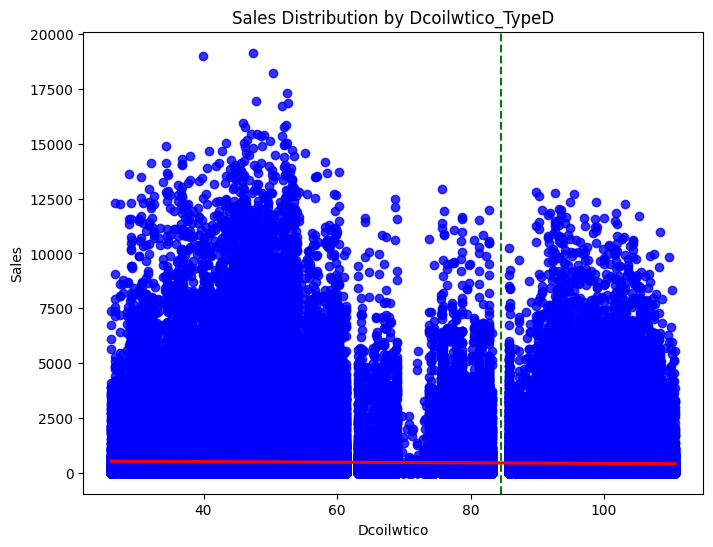

In [ ]:
plt.figure(figsize=(8, 6))

sns.regplot(x='dcoilwtico', y='sales', data=typeD, scatter_kws={'color': 'blue'}, line_kws={'color': 'red'})
plt.axvline(x=84.5, color='green', linestyle='--') # 84.5 구분선

# 그래프 제목 및 레이블 설정
plt.title('Sales Distribution by Dcoilwtico_TypeD')
plt.xlabel('Dcoilwtico')
plt.ylabel('Sales')
plt.show()

- 큰 상관은 없어 보인다.
- 다만 유가가 **84.5** 전후에서 두 개의 그룹으로 확연히 분리되는 것을 확인할 수 있다.

In [ ]:
under = typeD.loc[typeD['dcoilwtico'] <= 84.5,:]
over = typeD.loc[typeD['dcoilwtico'] > 84.5,:]

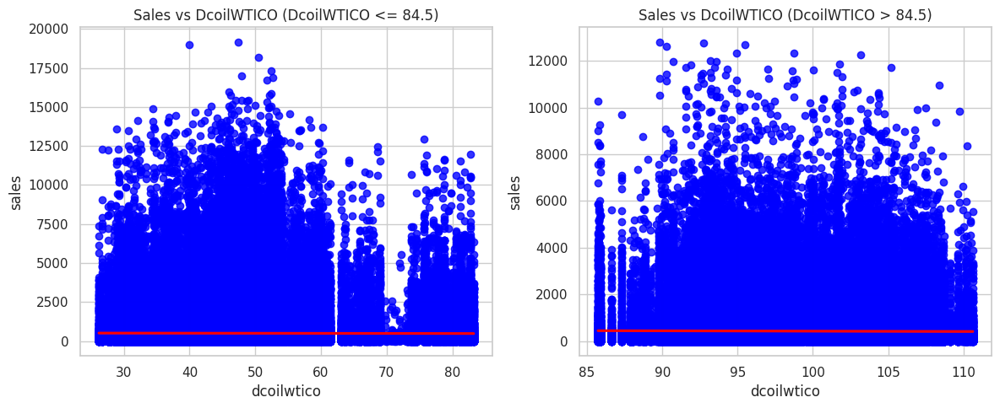

In [ ]:
sns.set(style="whitegrid")

fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Plot regplot for 'dcoilwtico' <= 84.5
sns.regplot(x='dcoilwtico', y='sales', data=under, ax=axes[0], scatter_kws={'color': 'blue'}, line_kws={'color': 'red'})
axes[0].set_title('Sales vs DcoilWTICO (DcoilWTICO <= 84.5)')

# Plot regplot for 'dcoilwtico' > 84.5
sns.regplot(x='dcoilwtico', y='sales', data=over, ax=axes[1], scatter_kws={'color': 'blue'}, line_kws={'color': 'red'})
axes[1].set_title('Sales vs DcoilWTICO (DcoilWTICO > 84.5)')

# Adjust layout
plt.tight_layout()
plt.show()

- 이상치를 제외하면 차이가 크지는 않다.
- 하지만 유가가 84.5 이상일 때는 sales가 14000이 넘는 경우가 아예 없는 반면, 유가가 84.5 이하일 때 sales가 14000이 넘는 경우가 다수 존재한다.
- 아주 유의미한 결과는 아니지만 유가에 따라 sales에 한도가 생길 수 있다고 생각할 수 있다.

### **💗 transactions**

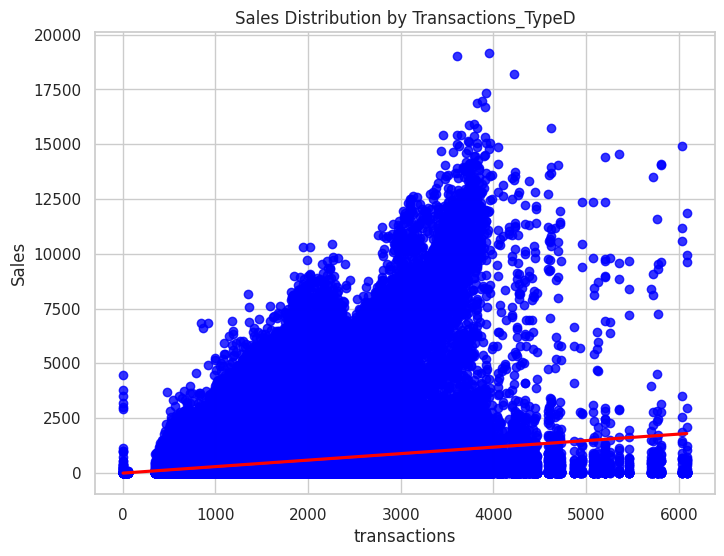

In [ ]:
plt.figure(figsize=(8, 6))

sns.regplot(x='transactions', y='sales', data=typeD, scatter_kws={'color': 'blue'}, line_kws={'color': 'red'})

# 그래프 제목 및 레이블 설정
plt.title('Sales Distribution by Transactions_TypeD')
plt.xlabel('transactions')
plt.ylabel('Sales')
plt.show()

- 약한 양의 상관관계를 보인다.

### **🤍 holiday**

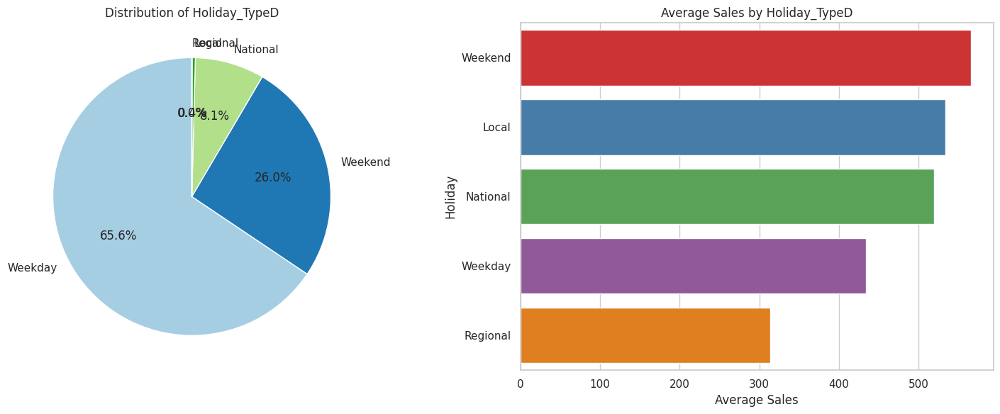

In [ ]:
plt.figure(figsize=(15, 6))

# 첫 번째 subplot: 파이 차트
plt.subplot(1, 2, 1)
holiday_counts = typeD['holiday'].value_counts()
plt.pie(holiday_counts, labels=holiday_counts.index, autopct='%1.1f%%', startangle=90, colors=plt.cm.Paired.colors)
plt.title('Distribution of Holiday_TypeD')

# 두 번째 subplot: 막대 그래프
plt.subplot(1, 2, 2)
average_sales_by_holiday = typeD.groupby('holiday')['sales'].mean().sort_values(ascending=False)
sns.barplot(x='sales', y='holiday', data=typeD, order=average_sales_by_holiday.index, ci=None, palette = 'Set1')

plt.title('Average Sales by Holiday_TypeD')
plt.xlabel('Average Sales')
plt.ylabel('Holiday')
plt.tight_layout()
plt.show()

- 그냥 주말(공휴일은 제외됨)에 매출이 가장 좋다.

### **⭐Target 변수(Sales)**
- 여러 요인에 따라 매출이 어떻게 달라지는지 살펴보자.

#### **a) 시간 관련 변수**

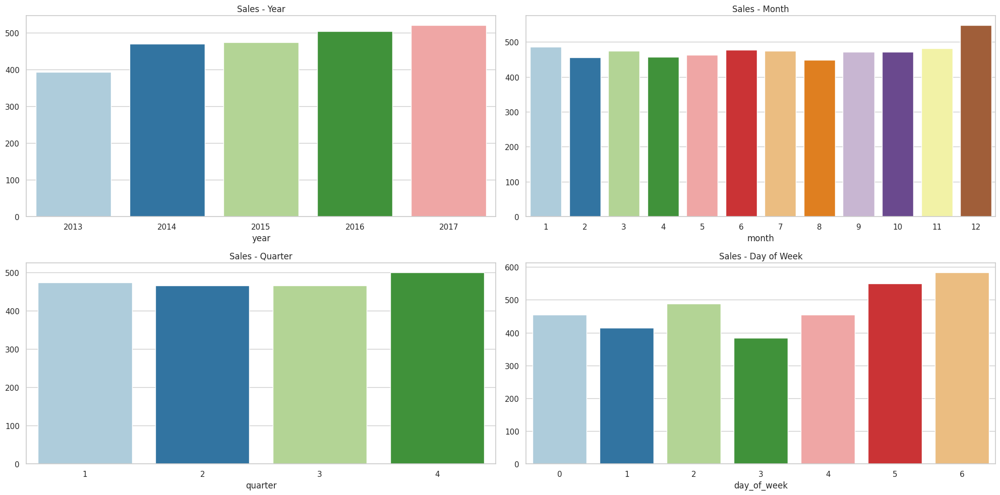

In [ ]:
### 평균 매출액으로 시각화
data_grouped_year = typeD.groupby(['year']).mean()['sales']
data_grouped_month = typeD.groupby(['month']).mean()['sales']
data_grouped_quarter = typeD.groupby(['quarter']).mean()['sales']
data_grouped_day = typeD.groupby(['day_of_week']).mean()['sales']

palette = sns.color_palette("Paired")

fig, axes = plt.subplots(2, 2, figsize=(20, 10))
# 연도별 매출
axes[0, 0].set_title('Sales - Year')
sns.barplot(x=data_grouped_year.index, y=data_grouped_year.values, ax=axes[0, 0], palette=palette)
# 월별 매출
axes[0, 1].set_title('Sales - Month')
sns.barplot(x=data_grouped_month.index, y=data_grouped_month.values, ax=axes[0, 1], palette=palette)
# 분기별 매출
axes[1, 0].set_title('Sales - Quarter')
sns.barplot(x=data_grouped_quarter.index, y=data_grouped_quarter.values, ax=axes[1, 0], palette=palette)
# 요일별 매출
axes[1, 1].set_title('Sales - Day of Week')
sns.barplot(x=data_grouped_day.index, y=data_grouped_day.values, ax=axes[1, 1], palette=palette)

plt.tight_layout()
plt.show()

**연도별 매출**
- 뒤로 갈수록 매출액이 점점 증가하고 있다.

**월별 & 분기별 매출**  
- 대체로 비슷한 경향을 보이나, 12월에 매출이 증가
- 4분기에 매출 증가

**요일별 매출**  
- 평일에 비해 주말의 매출액이 더 높다.

#### **b) 변수들 간의 상관관계**
- 상관계수는 수치형 변수들끼리만 비교 가능

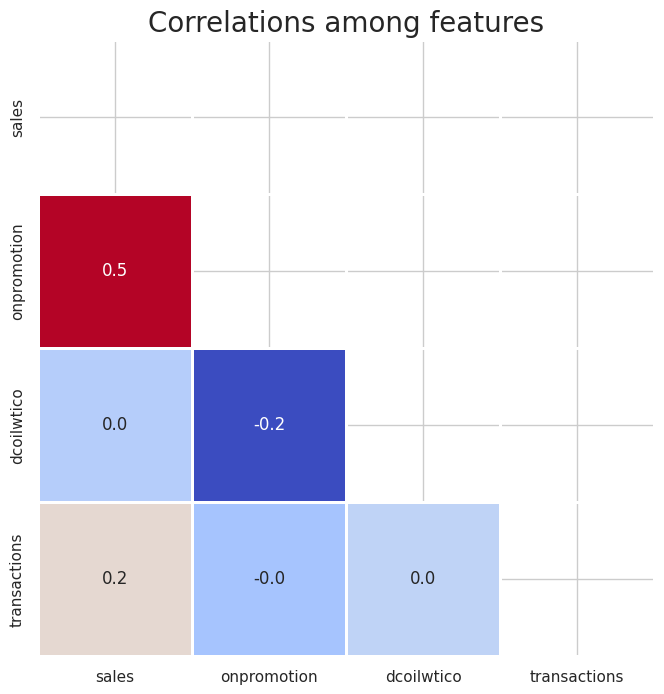

In [ ]:
num_ftrs = typeD[['sales', 'onpromotion','dcoilwtico','transactions']]

mask = np.triu(num_ftrs.corr(method = 'spearman'))

# heatmap을 이용한 시각화
plt.figure(figsize=(8, 8))
sns.heatmap(num_ftrs.corr(method = 'spearman'),
            annot=True,
            fmt='.1f',
            cmap='coolwarm',
            square=True,
            mask=mask,
            linewidths=1,
            cbar=False)
plt.title("Correlations among features", fontsize=20)
plt.show()

* sales와 유가의 상관계수는 무려 0이다.

* sales와 onpromotion의 상관계수는 0.5로 비교적 높은 편이다.

### **💡 후처리**

#### **최종 변수 선택**

In [ ]:
typeD.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 727225 entries, 1427 to 2705085
Data columns (total 16 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   id            727225 non-null  int64         
 1   date          727225 non-null  datetime64[ns]
 2   store_nbr     727225 non-null  int64         
 3   family        727225 non-null  object        
 4   sales         727225 non-null  float64       
 5   onpromotion   727225 non-null  float64       
 6   city          727225 non-null  object        
 7   state         727225 non-null  object        
 8   cluster       727225 non-null  int64         
 9   dcoilwtico    727225 non-null  float64       
 10  transactions  726107 non-null  float64       
 11  holiday       727225 non-null  object        
 12  year          727225 non-null  int64         
 13  quarter       727225 non-null  int64         
 14  month         727225 non-null  int64         
 15  day_of_week  

In [ ]:
typeD = typeD[['store_nbr', 'family', 'sales', 'onpromotion', 'city', 'cluster', 'dcoilwtico', 'holiday', 'year', 'quarter', 'month', 'day_of_week']]

# test의 경우에는 이후 submission 파일 작성을 위해 일단 id를 남겨두기로 결정
typeD_te = typeD_te[['id', 'store_nbr', 'family', 'onpromotion', 'city', 'cluster', 'dcoilwtico', 'holiday', 'year', 'quarter', 'month', 'day_of_week']]

In [ ]:
typeD.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 727225 entries, 1427 to 2705085
Data columns (total 12 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   store_nbr    727225 non-null  int64  
 1   family       727225 non-null  object 
 2   sales        727225 non-null  float64
 3   onpromotion  727225 non-null  float64
 4   city         727225 non-null  object 
 5   cluster      727225 non-null  int64  
 6   dcoilwtico   727225 non-null  float64
 7   holiday      727225 non-null  object 
 8   year         727225 non-null  int64  
 9   quarter      727225 non-null  int64  
 10  month        727225 non-null  int64  
 11  day_of_week  727225 non-null  int64  
dtypes: float64(3), int64(6), object(3)
memory usage: 72.1+ MB


#### **Train/Validation Split**

In [ ]:
from sklearn.model_selection import train_test_split

train, val = train_test_split(typeD, test_size=0.3, random_state=42, stratify=typeD[['store_nbr', 'family']]) # 가게별 비율 유지

In [ ]:
train.shape

(509057, 12)

In [ ]:
val.shape

(218168, 12)

#### **변수 왜곡 정도 확인**

In [ ]:
# 수치형 변수들에 대해서만 왜도 확인

train[['sales', 'onpromotion','dcoilwtico']].skew()

sales          4.41
onpromotion   11.35
dcoilwtico     0.61
dtype: float64

* sales와 onpromotion의 왜곡 정도가 매우 높음

In [ ]:
train['sales'] = np.log1p(train['sales'])
train['onpromotion'] = np.log1p(train['onpromotion'])

In [ ]:
train[['sales', 'onpromotion','dcoilwtico']].skew()

sales         0.08
onpromotion   2.14
dcoilwtico    0.61
dtype: float64

- 왜곡 정도가 많이 개선되었다.

In [ ]:
val['onpromotion'] = np.log1p(val['onpromotion'])
typeD_te['onpromotion'] = np.log1p(typeD_te['onpromotion'])

#### **스케일링**
- 수치형 변수들에 대한 스케일링 진행

In [ ]:
from sklearn.preprocessing import StandardScaler

# Initialize StandardScaler
scaler = StandardScaler()

# Fit and transform the selected variables
train[['onpromotion', 'dcoilwtico']] = scaler.fit_transform(train[['onpromotion', 'dcoilwtico']])
val[['onpromotion', 'dcoilwtico']] = scaler.transform(val[['onpromotion', 'dcoilwtico']])
typeD_te[['onpromotion', 'dcoilwtico']] = scaler.transform(typeD_te[['onpromotion', 'dcoilwtico']])

In [ ]:
train.head()

,store_nbr,family,sales,onpromotion,city,cluster,dcoilwtico,holiday,year,quarter,month,day_of_week
1902173,53,HARDWARE,1.10,0.55,Manta,13,-0.77,National,2016,2,5,0
1242020,41,MEATS,5.12,-0.52,Machala,4,-0.55,Weekday,2015,2,4,2
2674596,8,AUTOMOTIVE,2.20,-0.52,Quito,8,-0.57,Weekend,2017,3,7,5
2404174,27,DELI,5.38,1.38,Daule,1,-0.40,Weekday,2017,1,2,1
2491991,1,HOME CARE,3.81,0.83,Quito,13,-0.44,National,2017,2,4,4


In [ ]:
val.head()

,store_nbr,family,sales,onpromotion,city,cluster,dcoilwtico,holiday,year,quarter,month,day_of_week
554642,38,PERSONAL CARE,302.00,-0.52,Loja,4,1.20,Weekday,2014,1,1,1
1956634,7,LAWN AND GARDEN,5.00,-0.52,Quito,8,-0.61,Weekday,2016,2,6,4
1859383,23,BREAD/BAKERY,265.48,0.15,Ambato,9,-1.08,Weekday,2016,2,4,3
2398272,5,HOME CARE,301.00,1.23,Santo Domingo,4,-0.42,Weekend,2017,1,2,5
2263327,26,CLEANING,362.00,1.91,Guayaquil,10,-0.58,Weekday,2016,4,11,2


In [ ]:
typeD_te.head()

,id,store_nbr,family,onpromotion,city,cluster,dcoilwtico,holiday,year,quarter,month,day_of_week
0,3000888,1,AUTOMOTIVE,-0.52,Quito,13,-0.69,Weekday,2017,3,8,2
1,3000889,1,BABY CARE,-0.52,Quito,13,-0.69,Weekday,2017,3,8,2
2,3000890,1,BEAUTY,0.55,Quito,13,-0.69,Weekday,2017,3,8,2
3,3000891,1,BEVERAGES,2.46,Quito,13,-0.69,Weekday,2017,3,8,2
4,3000892,1,BOOKS,-0.52,Quito,13,-0.69,Weekday,2017,3,8,2


#### **범주형 변수 처리**

In [ ]:
train = pd.get_dummies(train, columns=['store_nbr','family', 'city', 'cluster', 'holiday', 'year', 'quarter', 'month', 'day_of_week'])
train.head()

,sales,onpromotion,dcoilwtico,store_nbr_1,store_nbr_2,store_nbr_3,store_nbr_4,store_nbr_5,store_nbr_6,store_nbr_7,store_nbr_8,store_nbr_23,store_nbr_24,store_nbr_25,store_nbr_26,store_nbr_27,store_nbr_37,store_nbr_38,store_nbr_41,store_nbr_42,store_nbr_53,family_AUTOMOTIVE,family_BABY CARE,family_BEAUTY,family_BEVERAGES,family_BOOKS,family_BREAD/BAKERY,family_CELEBRATION,family_CLEANING,family_DAIRY,family_DELI,family_EGGS,family_FROZEN FOODS,family_GROCERY I,family_GROCERY II,family_HARDWARE,family_HOME AND KITCHEN I,family_HOME AND KITCHEN II,family_HOME APPLIANCES,family_HOME CARE,family_LADIESWEAR,family_LAWN AND GARDEN,family_LINGERIE,"family_LIQUOR,WINE,BEER",family_MAGAZINES,family_MEATS,family_PERSONAL CARE,family_PET SUPPLIES,family_PLAYERS AND ELECTRONICS,family_POULTRY,family_PREPARED FOODS,family_PRODUCE,family_SCHOOL AND OFFICE SUPPLIES,family_SEAFOOD,city_Ambato,city_Cuenca,city_Daule,city_Guayaquil,city_Loja,city_Machala,city_Manta,city_Quito,city_Salinas,city_Santo Domingo,cluster_1,cluster_2,cluster_4,cluster_8,cluster_9,cluster_10,cluster_13,holiday_Local,holiday_National,holiday_Regional,holiday_Weekday,holiday_Weekend,year_2013,year_2014,year_2015,year_2016,year_2017,quarter_1,quarter_2,quarter_3,quarter_4,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12,day_of_week_0,day_of_week_1,day_of_week_2,day_of_week_3,day_of_week_4,day_of_week_5,day_of_week_6
1902173,1.10,0.55,-0.77,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0
1242020,5.12,-0.52,-0.55,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
2674596,2.20,-0.52,-0.57,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0
2404174,5.38,1.38,-0.40,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
2491991,3.81,0.83,-0.44,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0


In [ ]:
val = pd.get_dummies(val, columns=['store_nbr','family', 'city', 'cluster', 'holiday', 'year', 'quarter', 'month', 'day_of_week'])
val.head()

,sales,onpromotion,dcoilwtico,store_nbr_1,store_nbr_2,store_nbr_3,store_nbr_4,store_nbr_5,store_nbr_6,store_nbr_7,store_nbr_8,store_nbr_23,store_nbr_24,store_nbr_25,store_nbr_26,store_nbr_27,store_nbr_37,store_nbr_38,store_nbr_41,store_nbr_42,store_nbr_53,family_AUTOMOTIVE,family_BABY CARE,family_BEAUTY,family_BEVERAGES,family_BOOKS,family_BREAD/BAKERY,family_CELEBRATION,family_CLEANING,family_DAIRY,family_DELI,family_EGGS,family_FROZEN FOODS,family_GROCERY I,family_GROCERY II,family_HARDWARE,family_HOME AND KITCHEN I,family_HOME AND KITCHEN II,family_HOME APPLIANCES,family_HOME CARE,family_LADIESWEAR,family_LAWN AND GARDEN,family_LINGERIE,"family_LIQUOR,WINE,BEER",family_MAGAZINES,family_MEATS,family_PERSONAL CARE,family_PET SUPPLIES,family_PLAYERS AND ELECTRONICS,family_POULTRY,family_PREPARED FOODS,family_PRODUCE,family_SCHOOL AND OFFICE SUPPLIES,family_SEAFOOD,city_Ambato,city_Cuenca,city_Daule,city_Guayaquil,city_Loja,city_Machala,city_Manta,city_Quito,city_Salinas,city_Santo Domingo,cluster_1,cluster_2,cluster_4,cluster_8,cluster_9,cluster_10,cluster_13,holiday_Local,holiday_National,holiday_Regional,holiday_Weekday,holiday_Weekend,year_2013,year_2014,year_2015,year_2016,year_2017,quarter_1,quarter_2,quarter_3,quarter_4,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12,day_of_week_0,day_of_week_1,day_of_week_2,day_of_week_3,day_of_week_4,day_of_week_5,day_of_week_6
554642,302.00,-0.52,1.20,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
1956634,5.00,-0.52,-0.61,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0
1859383,265.48,0.15,-1.08,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
2398272,301.00,1.23,-0.42,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
2263327,362.00,1.91,-0.58,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0


In [ ]:
train.shape

(509057, 104)

In [ ]:
val.shape

(218168, 104)

- 103개의 feature 변수, 1개의 target 변수

In [ ]:
typeD_te = pd.get_dummies(typeD_te, columns=['store_nbr','family', 'city', 'cluster', 'holiday', 'year', 'quarter', 'month', 'day_of_week'])
typeD_te.head()

,id,onpromotion,dcoilwtico,store_nbr_1,store_nbr_2,store_nbr_3,store_nbr_4,store_nbr_5,store_nbr_6,store_nbr_7,store_nbr_8,store_nbr_23,store_nbr_24,store_nbr_25,store_nbr_26,store_nbr_27,store_nbr_37,store_nbr_38,store_nbr_41,store_nbr_42,store_nbr_53,family_AUTOMOTIVE,family_BABY CARE,family_BEAUTY,family_BEVERAGES,family_BOOKS,family_BREAD/BAKERY,family_CELEBRATION,family_CLEANING,family_DAIRY,family_DELI,family_EGGS,family_FROZEN FOODS,family_GROCERY I,family_GROCERY II,family_HARDWARE,family_HOME AND KITCHEN I,family_HOME AND KITCHEN II,family_HOME APPLIANCES,family_HOME CARE,family_LADIESWEAR,family_LAWN AND GARDEN,family_LINGERIE,"family_LIQUOR,WINE,BEER",family_MAGAZINES,family_MEATS,family_PERSONAL CARE,family_PET SUPPLIES,family_PLAYERS AND ELECTRONICS,family_POULTRY,family_PREPARED FOODS,family_PRODUCE,family_SCHOOL AND OFFICE SUPPLIES,family_SEAFOOD,city_Ambato,city_Cuenca,city_Daule,city_Guayaquil,city_Loja,city_Machala,city_Manta,city_Quito,city_Salinas,city_Santo Domingo,cluster_1,cluster_2,cluster_4,cluster_8,cluster_9,cluster_10,cluster_13,holiday_Local,holiday_Weekday,holiday_Weekend,year_2017,quarter_3,month_8,day_of_week_0,day_of_week_1,day_of_week_2,day_of_week_3,day_of_week_4,day_of_week_5,day_of_week_6
0,3000888,-0.52,-0.69,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,1,1,1,0,0,1,0,0,0,0
1,3000889,-0.52,-0.69,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,1,1,1,0,0,1,0,0,0,0
2,3000890,0.55,-0.69,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,1,1,1,0,0,1,0,0,0,0
3,3000891,2.46,-0.69,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,1,1,1,0,0,1,0,0,0,0
4,3000892,-0.52,-0.69,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,1,1,1,0,0,1,0,0,0,0


In [ ]:
typeD_te.shape

(9504, 84)

In [ ]:
train.columns.difference(typeD_te.columns)

Index(['holiday_National', 'holiday_Regional', 'month_1', 'month_10',
       'month_11', 'month_12', 'month_2', 'month_3', 'month_4', 'month_5',
       'month_6', 'month_7', 'month_9', 'quarter_1', 'quarter_2', 'quarter_4',
       'sales', 'year_2013', 'year_2014', 'year_2015', 'year_2016'],
      dtype='object')

- 차이가 나는 부분
  - holiday
  - year
  - quarter
  - month

In [ ]:
## 변수 추가

typeD_te[['holiday_National', 'holiday_Regional', 'year_2013', 'year_2014', 'year_2015', 'year_2016', 'month_1', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6', 'month_7', 'month_9', 'month_10', 'month_11', 'month_12', 'quarter_1', 'quarter_2', 'quarter_4']] = 0

In [ ]:
typeD_te.shape

(9504, 104)

In [ ]:
train.columns.difference(typeD_te.columns)

Index(['sales'], dtype='object')

In [ ]:
typeD_te.columns.difference(train.columns)

Index(['id'], dtype='object')

* id와 sales를 제외하고 모든 칼럼이 동일하게 들어감

In [ ]:
# 최종 파일 저장

train.to_csv('/content/drive/MyDrive/Colab Notebooks/ESAA/OB/방학프로젝트/trainD.csv', index = False)
val.to_csv('/content/drive/MyDrive/Colab Notebooks/ESAA/OB/방학프로젝트/valD.csv', index = False)
typeD_te.to_csv('/content/drive/MyDrive/Colab Notebooks/ESAA/OB/방학프로젝트/testD.csv', index = False)

## **4-5. Type E**

In [ ]:
typeE.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 137052 entries, 1491 to 2705032
Data columns (total 17 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   id            137052 non-null  int64         
 1   date          137052 non-null  datetime64[ns]
 2   store_nbr     137052 non-null  int64         
 3   family        137052 non-null  object        
 4   sales         137052 non-null  float64       
 5   onpromotion   137052 non-null  float64       
 6   city          137052 non-null  object        
 7   state         137052 non-null  object        
 8   type          137052 non-null  object        
 9   cluster       137052 non-null  int64         
 10  dcoilwtico    137052 non-null  float64       
 11  transactions  136815 non-null  float64       
 12  holiday       137052 non-null  object        
 13  year          137052 non-null  int64         
 14  quarter       137052 non-null  int64         
 15  month        

### **🧡 store_nbr**

In [ ]:
# 고유한 매장 수

typeE['store_nbr'].unique()

array([43, 28, 36, 29])

* 4개 매장

In [ ]:
### 각 매장별 매출 총액 시도표(일 단위)

e = typeE.set_index("date").groupby("store_nbr").resample("D").sales.sum().reset_index()
px.line(e, x = "date", y= "sales", color = "store_nbr", title = "Daily total sales of the stores_Type E")

#### **📌 이상치 제거**

In [ ]:
typeE.shape

(137052, 17)

> 원래는 137052건의 데이터

In [ ]:
typeE.groupby(['store_nbr', 'family'])['sales'].describe()

count    mean     std    min     25%  \
store_nbr family                                                              
28        AUTOMOTIVE                 1648.00    7.30    4.68   1.00    4.00   
          BABY CARE                    31.00    1.39    0.92   1.00    1.00   
          BEAUTY                     1262.00    2.59    2.01   1.00    1.00   
          BEVERAGES                  1679.00 2249.37 1423.44 226.00 1020.00   
          BREAD/BAKERY               1679.00  564.30  212.46 212.00  421.50   
...                                      ...     ...     ...    ...     ...   
43        POULTRY                    1674.00  170.41  300.49   3.46  114.76   
          PREPARED FOODS             1674.00   60.25   31.47   6.00   39.00   
          PRODUCE                    1012.00  815.73  377.26   1.00  556.88   
          SCHOOL AND OFFICE SUPPLIES  324.00    9.00   14.24   1.00    2.00   
          SEAFOOD                     611.00    2.05    1.55   1.00    1.00   

                                         50%     75%      max  
store_nbr family                                               
28        AUTOMOTIVE                    6.00   10.00    37.00  
          BABY CARE                     1.00    1.00     5.00  
          BEAUTY                        2.00    3.00    15.00  
          BEVERAGES                  2105.00 3017.00  9848.00  
          BREAD/BAKERY                511.00  632.50  1466.00  
...                                      ...     ...      ...  
43        POULTRY                     154.32  201.35 12143.20  
          PREPARED FOODS               54.00   73.00   252.80  
          PRODUCE                     688.55  980.92  2884.44  
          SCHOOL AND OFFICE SUPPLIES    4.00    9.00   108.00  
          SEAFOOD                       1.00    2.00    11.00  

[125 rows x 8 columns]

In [ ]:
### 이상치 탐지 함수

def get_outlier_indices(df_col, weight=3):
    q1, q3 = np.percentile(df_col, [25, 75])
    iqr = q3 - q1
    iqr_weight = iqr * weight

    lowest_val, highest_val = q1 - iqr_weight, q3 + iqr_weight
    outlier_indices = df_col[(df_col < lowest_val) | (df_col > highest_val)].index

    return outlier_indices

In [ ]:
cols = ['store_nbr', 'family']

# 제거할 행(row)의 인덱스를 저장
rows_to_drop = []

for col in cols:
    # 'store_nbr', 'family'을 기준으로 데이터를 그룹화
    grouped = typeE.groupby(cols)
    # 각 그룹에 대해 이상치를 찾아내고 인덱스를 추가
    for (_, group_data) in grouped:
        outlier_indices = get_outlier_indices(group_data['sales'], weight=3)
        rows_to_drop.extend(outlier_indices)

# 이상치 제거
typeE = typeE.drop(rows_to_drop)

In [ ]:
typeE.shape

(135476, 17)

> 135476건으로 데이터 감소

In [ ]:
typeE.groupby(['store_nbr', 'family'])['sales'].describe()

count    mean     std    min     25%  \
store_nbr family                                                              
28        AUTOMOTIVE                 1644.00    7.23    4.51   1.00    4.00   
          BABY CARE                    24.00    1.00    0.00   1.00    1.00   
          BEAUTY                     1246.00    2.48    1.73   1.00    1.00   
          BEVERAGES                  1678.00 2244.85 1411.72 226.00 1019.00   
          BREAD/BAKERY               1666.00  558.09  201.16 212.00  421.00   
...                                      ...     ...     ...    ...     ...   
43        POULTRY                    1667.00  161.97   64.17   3.46  114.53   
          PREPARED FOODS             1653.00   58.36   26.71   6.00   39.00   
          PRODUCE                    1007.00  807.37  358.60   1.00  556.44   
          SCHOOL AND OFFICE SUPPLIES  300.00    5.67    5.95   1.00    2.00   
          SEAFOOD                     578.00    1.77    1.02   1.00    1.00   

                                         50%     75%     max  
store_nbr family                                              
28        AUTOMOTIVE                    6.00   10.00   27.00  
          BABY CARE                     1.00    1.00    1.00  
          BEAUTY                        2.00    3.00    9.00  
          BEVERAGES                  2103.50 3013.00 9005.00  
          BREAD/BAKERY                509.50  629.75 1265.00  
...                                      ...     ...     ...  
43        POULTRY                     153.99  200.26  455.12  
          PREPARED FOODS               53.00   72.00  173.07  
          PRODUCE                     686.77  975.64 2247.58  
          SCHOOL AND OFFICE SUPPLIES    3.50    8.00   29.00  
          SEAFOOD                       1.00    2.00    5.00  

[125 rows x 8 columns]

In [ ]:
e = typeE.set_index("date").groupby("store_nbr").resample("D").sales.sum().reset_index()
px.line(e, x = "date", y= "sales", color = "store_nbr", title = "Daily total sales of the stores_Type E")

- 28번 store가 대체로 판매량이 제일 높음
- 29번 store는 2015년 이후에 개장한 점이 확인됨
- 36번 store도 28번, 43번 store에 비해 늦게 개장한 점이 확인됨

### **💛 family**

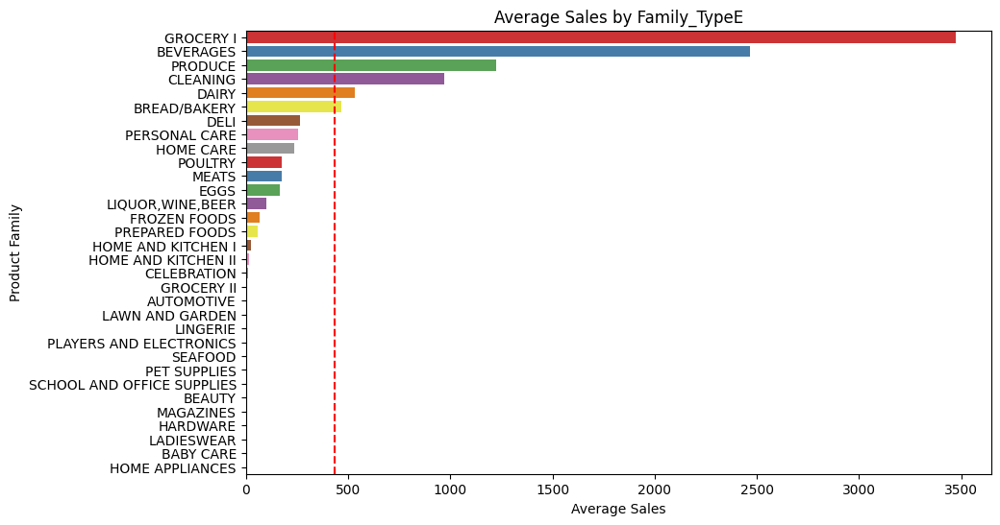

In [ ]:
### 각 품목별로 매출에 미치는 영향

# 각 family 별로 'sales'의 평균을 계산하고, 내림차순으로 정렬
average_sales_by_family = typeE.groupby('family')['sales'].mean().sort_values(ascending=False)

## 시각화
import seaborn as sns
plt.figure(figsize=(10, 6))
sns.barplot(x='sales', y='family', data=typeE, order=average_sales_by_family.index, ci=None, palette = 'Set1')
plt.axvline(x=typeE['sales'].mean(), color='red', linestyle='--') # 매출 전체 평균

# 그래프 제목 및 레이블 설정
plt.title('Average Sales by Family_TypeE')
plt.xlabel('Average Sales')
plt.ylabel('Product Family')
plt.show()

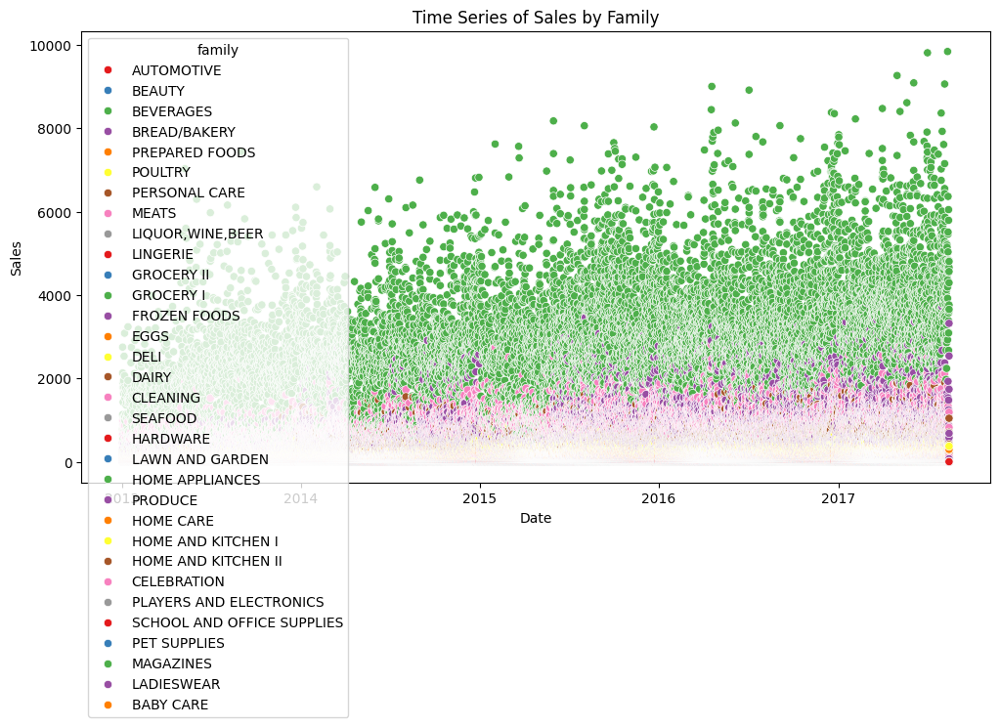

In [ ]:
# 시각화
plt.figure(figsize=(12, 6))
sns.scatterplot(x='date', y='sales', hue='family', data=typeE, palette='Set1')
plt.title('Time Series of Sales by Family')
plt.xlabel('Date')
plt.ylabel('Sales')
plt.show()

In [ ]:
typeE['family'].nunique()

32

### **💚 onpromotion**

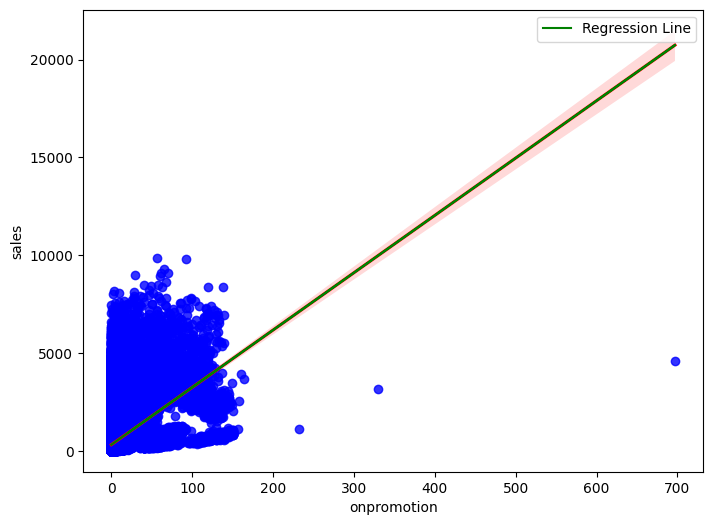

                            OLS Regression Results                            
Dep. Variable:                  sales   R-squared:                       0.213
Model:                            OLS   Adj. R-squared:                  0.213
Method:                 Least Squares   F-statistic:                 3.666e+04
Date:                Fri, 19 Jan 2024   Prob (F-statistic):               0.00
Time:                        08:46:16   Log-Likelihood:            -1.1008e+06
No. Observations:              135476   AIC:                         2.202e+06
Df Residuals:                  135474   BIC:                         2.202e+06
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const         307.9767      2.317    132.898      

In [ ]:
import statsmodels.api as sm
# 회귀 모델 적합
model = sm.OLS(typeE['sales'], sm.add_constant(typeE['onpromotion']))
results = model.fit()

# 시각화
plt.figure(figsize=(8, 6))
sns.regplot(x='onpromotion', y='sales', data=typeE, scatter_kws={'color': 'blue'}, line_kws={'color': 'red'})
plt.plot(typeE['onpromotion'], results.fittedvalues, color='green', label='Regression Line')
plt.legend()
plt.show()

# 회귀 결과 출력
print(results.summary())

### **💙 state**

In [ ]:
# 고유한 주(state) 수

typeE['state'].unique()

array(['Esmeraldas', 'Guayas'], dtype=object)

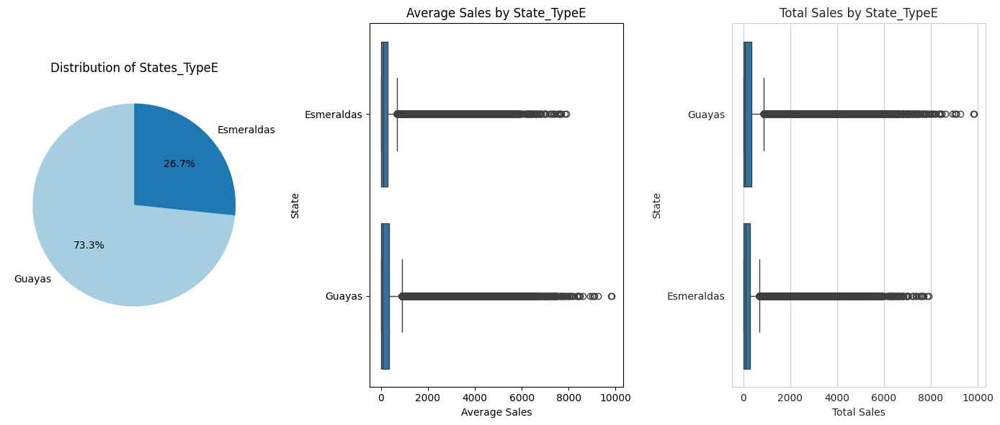

In [ ]:
plt.figure(figsize=(14, 6))

# 첫 번째 subplot: 파이 차트
plt.subplot(1, 3, 1)
state_counts = typeE['state'].value_counts()
plt.pie(state_counts, labels=state_counts.index, autopct='%1.1f%%', startangle=90, colors=plt.cm.Paired.colors)
plt.title('Distribution of States_TypeE')

# 두 번째 subplot: 박스 그래프
plt.subplot(1, 3, 2)
average_sales_by_state = typeE.groupby('state')['sales'].mean().sort_values(ascending=False)
sns.set_style("whitegrid")
sns.boxplot(x='sales', y='state', data=typeE, order=average_sales_by_state.index,orient='h')
plt.title('Average Sales by State_TypeE')
plt.xlabel('Average Sales')
plt.ylabel('State')


# 세 번째 subplot: 박스 그래프
plt.subplot(1, 3, 3)
average_sales_by_state = typeE.groupby('state')['sales'].sum().sort_values(ascending=False)
sns.set_style("whitegrid")
sns.boxplot(x='sales', y='state', data=typeE, order=average_sales_by_state.index,orient='h')


plt.title('Total Sales by State_TypeE')
plt.xlabel('Total Sales')
plt.ylabel('State')
plt.tight_layout()
plt.show()

typeE에서는 stae 중 Guayas의 값이 더 많고 average sales의 경우 Guayas에 더 이상치가 많음. 그리고 total sales의 경우에도 마찬가지로

In [ ]:
typeE.groupby('state')['store_nbr'].unique()

state
Esmeraldas            [43]
Guayas        [28, 36, 29]
Name: store_nbr, dtype: object

### **💜 city**

In [ ]:
typeE.groupby('city')['store_nbr'].unique()

city
Esmeraldas        [43]
Guayaquil     [28, 29]
Libertad          [36]
Name: store_nbr, dtype: object

In [ ]:
typeE.groupby('state')['city'].unique()

state
Esmeraldas             [Esmeraldas]
Guayas        [Guayaquil, Libertad]
Name: city, dtype: object

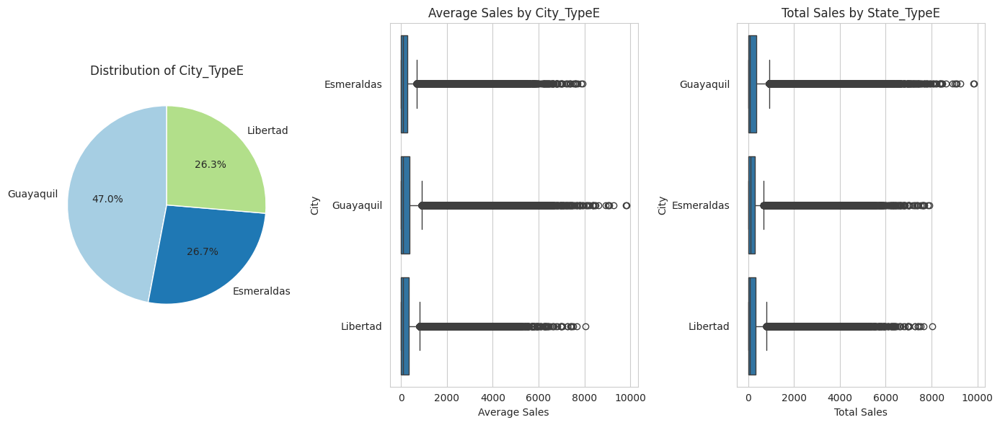

In [ ]:
plt.figure(figsize=(14, 6))

# 첫 번째 subplot: 파이 차트
plt.subplot(1, 3, 1)
city_counts = typeE['city'].value_counts()
plt.pie(city_counts, labels=city_counts.index, autopct='%1.1f%%', startangle=90, colors=plt.cm.Paired.colors)
plt.title('Distribution of City_TypeE')

# 두 번째 subplot: 박스 그래프
plt.subplot(1, 3, 2)
average_sales_by_state = typeE.groupby('city')['sales'].mean().sort_values(ascending=False)
sns.set_style("whitegrid")
sns.boxplot(x='sales', y='city', data=typeE, order=average_sales_by_state.index)

plt.title('Average Sales by City_TypeE')
plt.xlabel('Average Sales')
plt.ylabel('City')


# 세 번째 subplot: 박스 그래프
plt.subplot(1, 3, 3)
sns.set_style("whitegrid")
average_sales_by_state = typeE.groupby('city')['sales'].sum().sort_values(ascending=False)
sns.boxplot(x='sales', y='city', data=typeE, order=average_sales_by_state.index,orient='h')


plt.title('Total Sales by State_TypeE')
plt.xlabel('Total Sales')
plt.ylabel('City')
plt.tight_layout()
plt.show()

city가 state에 비해 고르게 분포되어 있음 + city가 state의 하위변수이므로 state를 삭제하고 city로만 원핫인코딩할것

또한 average sales의 경우 Guayaquil에 이상치가 많고 total sales도 마찬가지

average sales의 값은 Esmeraldas가 Guayaquil보다 높고 total sales의 경우 그 반대임. 이상치 때문에 아닐까 생각됨

### **🤎dcoilwtico**

In [ ]:
import plotly.express as px

daily_oil_price = typeE.groupby("date")["dcoilwtico"].mean().reset_index()

# 그래프 그리기
fig = px.line(daily_oil_price, x="date", y="dcoilwtico", title="Daily DcoilWTICO Prices")
fig.show()

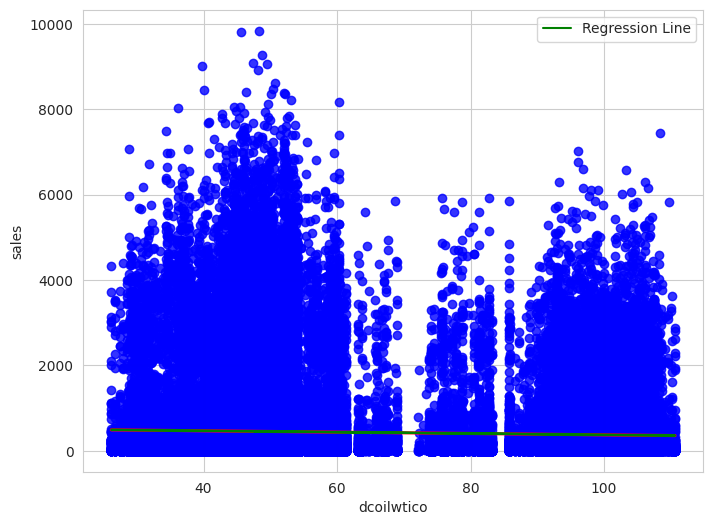

                            OLS Regression Results                            
Dep. Variable:                  sales   R-squared:                       0.002
Model:                            OLS   Adj. R-squared:                  0.002
Method:                 Least Squares   F-statistic:                     224.2
Date:                Fri, 19 Jan 2024   Prob (F-statistic):           1.23e-50
Time:                        08:32:43   Log-Likelihood:            -1.1169e+06
No. Observations:              135476   AIC:                         2.234e+06
Df Residuals:                  135474   BIC:                         2.234e+06
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        530.5129      6.921     76.655      0.0

In [ ]:
# 회귀 모델 적합
model = sm.OLS(typeE['sales'], sm.add_constant(typeE['dcoilwtico']))
results = model.fit()

# 시각화
plt.figure(figsize=(8, 6))
sns.regplot(x='dcoilwtico', y='sales', data=typeE, scatter_kws={'color': 'blue'}, line_kws={'color': 'red'})
plt.plot(typeE['dcoilwtico'], results.fittedvalues, color='green', label='Regression Line')
plt.legend()
plt.show()

# 회귀 결과 출력
print(results.summary())

*sales=536.66755-1.6429×dcoilwtico*
: 매우 약한 음의 상관관계를 보임

### **🤍 holiday**

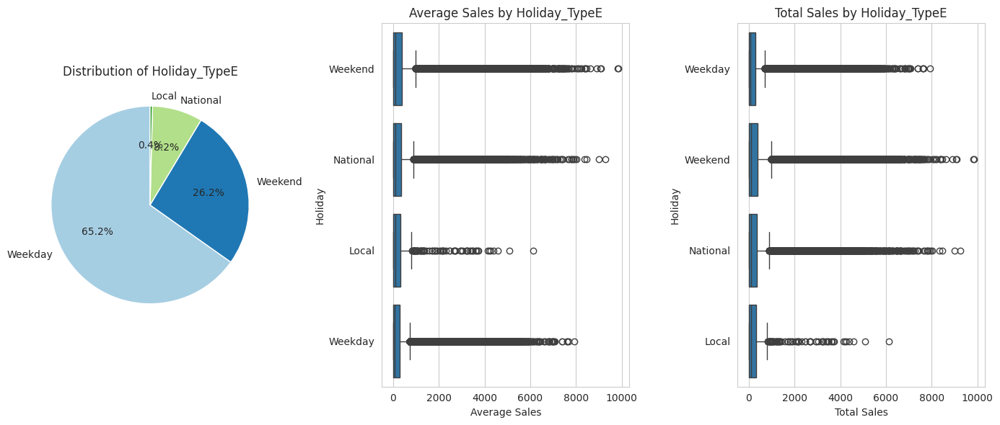

In [ ]:
plt.figure(figsize=(14, 6))

# 첫 번째 subplot: 파이 차트
plt.subplot(1, 3, 1)
holiday_counts = typeE['holiday'].value_counts()
plt.pie(holiday_counts, labels=holiday_counts.index, autopct='%1.1f%%', startangle=90, colors=plt.cm.Paired.colors)
plt.title('Distribution of Holiday_TypeE')

# 두 번째 subplot: 박스 그래프
plt.subplot(1, 3, 2)
average_sales_by_state = typeE.groupby('holiday')['sales'].mean().sort_values(ascending=False)
sns.set_style("whitegrid")
sns.boxplot(x='sales', y='holiday', data=typeE, order=average_sales_by_state.index,orient='h')
plt.title('Average Sales by Holiday_TypeE')
plt.xlabel('Average Sales')
plt.ylabel('Holiday')


# 세 번째 subplot: 박스 그래프
plt.subplot(1, 3, 3)
average_sales_by_state = typeE.groupby('holiday')['sales'].sum().sort_values(ascending=False)
sns.set_style("whitegrid")
sns.boxplot(x='sales', y='holiday', data=typeE, order=average_sales_by_state.index,orient='h')

plt.title('Total Sales by Holiday_TypeE')
plt.xlabel('Total Sales')
plt.ylabel('Holiday')
plt.tight_layout()
plt.show()

### **💗 cluster**

In [ ]:
typeE['cluster'].value_counts()
# cluster 변수 빼기로 결정

10    135476
Name: cluster, dtype: int64

In [ ]:
typeE_te.head()

,id,date,store_nbr,family,onpromotion,city,state,cluster,dcoilwtico,holiday,year,quarter,month,day_of_week
660,3001548,2017-08-16,28,AUTOMOTIVE,0,Guayaquil,Guayas,10,46.80,Weekday,2017,3,8,2
661,3001549,2017-08-16,28,BABY CARE,0,Guayaquil,Guayas,10,46.80,Weekday,2017,3,8,2
662,3001550,2017-08-16,28,BEAUTY,2,Guayaquil,Guayas,10,46.80,Weekday,2017,3,8,2
663,3001551,2017-08-16,28,BEVERAGES,47,Guayaquil,Guayas,10,46.80,Weekday,2017,3,8,2
664,3001552,2017-08-16,28,BOOKS,0,Guayaquil,Guayas,10,46.80,Weekday,2017,3,8,2


In [ ]:
typeE.head()

,id,date,store_nbr,family,sales,onpromotion,city,state,cluster,dcoilwtico,transactions,holiday,year,quarter,month,day_of_week
1491,1491,2013-01-02,43,AUTOMOTIVE,2.00,0.00,Esmeraldas,Esmeraldas,10,93.14,1385.00,Weekday,2013,1,1,2
1517,1517,2013-01-02,43,BEAUTY,2.00,0.00,Esmeraldas,Esmeraldas,10,93.14,1385.00,Weekday,2013,1,1,2
1546,1546,2013-01-02,43,BEVERAGES,1137.00,0.00,Esmeraldas,Esmeraldas,10,93.14,1385.00,Weekday,2013,1,1,2
1548,1548,2013-01-02,43,BREAD/BAKERY,291.00,0.00,Esmeraldas,Esmeraldas,10,93.14,1385.00,Weekday,2013,1,1,2
1602,1602,2013-01-02,43,PREPARED FOODS,35.00,0.00,Esmeraldas,Esmeraldas,10,93.14,1385.00,Weekday,2013,1,1,2


In [ ]:
typeE.groupby('city')['store_nbr'].unique()
# city도 store_nbr이 더 하위변수이니까 그냥 빼기..

city
Esmeraldas        [43]
Guayaquil     [28, 29]
Libertad          [36]
Name: store_nbr, dtype: object

### **⭐Target 변수(Sales)**
- 여러 요인에 따라 매출이 어떻게 달라지는지 살펴보자.

#### **a) 시간 관련 변수**

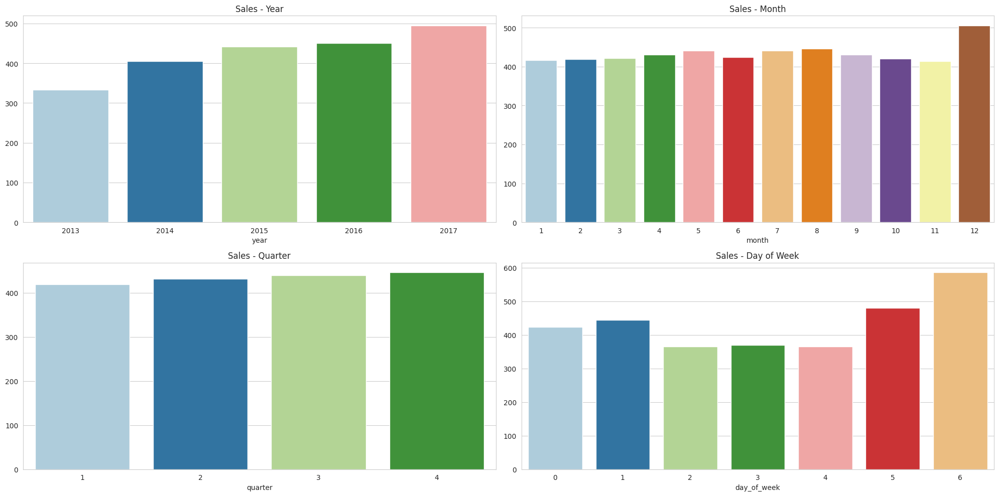

In [ ]:
### 평균 매출액으로 시각화
data_grouped_year = typeE.groupby(['year']).mean()['sales']
data_grouped_month = typeE.groupby(['month']).mean()['sales']
data_grouped_quarter = typeE.groupby(['quarter']).mean()['sales']
data_grouped_day = typeE.groupby(['day_of_week']).mean()['sales']

palette = sns.color_palette("Paired")

fig, axes = plt.subplots(2, 2, figsize=(20, 10))
# 연도별 매출
axes[0, 0].set_title('Sales - Year')
sns.barplot(x=data_grouped_year.index, y=data_grouped_year.values, ax=axes[0, 0], palette=palette)
# 월별 매출
axes[0, 1].set_title('Sales - Month')
sns.barplot(x=data_grouped_month.index, y=data_grouped_month.values, ax=axes[0, 1], palette=palette)
# 분기별 매출
axes[1, 0].set_title('Sales - Quarter')
sns.barplot(x=data_grouped_quarter.index, y=data_grouped_quarter.values, ax=axes[1, 0], palette=palette)
# 요일별 매출
axes[1, 1].set_title('Sales - Day of Week')
sns.barplot(x=data_grouped_day.index, y=data_grouped_day.values, ax=axes[1, 1], palette=palette)

plt.tight_layout()
plt.show()

#### **b) 변수들 간의 상관관계**
- 상관계수는 수치형 변수들끼리만 비교 가능

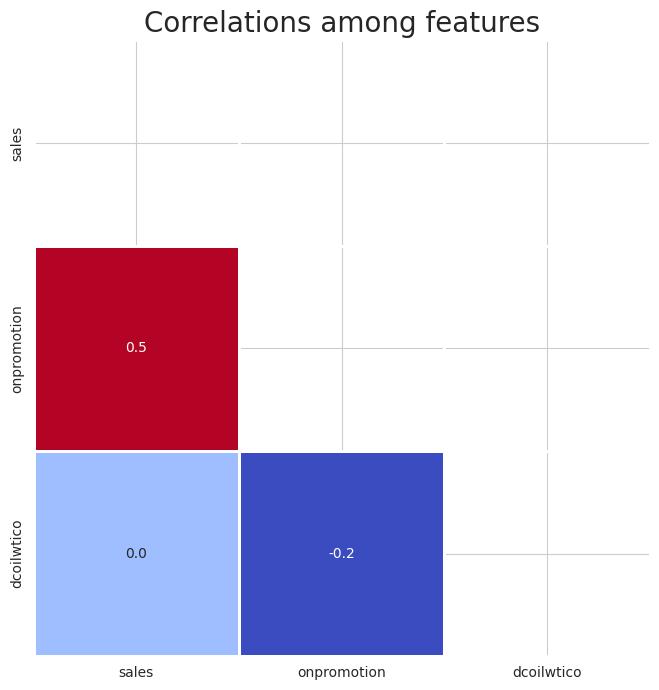

In [ ]:
num_ftrs = typeE[['sales', 'onpromotion','dcoilwtico']]

mask = np.triu(num_ftrs.corr(method = 'spearman'))

# heatmap을 이용한 시각화
plt.figure(figsize=(8, 8))
sns.heatmap(num_ftrs.corr(method = 'spearman'),
            annot=True,
            fmt='.1f',
            cmap='coolwarm',
            square=True,
            mask=mask,
            linewidths=1,
            cbar=False)
plt.title("Correlations among features", fontsize=20)
plt.show()

### **💡 후처리**

#### **최종 변수 선택**

In [ ]:
typeE.drop(['id','date', 'state','cluster','transactions','city'],axis=1,inplace=True)
typeE_te.drop(['date', 'state','cluster','city'],axis=1,inplace=True)

In [ ]:
typeE.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 135476 entries, 1491 to 2705032
Data columns (total 11 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   store_nbr    135476 non-null  int64  
 1   family       135476 non-null  object 
 2   sales        135476 non-null  float64
 3   onpromotion  135476 non-null  float64
 4   type         135476 non-null  object 
 5   dcoilwtico   135476 non-null  float64
 6   holiday      135476 non-null  object 
 7   year         135476 non-null  int64  
 8   quarter      135476 non-null  int64  
 9   month        135476 non-null  int64  
 10  day_of_week  135476 non-null  int64  
dtypes: float64(3), int64(5), object(3)
memory usage: 12.4+ MB


In [ ]:
typeE_te.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2112 entries, 660 to 27983
Data columns (total 11 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   id           2112 non-null   int64  
 1   store_nbr    2112 non-null   int64  
 2   family       2112 non-null   object 
 3   onpromotion  2112 non-null   int64  
 4   type         2112 non-null   object 
 5   dcoilwtico   2112 non-null   float64
 6   holiday      2112 non-null   object 
 7   year         2112 non-null   int64  
 8   quarter      2112 non-null   int64  
 9   month        2112 non-null   int64  
 10  day_of_week  2112 non-null   int64  
dtypes: float64(1), int64(7), object(3)
memory usage: 198.0+ KB


#### **변수 왜곡 정도 확인**

In [ ]:
# 왜도 확인
typeE[['sales', 'onpromotion','dcoilwtico']].skew()

sales         3.42
onpromotion   6.23
dcoilwtico    0.84
dtype: float64

In [ ]:
import numpy as np

print(np.log1p(typeE['sales']).skew())
print(np.log1p(typeE['onpromotion']).skew())

0.04477356047714623
1.9254910586532548


왜도 작아지는 걸 확인 -> 로그 변환하기

In [ ]:
typeE['sales']=np.log1p(typeE['sales'])
typeE['onpromotion']=np.log1p(typeE['onpromotion'])
typeE_te['onpromotion'] = np.log1p(typeE_te['onpromotion'])

#### **Train/Validation Split**

In [ ]:
from sklearn.model_selection import train_test_split

train, val = train_test_split(typeE, test_size=0.3, random_state=42, stratify=typeE[['store_nbr', 'family']]) # 가게별, 제품군별 비율 유지

#### **스케일링**

In [ ]:
from sklearn.preprocessing import StandardScaler

# Initialize StandardScaler
scaler = StandardScaler()

# Fit and transform the selected variables
train[['onpromotion', 'dcoilwtico']] = scaler.fit_transform(train[['onpromotion', 'dcoilwtico']])
val[['onpromotion', 'dcoilwtico']] = scaler.transform(val[['onpromotion', 'dcoilwtico']])
typeE_te[['onpromotion', 'dcoilwtico']] = scaler.transform(typeE_te[['onpromotion', 'dcoilwtico']])

In [ ]:
train.head()

,store_nbr,family,sales,onpromotion,type,dcoilwtico,holiday,year,quarter,month,day_of_week
1462278,36,BEVERAGES,8.01,0.45,E,-0.80,Weekend,2015,3,8,6
1947147,28,PLAYERS AND ELECTRONICS,2.30,-0.54,E,-0.50,Weekend,2016,2,5,5
2167917,29,"LIQUOR,WINE,BEER",3.30,-0.54,E,-0.48,Weekday,2016,4,10,2
330221,36,HOME APPLIANCES,0.69,-0.54,E,1.90,Weekend,2013,3,8,6
1328762,29,"LIQUOR,WINE,BEER",3.71,-0.54,E,-0.14,Weekday,2015,2,5,0


In [ ]:
val.head()

,store_nbr,family,sales,onpromotion,type,dcoilwtico,holiday,year,quarter,month,day_of_week
1624544,28,GROCERY I,7.80,1.70,E,-0.91,Weekday,2015,4,11,4
602185,36,LINGERIE,0.69,-0.54,E,1.64,Weekday,2014,1,2,4
2018665,43,POULTRY,4.78,-0.54,E,-0.67,Weekend,2016,3,7,5
557420,43,DAIRY,5.67,-0.54,E,1.28,Weekday,2014,1,1,3
1490349,43,BEVERAGES,8.36,0.08,E,-0.62,Weekday,2015,3,9,2


In [ ]:
typeE_te.head()

,id,store_nbr,family,onpromotion,type,dcoilwtico,holiday,year,quarter,month,day_of_week
660,3001548,28,AUTOMOTIVE,-0.54,E,-0.60,Weekday,2017,3,8,2
661,3001549,28,BABY CARE,-0.54,E,-0.60,Weekday,2017,3,8,2
662,3001550,28,BEAUTY,0.45,E,-0.60,Weekday,2017,3,8,2
663,3001551,28,BEVERAGES,2.95,E,-0.60,Weekday,2017,3,8,2
664,3001552,28,BOOKS,-0.54,E,-0.60,Weekday,2017,3,8,2


#### **범주형 변수 처리**

In [ ]:
train = pd.get_dummies(train, columns=['store_nbr','family', 'holiday', 'year', 'quarter', 'month', 'day_of_week'])
train.head()

,sales,onpromotion,type,dcoilwtico,store_nbr_28,store_nbr_29,store_nbr_36,store_nbr_43,family_AUTOMOTIVE,family_BABY CARE,family_BEAUTY,family_BEVERAGES,family_BREAD/BAKERY,family_CELEBRATION,family_CLEANING,family_DAIRY,family_DELI,family_EGGS,family_FROZEN FOODS,family_GROCERY I,family_GROCERY II,family_HARDWARE,family_HOME AND KITCHEN I,family_HOME AND KITCHEN II,family_HOME APPLIANCES,family_HOME CARE,family_LADIESWEAR,family_LAWN AND GARDEN,family_LINGERIE,"family_LIQUOR,WINE,BEER",family_MAGAZINES,family_MEATS,family_PERSONAL CARE,family_PET SUPPLIES,family_PLAYERS AND ELECTRONICS,family_POULTRY,family_PREPARED FOODS,family_PRODUCE,family_SCHOOL AND OFFICE SUPPLIES,family_SEAFOOD,holiday_Local,holiday_National,holiday_Weekday,holiday_Weekend,year_2013,year_2014,year_2015,year_2016,year_2017,quarter_1,quarter_2,quarter_3,quarter_4,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12,day_of_week_0,day_of_week_1,day_of_week_2,day_of_week_3,day_of_week_4,day_of_week_5,day_of_week_6
1462278,8.01,0.45,E,-0.80,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1
1947147,2.30,-0.54,E,-0.50,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0
2167917,3.30,-0.54,E,-0.48,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0
330221,0.69,-0.54,E,1.90,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1
1328762,3.71,-0.54,E,-0.14,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0


In [ ]:
val = pd.get_dummies(val, columns=['store_nbr','family', 'holiday', 'year', 'quarter', 'month', 'day_of_week'])
val.head()

,sales,onpromotion,type,dcoilwtico,store_nbr_28,store_nbr_29,store_nbr_36,store_nbr_43,family_AUTOMOTIVE,family_BABY CARE,family_BEAUTY,family_BEVERAGES,family_BREAD/BAKERY,family_CELEBRATION,family_CLEANING,family_DAIRY,family_DELI,family_EGGS,family_FROZEN FOODS,family_GROCERY I,family_GROCERY II,family_HARDWARE,family_HOME AND KITCHEN I,family_HOME AND KITCHEN II,family_HOME APPLIANCES,family_HOME CARE,family_LADIESWEAR,family_LAWN AND GARDEN,family_LINGERIE,"family_LIQUOR,WINE,BEER",family_MAGAZINES,family_MEATS,family_PERSONAL CARE,family_PET SUPPLIES,family_PLAYERS AND ELECTRONICS,family_POULTRY,family_PREPARED FOODS,family_PRODUCE,family_SCHOOL AND OFFICE SUPPLIES,family_SEAFOOD,holiday_Local,holiday_National,holiday_Weekday,holiday_Weekend,year_2013,year_2014,year_2015,year_2016,year_2017,quarter_1,quarter_2,quarter_3,quarter_4,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12,day_of_week_0,day_of_week_1,day_of_week_2,day_of_week_3,day_of_week_4,day_of_week_5,day_of_week_6
1624544,7.80,1.70,E,-0.91,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0
602185,0.69,-0.54,E,1.64,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
2018665,4.78,-0.54,E,-0.67,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0
557420,5.67,-0.54,E,1.28,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
1490349,8.36,0.08,E,-0.62,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0


In [ ]:
typeE_te = pd.get_dummies(typeE_te, columns=['store_nbr','family', 'holiday', 'year', 'quarter', 'month', 'day_of_week'])
typeE_te.head()

,id,onpromotion,type,dcoilwtico,store_nbr_28,store_nbr_29,store_nbr_36,store_nbr_43,family_AUTOMOTIVE,family_BABY CARE,family_BEAUTY,family_BEVERAGES,family_BOOKS,family_BREAD/BAKERY,family_CELEBRATION,family_CLEANING,family_DAIRY,family_DELI,family_EGGS,family_FROZEN FOODS,family_GROCERY I,family_GROCERY II,family_HARDWARE,family_HOME AND KITCHEN I,family_HOME AND KITCHEN II,family_HOME APPLIANCES,family_HOME CARE,family_LADIESWEAR,family_LAWN AND GARDEN,family_LINGERIE,"family_LIQUOR,WINE,BEER",family_MAGAZINES,family_MEATS,family_PERSONAL CARE,family_PET SUPPLIES,family_PLAYERS AND ELECTRONICS,family_POULTRY,family_PREPARED FOODS,family_PRODUCE,family_SCHOOL AND OFFICE SUPPLIES,family_SEAFOOD,holiday_Weekday,holiday_Weekend,year_2017,quarter_3,month_8,day_of_week_0,day_of_week_1,day_of_week_2,day_of_week_3,day_of_week_4,day_of_week_5,day_of_week_6
660,3001548,-0.54,E,-0.60,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,1,0,0,1,0,0,0,0
661,3001549,-0.54,E,-0.60,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,1,0,0,1,0,0,0,0
662,3001550,0.45,E,-0.60,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,1,0,0,1,0,0,0,0
663,3001551,2.95,E,-0.60,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,1,0,0,1,0,0,0,0
664,3001552,-0.54,E,-0.60,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,1,0,0,1,0,0,0,0


In [ ]:
print(train.shape)
print(val.shape)
print(typeE_te.shape)

(94833, 72)
(40643, 72)
(2112, 53)


- 72개의 feature 변수 + 1개의  target 변수
- test 데이터의 변수와 train  데이터의 변수 개수가 맞지 x

In [ ]:
train.columns.difference(typeE_te.columns)

Index(['holiday_Local', 'holiday_National', 'month_1', 'month_10', 'month_11',
       'month_12', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6',
       'month_7', 'month_9', 'quarter_1', 'quarter_2', 'quarter_4', 'sales',
       'year_2013', 'year_2014', 'year_2015', 'year_2016'],
      dtype='object')

In [ ]:
typeE_te.columns.difference(train.columns)

Index(['family_BOOKS', 'id'], dtype='object')

In [ ]:
typeE_te[['holiday_Local', 'holiday_National', 'month_1', 'month_10', 'month_11',
       'month_12', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6',
       'month_7', 'month_9', 'quarter_1', 'quarter_2', 'quarter_4',
       'year_2013', 'year_2014', 'year_2015', 'year_2016']] = 0

In [ ]:
train.columns.difference(typeE_te.columns)

Index(['sales'], dtype='object')

In [ ]:
typeE_te.columns.difference(train.columns)

Index(['family_BOOKS', 'id'], dtype='object')

- typeE는 `BOOKS` 제품군을 판매하지 x

In [ ]:
print(train.shape)
print(val.shape)
print(typeE_te.shape)

(94833, 72)
(40643, 72)
(2112, 73)


In [ ]:
# 최종 파일 저장
train.to_csv("/content/drive/MyDrive/ESAA 8기/OB/winter_proj/방학프로젝트/data/modeling/train/trainE.csv", index = False)
val.to_csv("/content/drive/MyDrive/ESAA 8기/OB/winter_proj/방학프로젝트/data/modeling/val/valE.csv", index = False)
typeE_te.to_csv("/content/drive/MyDrive/ESAA 8기/OB/winter_proj/방학프로젝트/data/modeling/test/testE.csv", index = False)